In [1]:
import numpy as np
import random as rd
import tensorflow as tf

import gensim
from gensim.models import KeyedVectors

from keras.layers import Dense, Embedding, Flatten, Input, concatenate
from keras.models import Model
from keras.optimizers import Adagrad

#Import another jupyter notebook
import import_ipynb
from Productive_CrossValidation_inclTest import *
from Productive_Data_GetTrainTest import samEval

C:\Users\Anja Tetzner\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


importing Jupyter notebook from Productive_CrossValidation_inclTest.ipynb
importing Jupyter notebook from Productive_TimeHistory.ipynb
importing Jupyter notebook from AttentionLayer.ipynb
importing Jupyter notebook from Productive_Data_GetTrainTest.ipynb


In [2]:
#for reproducability of the results
seed = 7
np.random.seed(seed)
tf.set_random_seed(seed)
rd.seed(seed)

In [3]:
path = 'data/'
outputpath ='outputs/03_difPretrainedEB_samEval2018/'

In [4]:
#Load necessary data
train_data, train_labels, test_data, test_labels, word_index, MAX_SEQUENCE_LENGTH = samEval()

### Hyperparameter for all models

In [5]:
BATCH_SIZE = 64
NUM_EPOCHS = 30
softmax = True
lossfunction ='binary_crossentropy'
optimizer = optimizer = Adagrad(lr=0.001)

### Shared methods

In [6]:
def txt_embeddings(file):
    embeddings = {}
    with open(file, 'r', encoding='utf-8') as f:
        for line in f:
            values = line.split()
            word = values[0]
            coefs = np.asarray(values[1:], dtype='float32')
            embeddings[word] = coefs
    return embeddings

def create_eb_matrix(eb_dict, dim):
    EMBEDDING_DIM=dim

    embedding_matrix= np.zeros((len(word_index)+1, EMBEDDING_DIM))

    for word, i in word_index.items():
        try:
            embedding_vector = eb_dict[word]
            embedding_matrix[i] = embedding_vector   
        except:
            # words not found in embeddings will be zero
            pass
    return embedding_matrix

def vec_embeddings(file):
    embedding= KeyedVectors.load_word2vec_format(file)
    word_vectors_fasttesxt_wiki = embedding.wv
    return word_vectors_fasttesxt_wiki

def bin_embeddings(file):
    embedding= KeyedVectors.load_word2vec_format(file, binary=True)
    word_vectors_fasttesxt_wiki = embedding.wv
    return word_vectors_fasttesxt_wiki

# GloVe

## GloVe 6B 50 Dim

In [38]:
#Load pretrained 6B 50 Dim GloVe-Embeddings
word_vectors_glove_6_50 = txt_embeddings(path+'glove.6B.50d.txt')
EMBEDDING_DIM = 50
embedding_matrix_glove_6_50 = create_eb_matrix(word_vectors_glove_6_50, EMBEDDING_DIM)

In [39]:
wv_layer = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_glove_6_50],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences = wv_layer(comment_input)

#First Dense Layer
x = Dense(600, activation='relu')(embedded_sequences)

x = Flatten()(x)

#Output (Dense) Layer
preds = Dense(2, activation='softmax')(x)

# build the model
model = Model(inputs=[comment_input], outputs=preds)

Instructions for updating:
Use tf.cast instead.

-----Fold 1--------


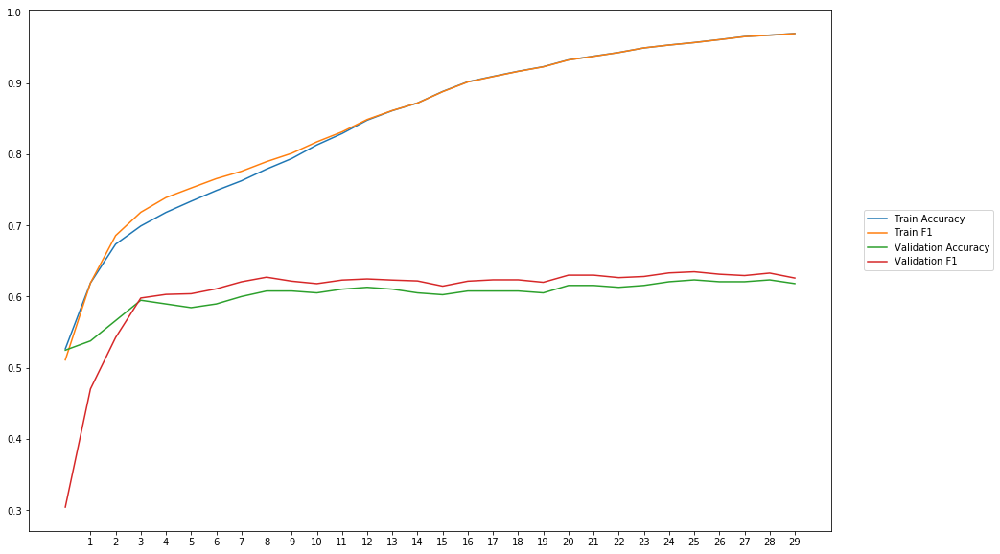

Average Accuracy: 60.22%
Average Precision: 59.63%
Average Recall: 61.94%
Average F1: 60.39%

-----Fold 2--------


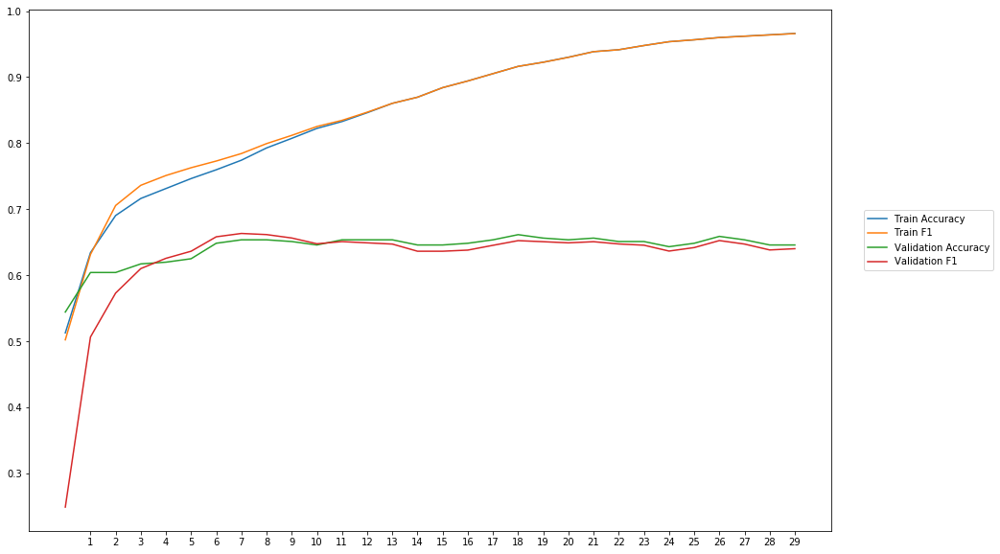

Average Accuracy: 64.16%
Average Precision: 64.84%
Average Recall: 61.54%
Average F1: 62.48%

-----Fold 3--------


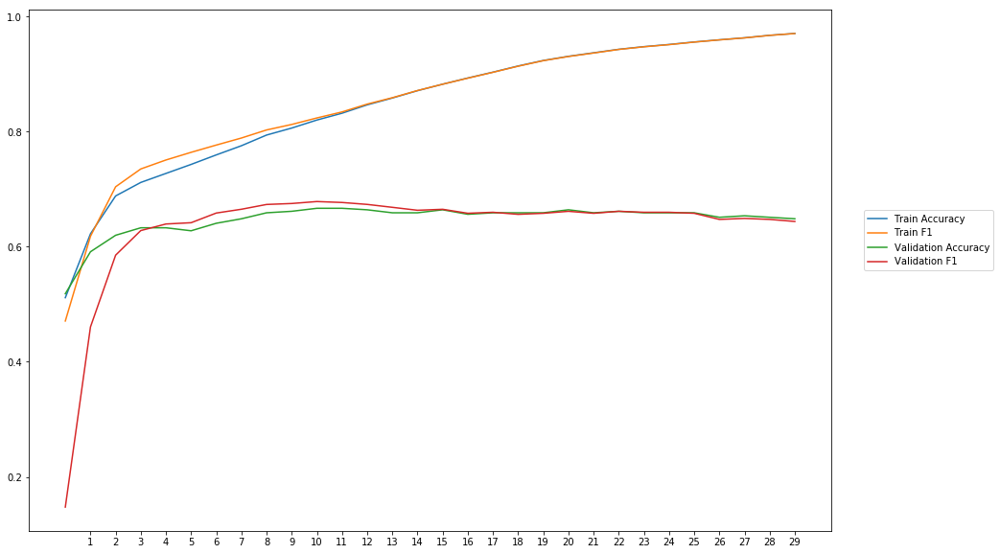

Average Accuracy: 64.70%
Average Precision: 64.76%
Average Recall: 63.54%
Average F1: 63.26%

-----Fold 4--------


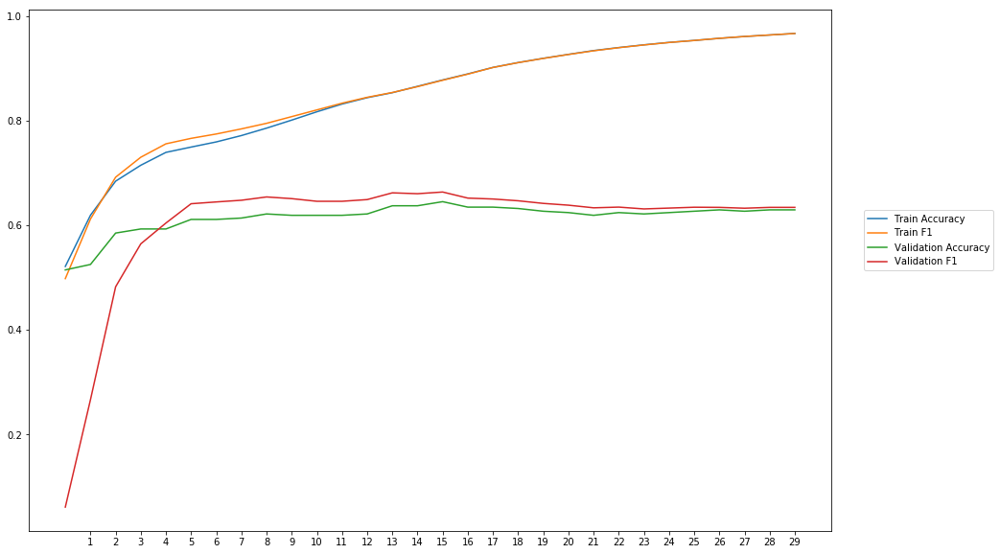

Average Accuracy: 61.48%
Average Precision: 61.93%
Average Recall: 62.39%
Average F1: 60.23%

-----Fold 5--------


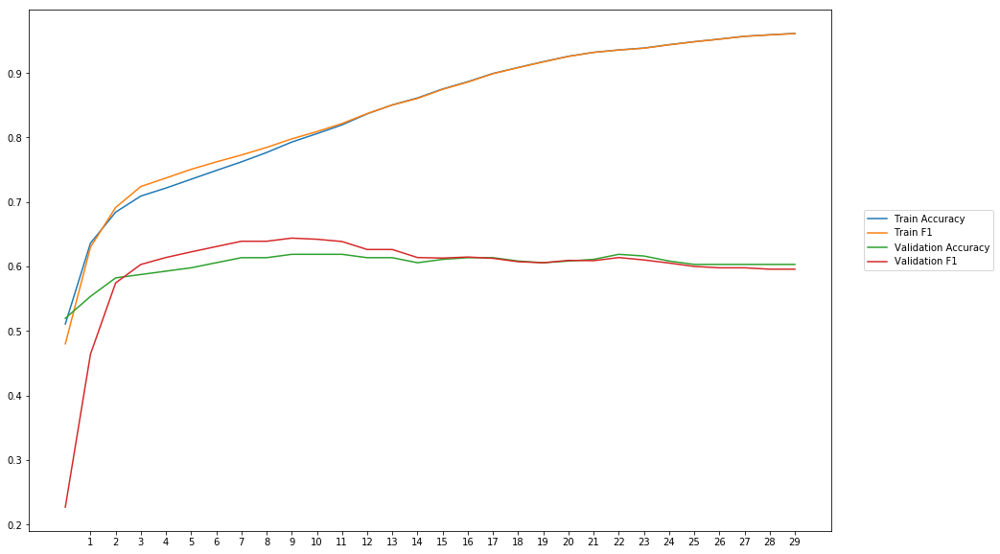

Average Accuracy: 60.29%
Average Precision: 60.08%
Average Recall: 60.37%
Average F1: 59.64%

-----Fold 6--------


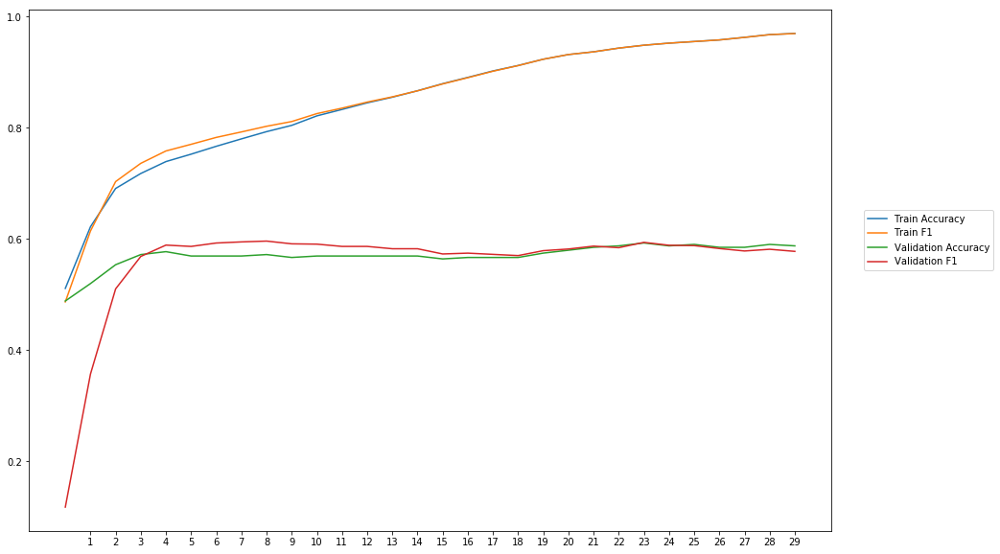

Average Accuracy: 57.03%
Average Precision: 56.56%
Average Recall: 56.34%
Average F1: 55.80%

-----Fold 7--------


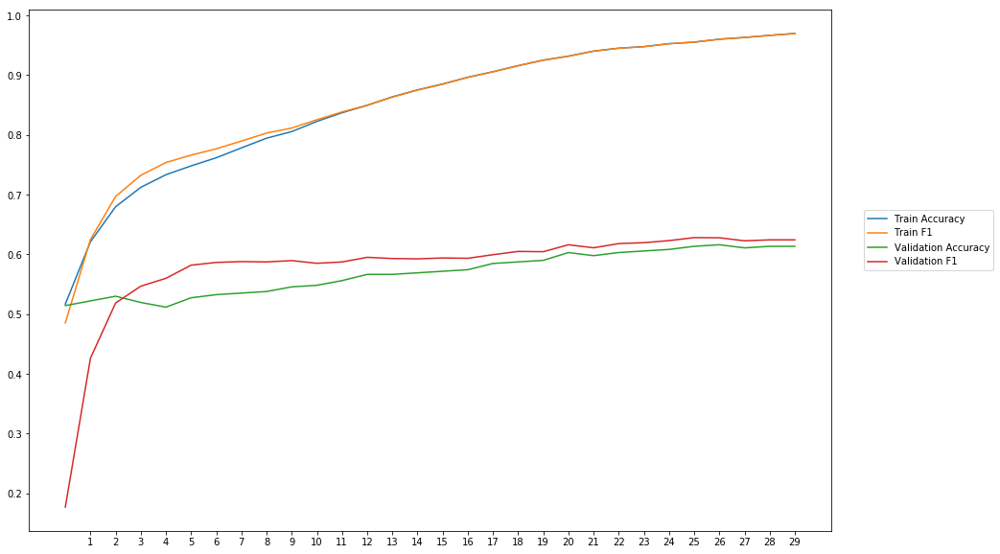

Average Accuracy: 56.93%
Average Precision: 56.43%
Average Recall: 60.77%
Average F1: 57.76%

-----Fold 8--------


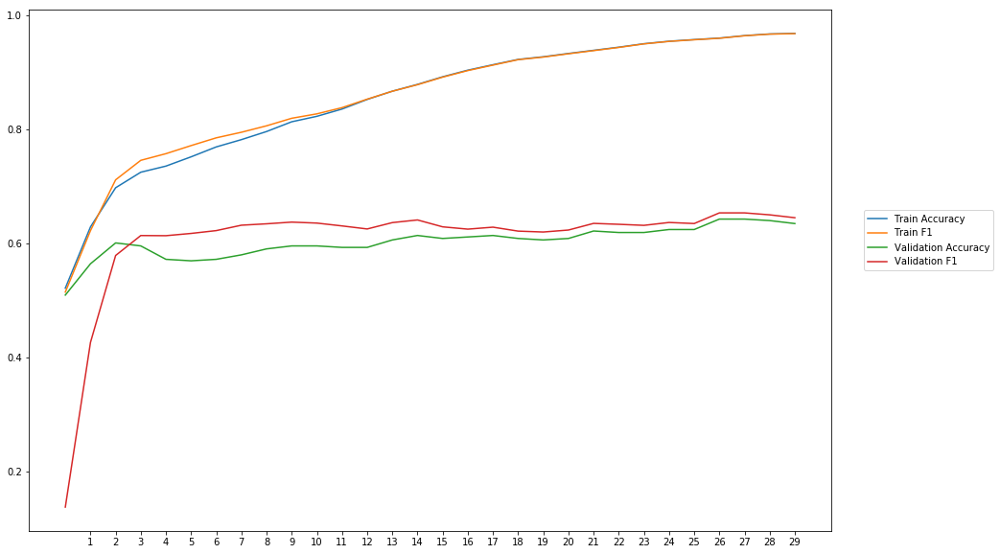

Average Accuracy: 60.23%
Average Precision: 59.48%
Average Recall: 63.91%
Average F1: 60.65%

-----Fold 9--------


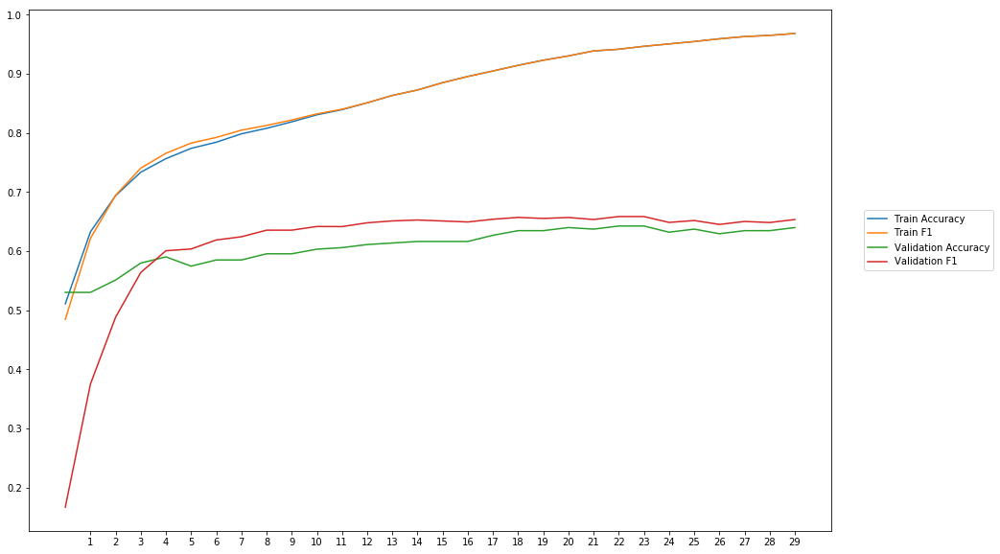

Average Accuracy: 60.87%
Average Precision: 60.31%
Average Recall: 64.49%
Average F1: 61.11%

-----Fold 10--------


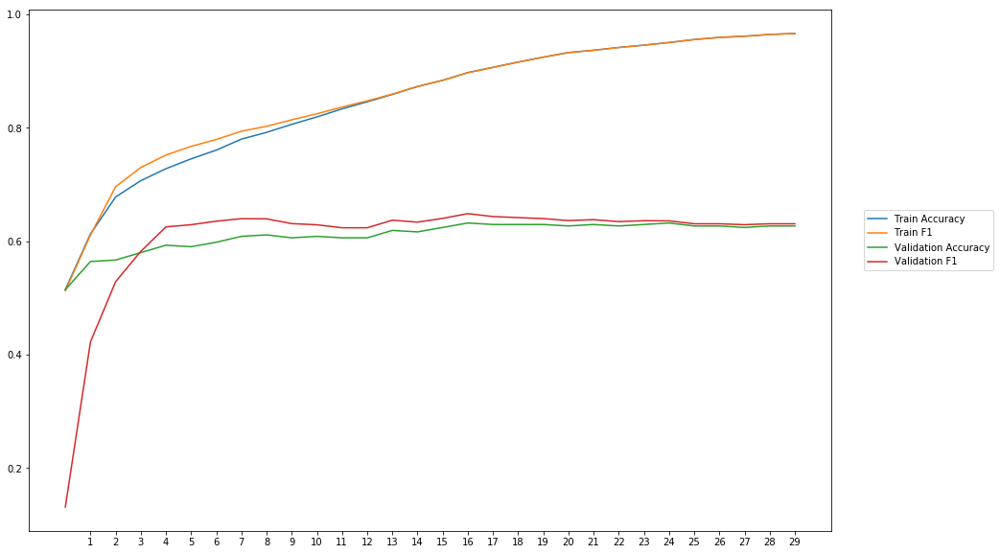

Average Accuracy: 61.01%
Average Precision: 60.68%
Average Recall: 62.36%
Average F1: 60.50%

-------Overallresults-------


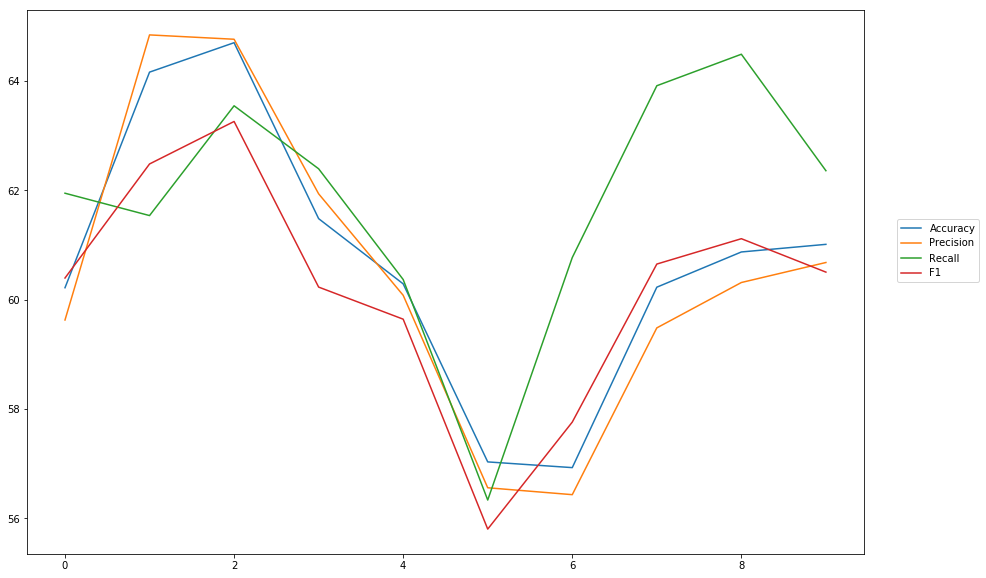

Accuracy: Mean = 60.69% (+/- 2.39%), Max = 64.70%, Min =  56.93%
Precision: Mean = 60.47% (+/- 2.70%), Max = 64.84%, Min =  56.43%
Recall: Mean = 61.76% (+/- 2.20%), Max = 64.49%, Min =  56.34%
F1: Mean = 60.18% (+/- 2.03%), Max = 63.26%, Min =  55.80%


In [9]:
cross_val(model, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'gloVe_6_50')

## GloVe 6B 100 Dim

In [14]:
#Load pretrained 6B 100 Dim GloVe-Embeddings
word_vectors_glove_6_100 = txt_embeddings(path+'glove.6B.100d.txt')
EMBEDDING_DIM = 100
embedding_matrix_glove_6_100 = create_eb_matrix(word_vectors_glove_6_100,EMBEDDING_DIM)

In [15]:
wv_layer_2 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_glove_6_100],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_2 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_2 = wv_layer_2(comment_input_2)

#First Dense Layer
x_2 = Dense(600, activation='relu')(embedded_sequences_2)

x_2 = Flatten()(x_2)

#Output (Dense) Layer
preds_2 = Dense(2, activation='softmax')(x_2)

# build the model
model_2 = Model(inputs=[comment_input_2], outputs=preds_2)


-----Fold 1--------


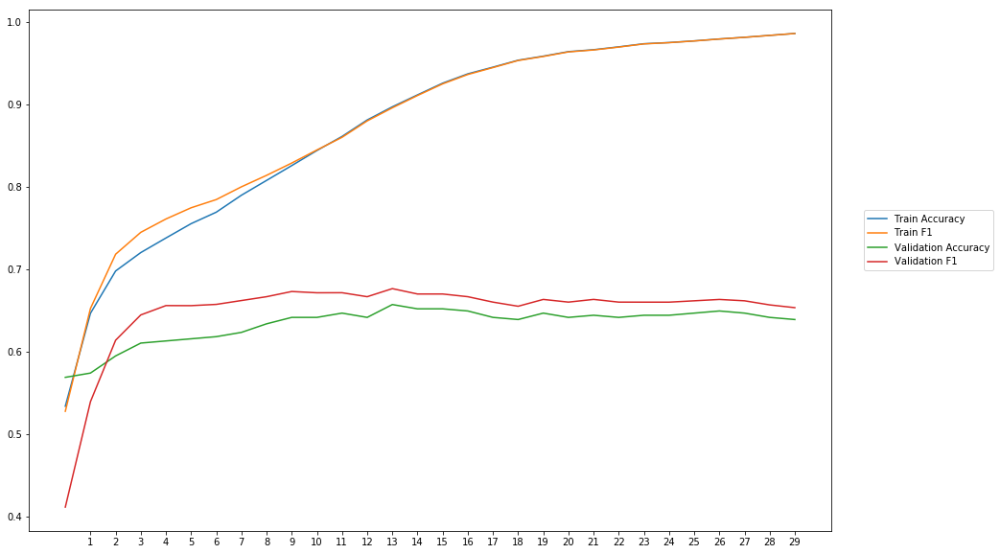

Average Accuracy: 63.33%
Average Precision: 62.01%
Average Recall: 68.70%
Average F1: 64.84%

-----Fold 2--------


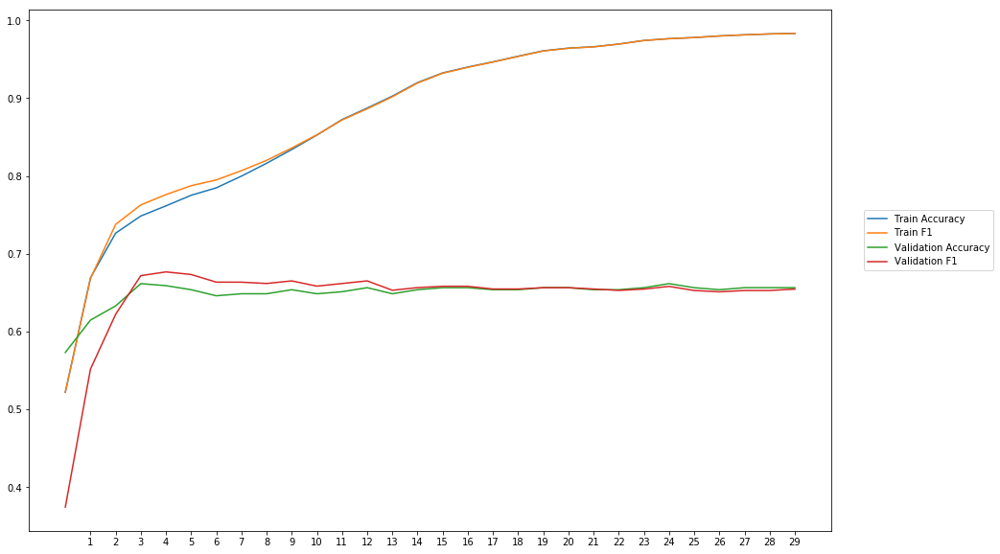

Average Accuracy: 64.95%
Average Precision: 64.84%
Average Recall: 64.92%
Average F1: 64.46%

-----Fold 3--------


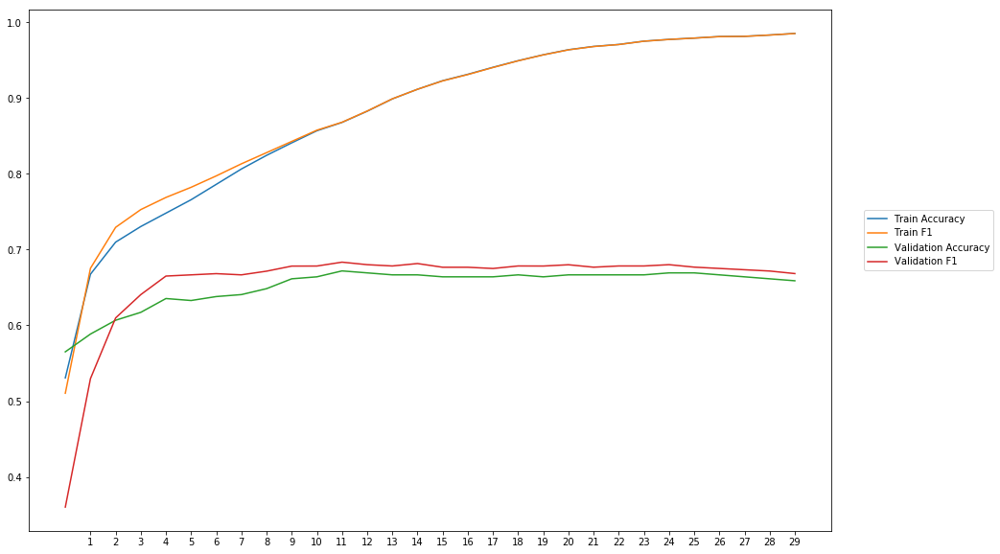

Average Accuracy: 65.17%
Average Precision: 64.16%
Average Recall: 68.25%
Average F1: 65.68%

-----Fold 4--------


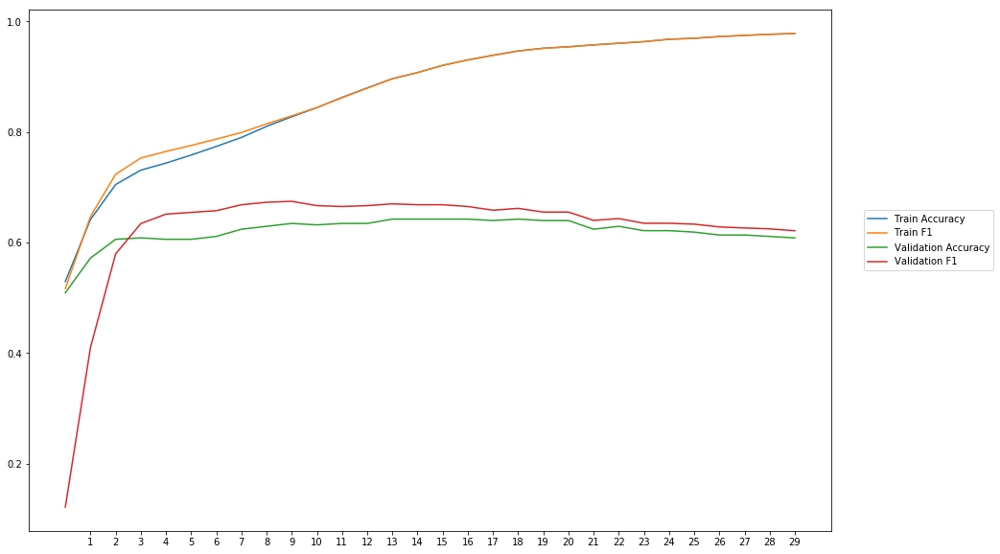

Average Accuracy: 61.99%
Average Precision: 60.95%
Average Recall: 66.27%
Average F1: 62.37%

-----Fold 5--------


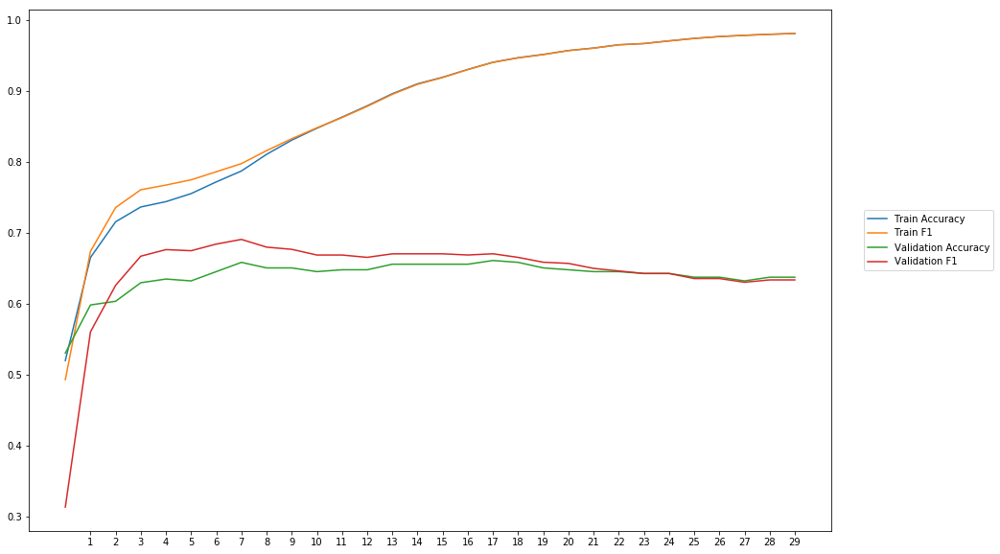

Average Accuracy: 63.87%
Average Precision: 62.92%
Average Recall: 66.93%
Average F1: 64.41%

-----Fold 6--------


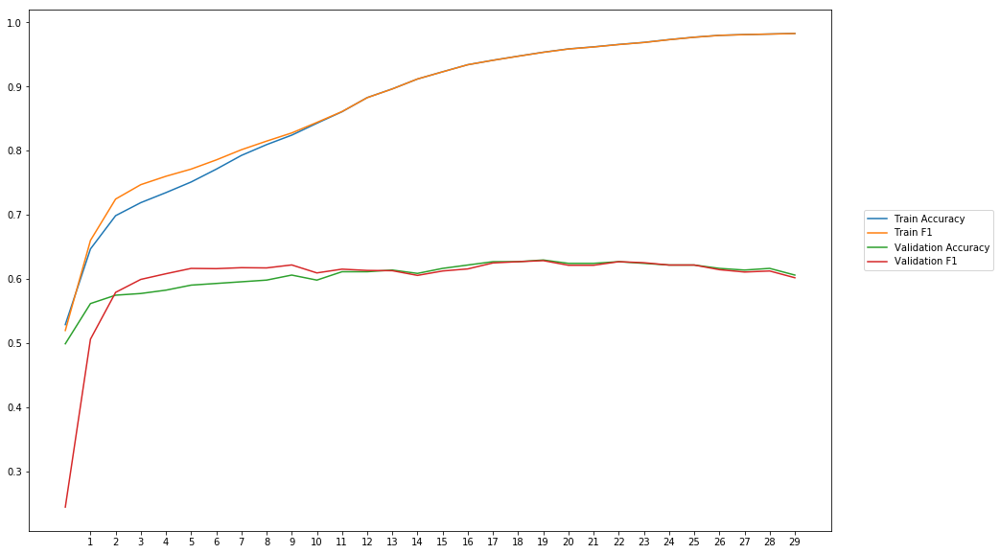

Average Accuracy: 60.44%
Average Precision: 60.14%
Average Recall: 60.30%
Average F1: 59.87%

-----Fold 7--------


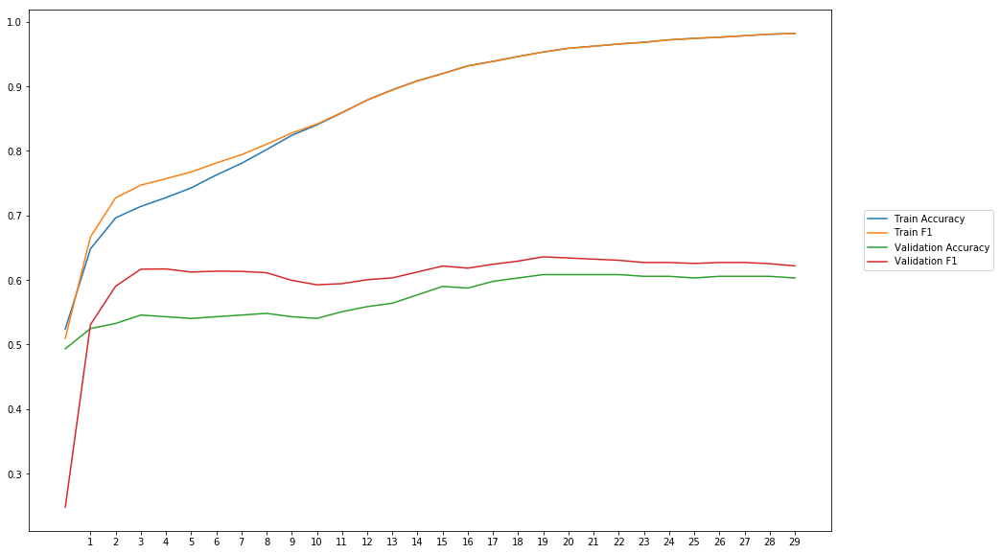

Average Accuracy: 57.33%
Average Precision: 56.11%
Average Recall: 66.00%
Average F1: 60.22%

-----Fold 8--------


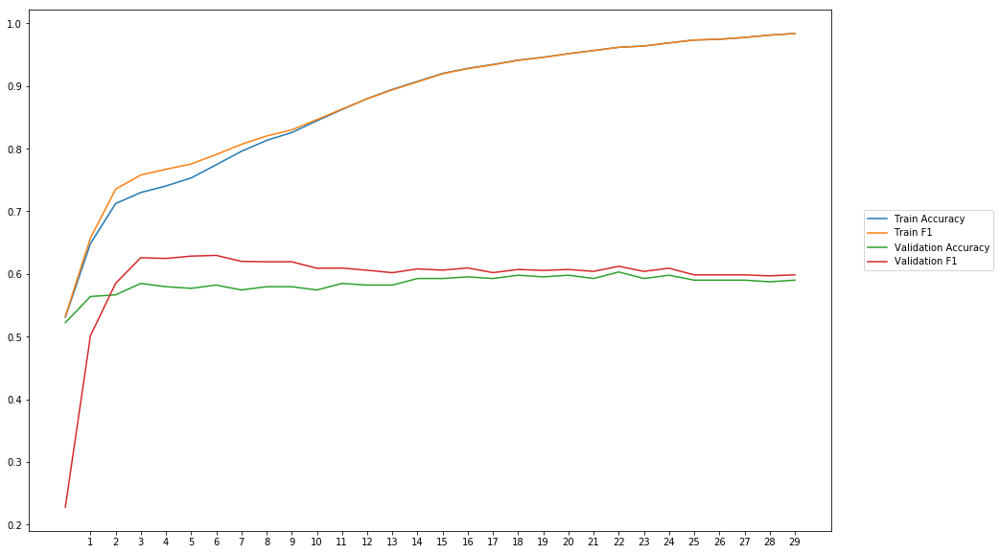

Average Accuracy: 58.44%
Average Precision: 57.85%
Average Recall: 62.09%
Average F1: 59.25%

-----Fold 9--------


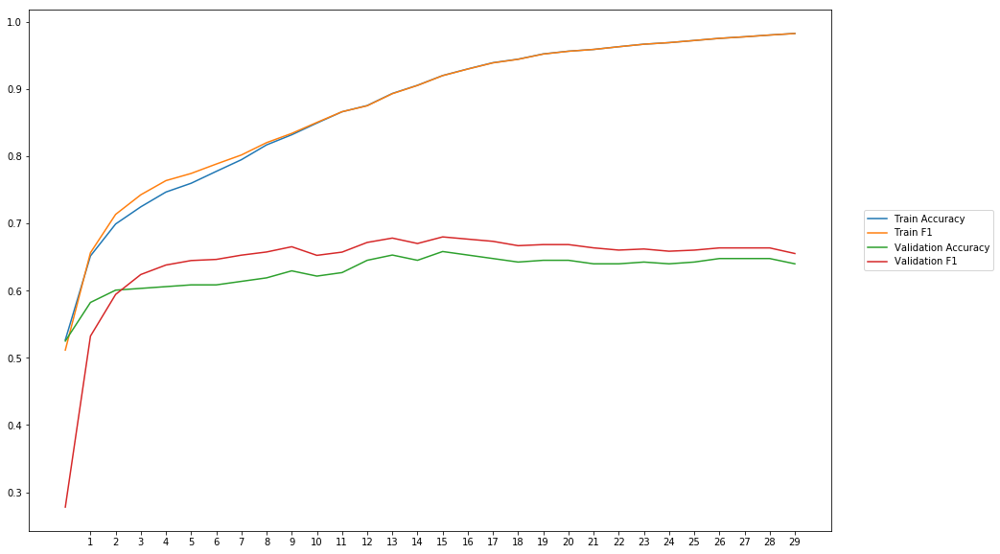

Average Accuracy: 62.87%
Average Precision: 61.44%
Average Recall: 68.20%
Average F1: 64.14%

-----Fold 10--------


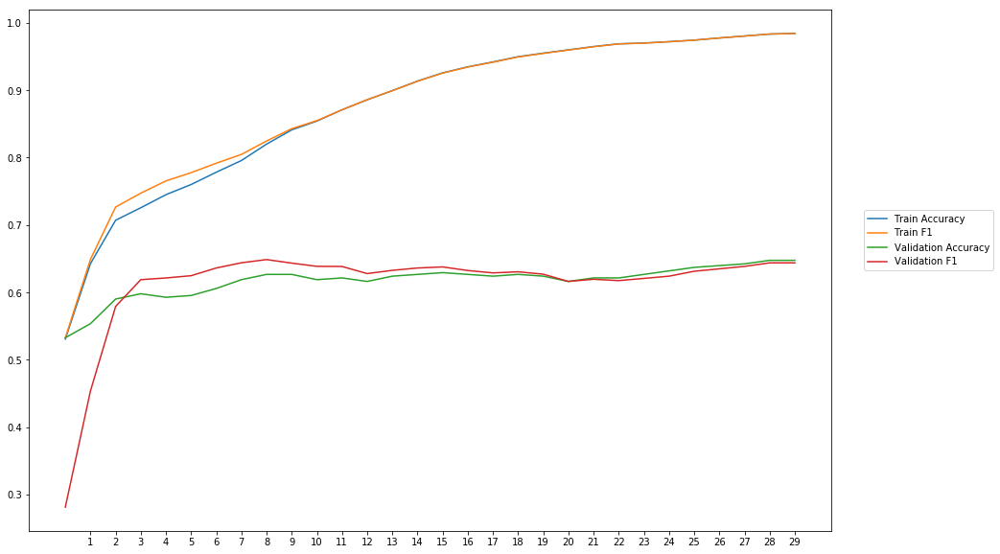

Average Accuracy: 61.70%
Average Precision: 61.51%
Average Recall: 62.04%
Average F1: 61.24%

-------Overallresults-------


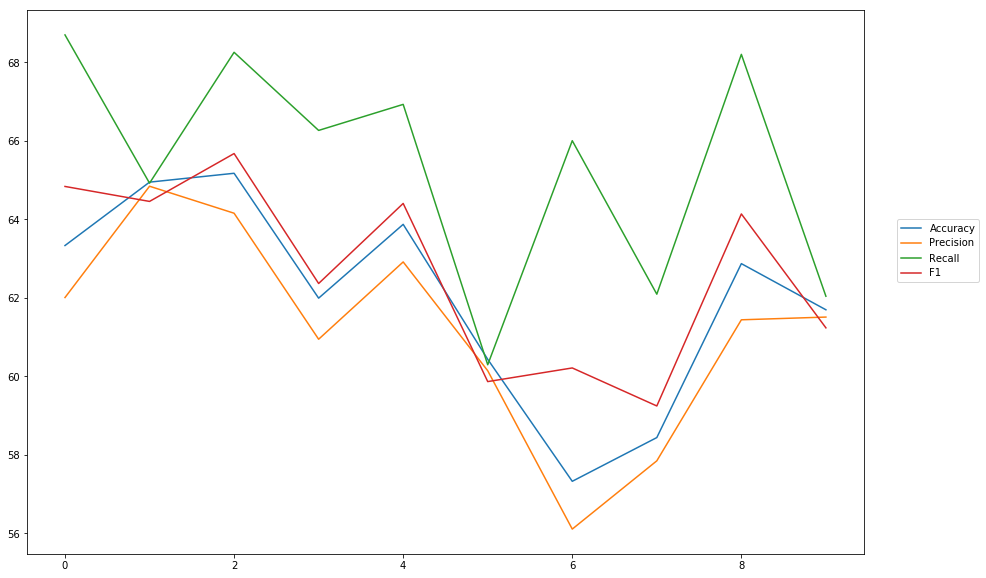

Accuracy: Mean = 62.01% (+/- 2.49%), Max = 65.17%, Min =  57.33%
Precision: Mean = 61.19% (+/- 2.53%), Max = 64.84%, Min =  56.11%
Recall: Mean = 65.37% (+/- 2.81%), Max = 68.70%, Min =  60.30%
F1: Mean = 62.64% (+/- 2.23%), Max = 65.68%, Min =  59.25%


In [13]:
cross_val(model_2, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'gloVe_6_100')

## GloVe 6B 200 Dim

In [61]:
word_vectors_glovee_6_200 = txt_embeddings(path+'glove.6B.200d.txt')
EMBEDDING_DIM = 200
embedding_matrix_glove_6_200 = create_eb_matrix(word_vectors_glovee_6_200,EMBEDDING_DIM)

In [62]:
wv_layer_11 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_glove_6_200],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_11 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_11 = wv_layer_11(comment_input_11)

#First Dense Layer
x_11 = Dense(600, activation='relu')(embedded_sequences_11)

x_11 = Flatten()(x_11)

#Output (Dense) Layer
preds_11 = Dense(2, activation='softmax')(x_11)

# build the model
model_11 = Model(inputs=[comment_input_11], outputs=preds_11)


-----Fold 1--------


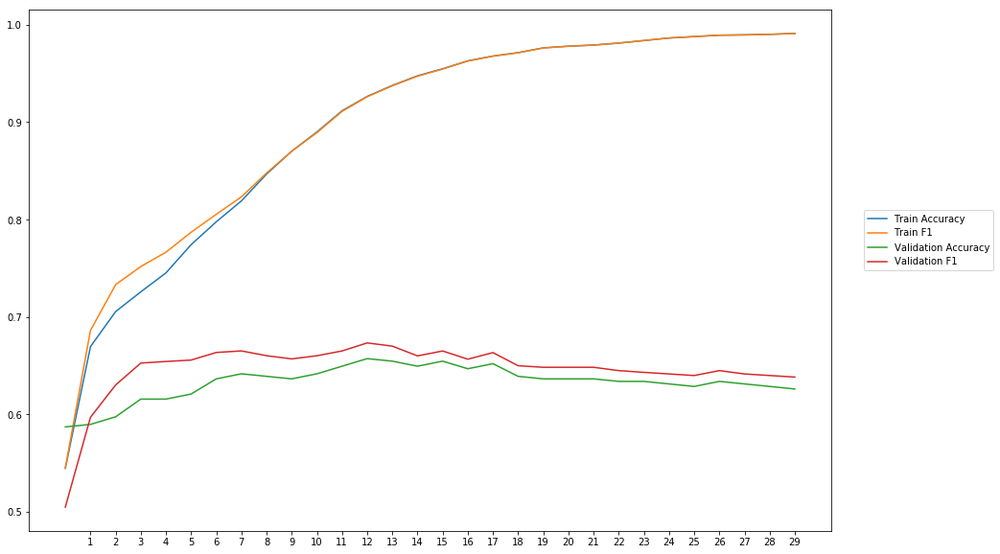

Average Accuracy: 63.26%
Average Precision: 62.16%
Average Recall: 67.53%
Average F1: 64.60%

-----Fold 2--------


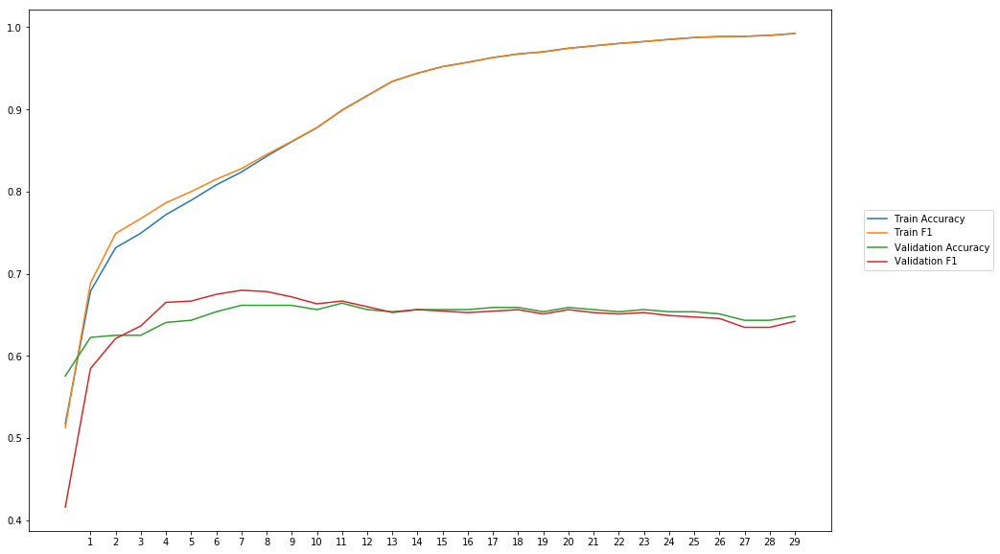

Average Accuracy: 64.86%
Average Precision: 64.74%
Average Recall: 64.69%
Average F1: 64.42%

-----Fold 3--------


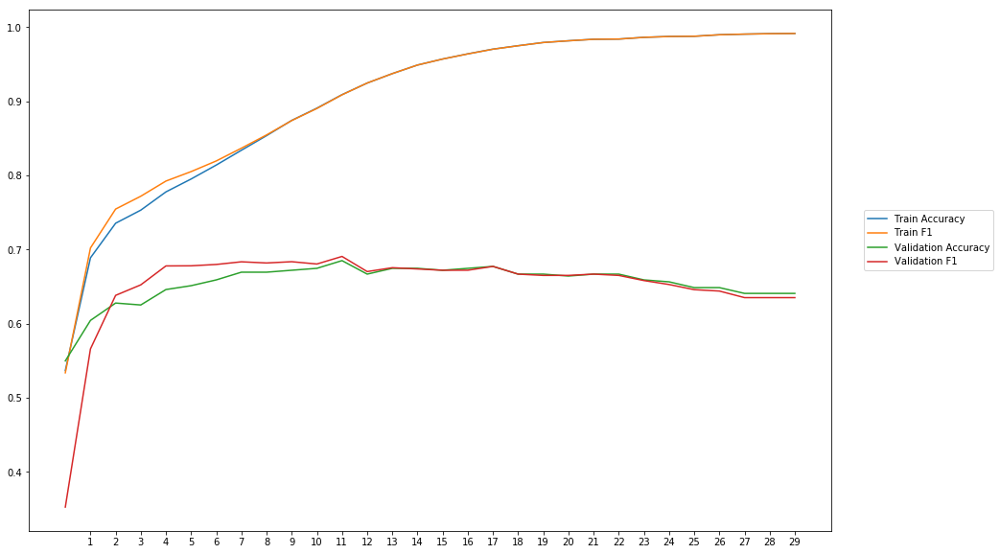

Average Accuracy: 65.45%
Average Precision: 65.06%
Average Recall: 65.90%
Average F1: 65.12%

-----Fold 4--------


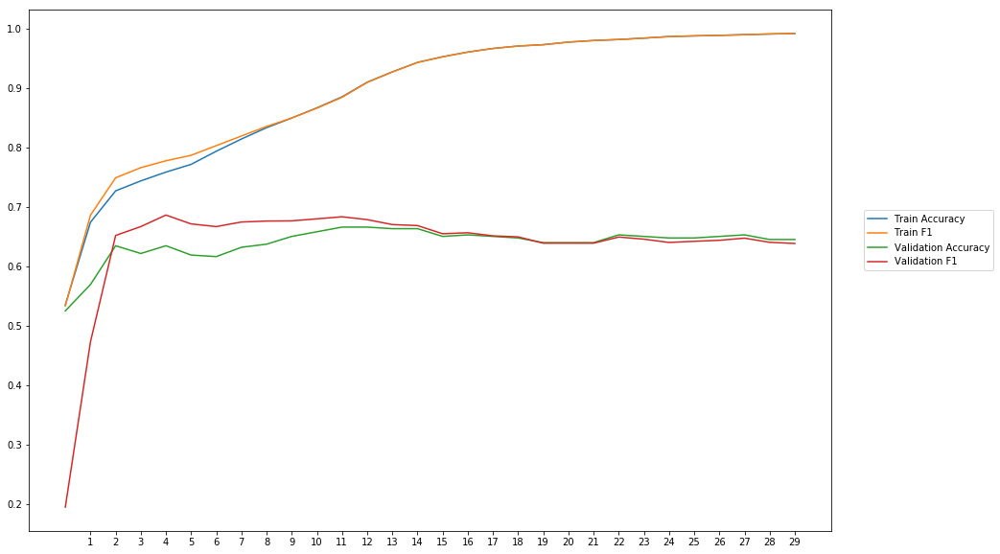

Average Accuracy: 63.88%
Average Precision: 63.44%
Average Recall: 65.71%
Average F1: 63.63%

-----Fold 5--------


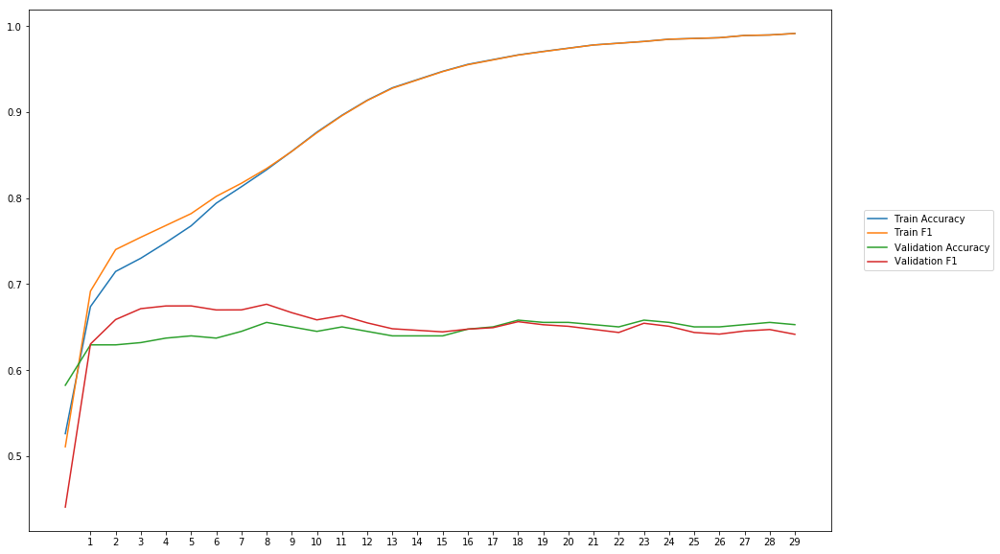

Average Accuracy: 64.46%
Average Precision: 64.09%
Average Recall: 66.06%
Average F1: 64.73%

-----Fold 6--------


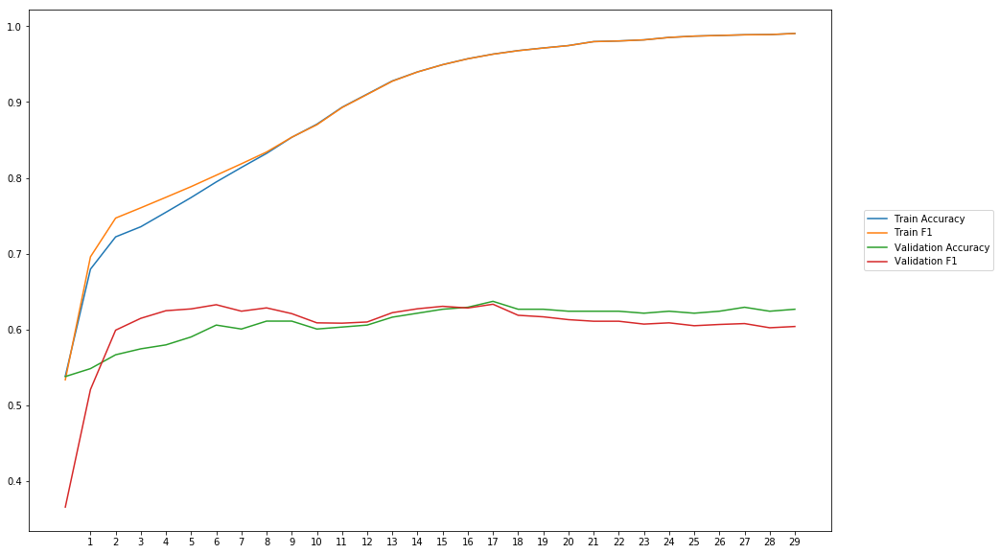

Average Accuracy: 60.87%
Average Precision: 60.95%
Average Recall: 60.65%
Average F1: 60.46%

-----Fold 7--------


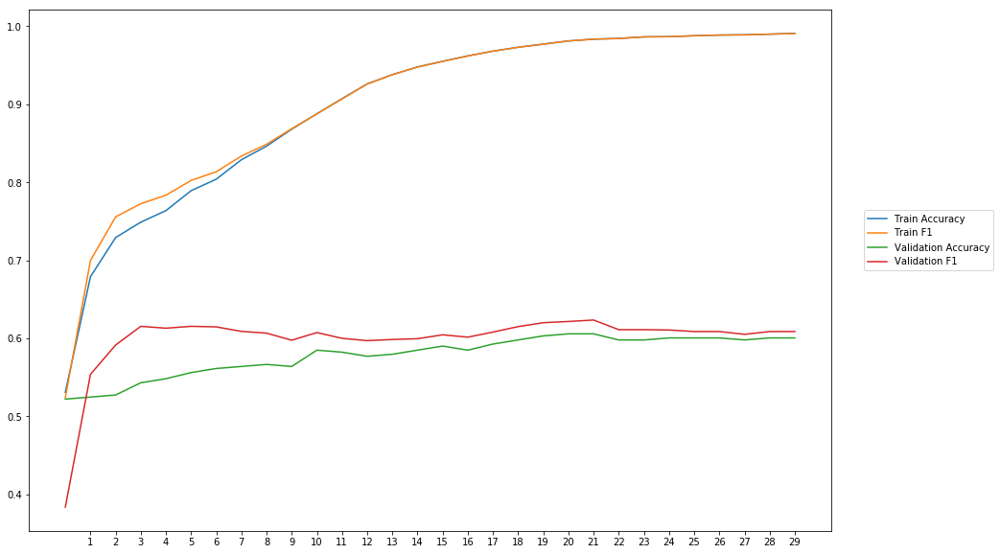

Average Accuracy: 57.88%
Average Precision: 57.08%
Average Recall: 63.61%
Average F1: 59.90%

-----Fold 8--------


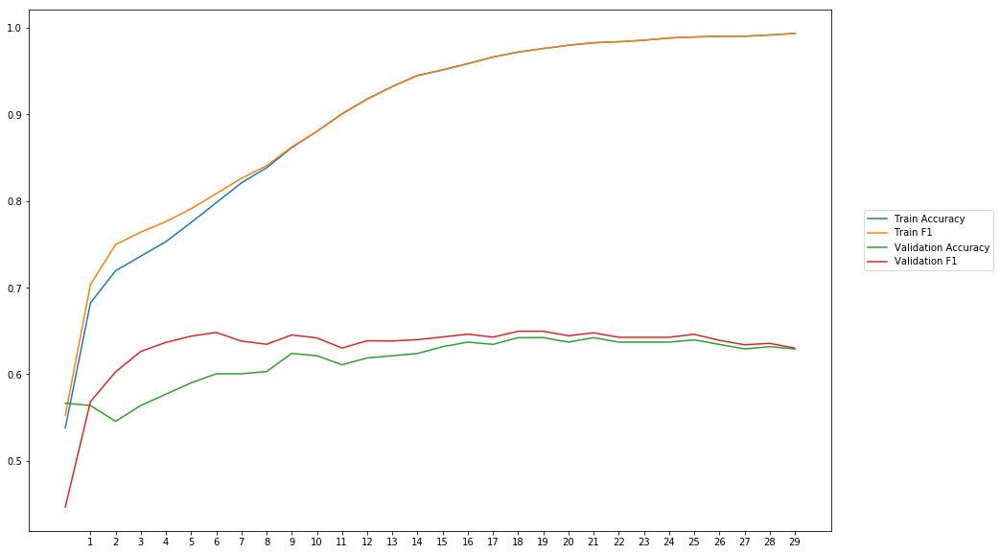

Average Accuracy: 61.58%
Average Precision: 60.74%
Average Recall: 66.18%
Average F1: 63.06%

-----Fold 9--------


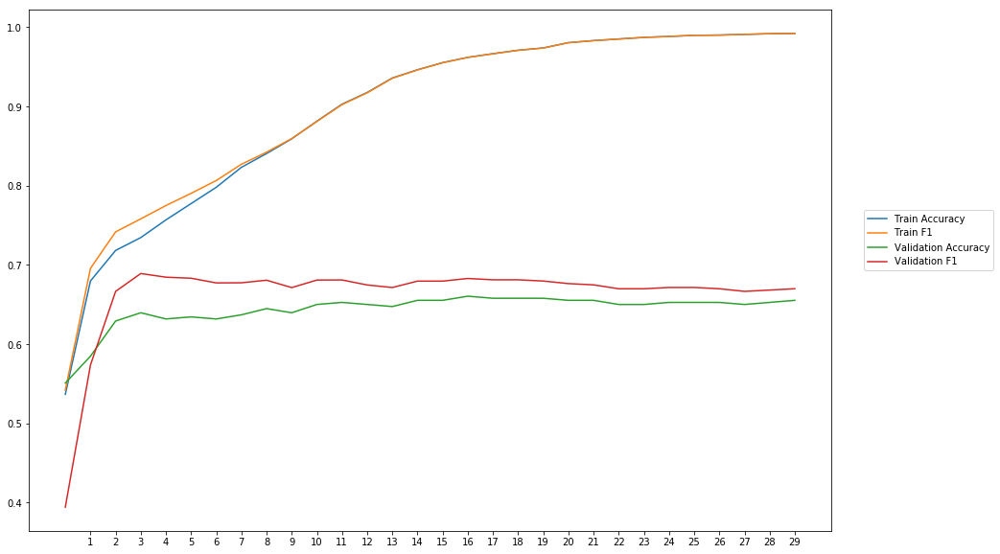

Average Accuracy: 64.33%
Average Precision: 62.42%
Average Recall: 71.54%
Average F1: 66.34%

-----Fold 10--------


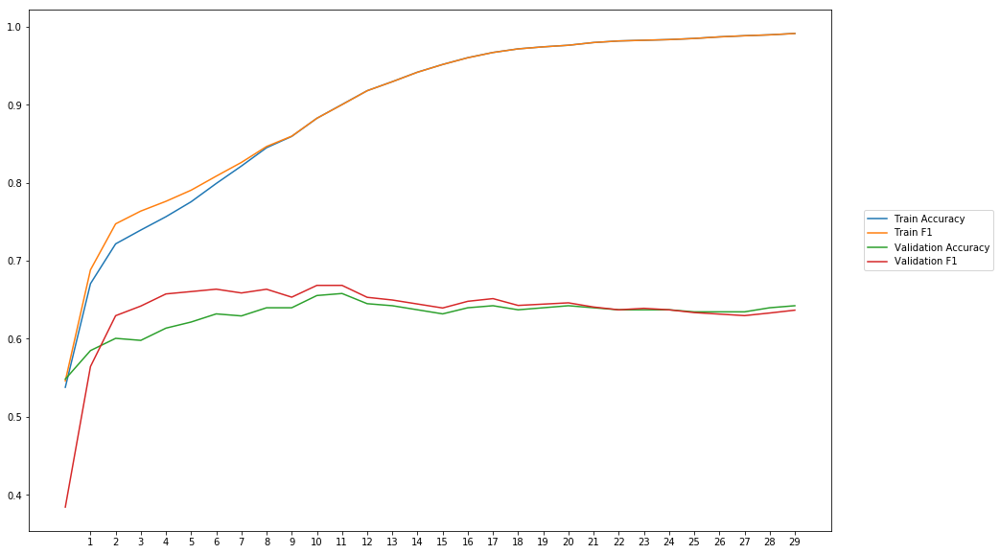

Average Accuracy: 63.05%
Average Precision: 62.43%
Average Recall: 65.27%
Average F1: 63.50%

-------Overallresults-------


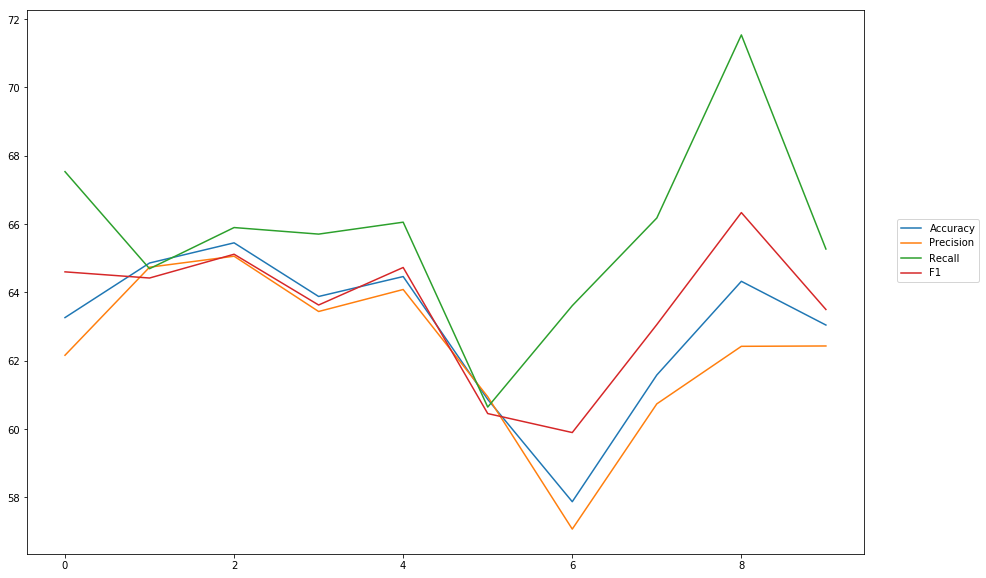

Accuracy: Mean = 62.96% (+/- 2.17%), Max = 65.45%, Min =  57.88%
Precision: Mean = 62.31% (+/- 2.23%), Max = 65.06%, Min =  57.08%
Recall: Mean = 65.71% (+/- 2.63%), Max = 71.54%, Min =  60.65%
F1: Mean = 63.58% (+/- 1.91%), Max = 66.34%, Min =  59.90%


In [63]:
cross_val(model_11, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'gloVe_6_200')

## GloVe 6B 300 Dim

In [7]:
#Load pretrained 6B 300 Dim GloVe-Embeddings
word_vectors_glove_6_300 = txt_embeddings(path+'glove.6B.300d.txt')
EMBEDDING_DIM = 300
embedding_matrix_glove_6_300 = create_eb_matrix(word_vectors_glove_6_300,EMBEDDING_DIM)

In [8]:
wv_layer_3 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_glove_6_300],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_3 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_3 = wv_layer_3(comment_input_3)

#First Dense Layer
x_3 = Dense(600, activation='relu')(embedded_sequences_3)

x_3 = Flatten()(x_3)

#Output (Dense) Layer
preds_3 = Dense(2, activation='softmax')(x_3)

# build the model
model_3 = Model(inputs=[comment_input_3], outputs=preds_3)


-----Fold 1--------


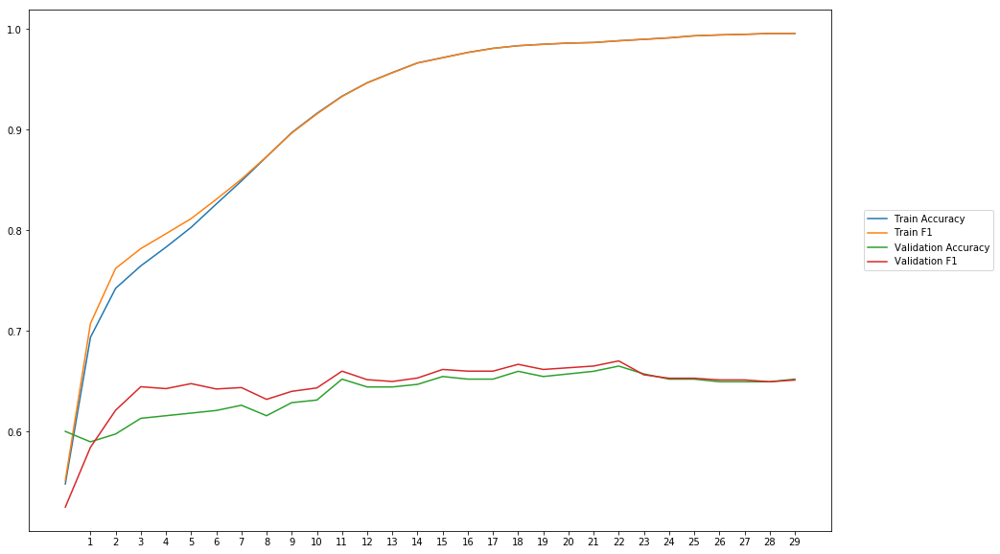

Average Accuracy: 63.86%
Average Precision: 63.26%
Average Recall: 66.04%
Average F1: 64.50%

-----Fold 2--------


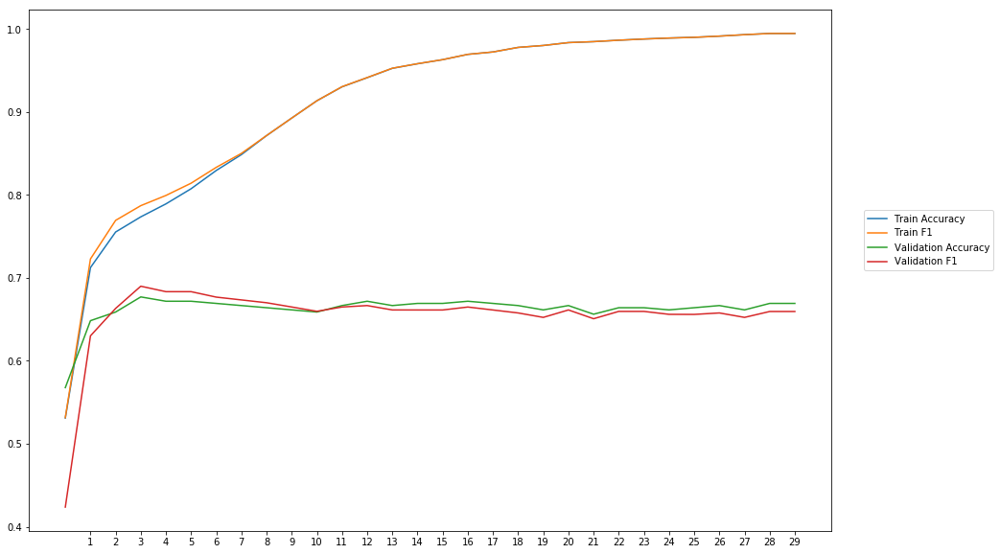

Average Accuracy: 66.24%
Average Precision: 66.39%
Average Recall: 64.97%
Average F1: 65.48%

-----Fold 3--------


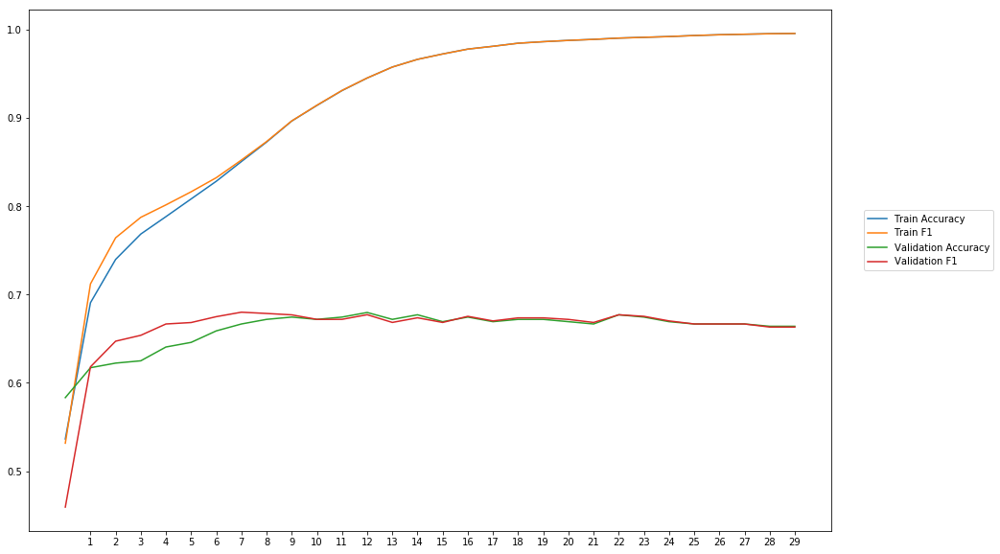

Average Accuracy: 66.08%
Average Precision: 65.63%
Average Recall: 67.03%
Average F1: 66.12%

-----Fold 4--------


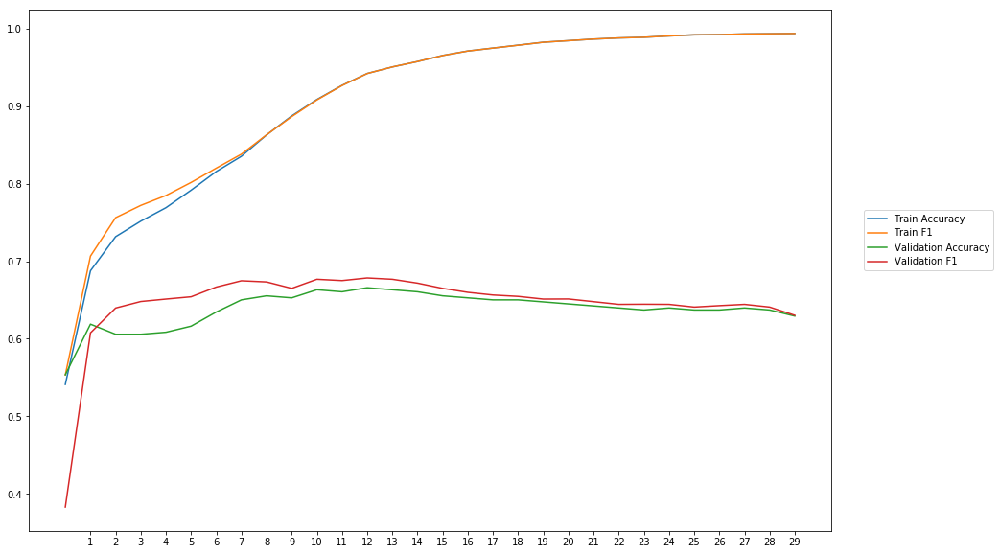

Average Accuracy: 63.85%
Average Precision: 63.03%
Average Recall: 66.79%
Average F1: 64.53%

-----Fold 5--------


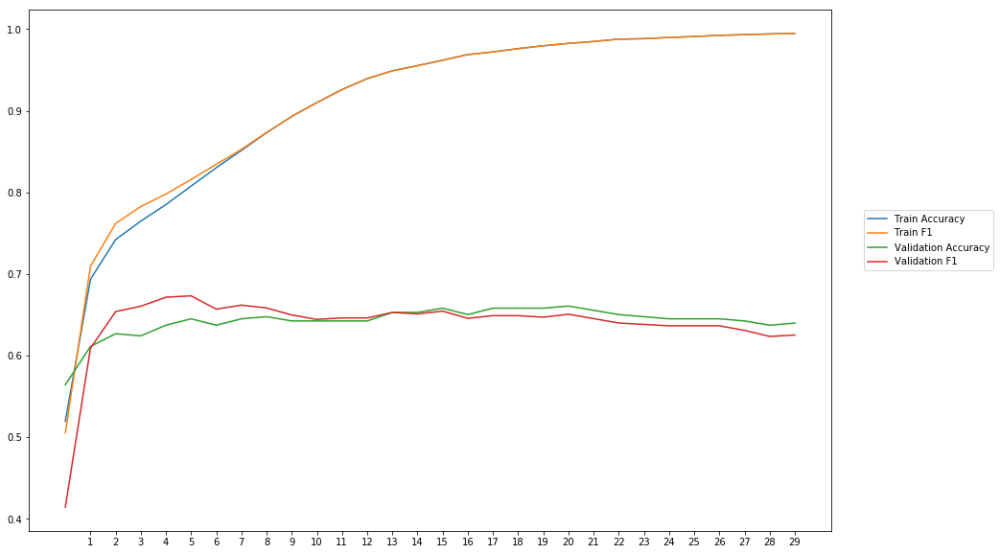

Average Accuracy: 64.20%
Average Precision: 64.24%
Average Recall: 64.03%
Average F1: 63.85%

-----Fold 6--------


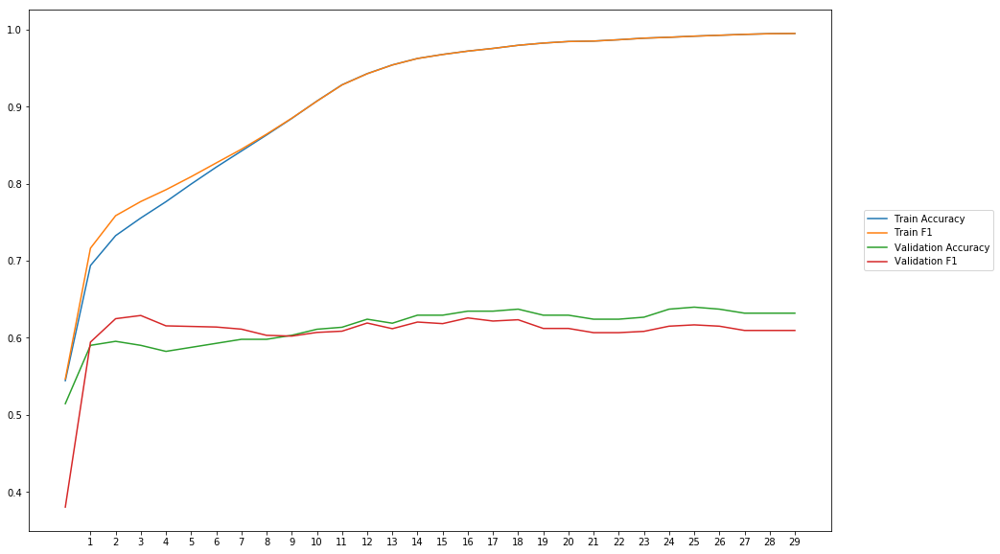

Average Accuracy: 61.42%
Average Precision: 61.79%
Average Recall: 59.77%
Average F1: 60.55%

-----Fold 7--------


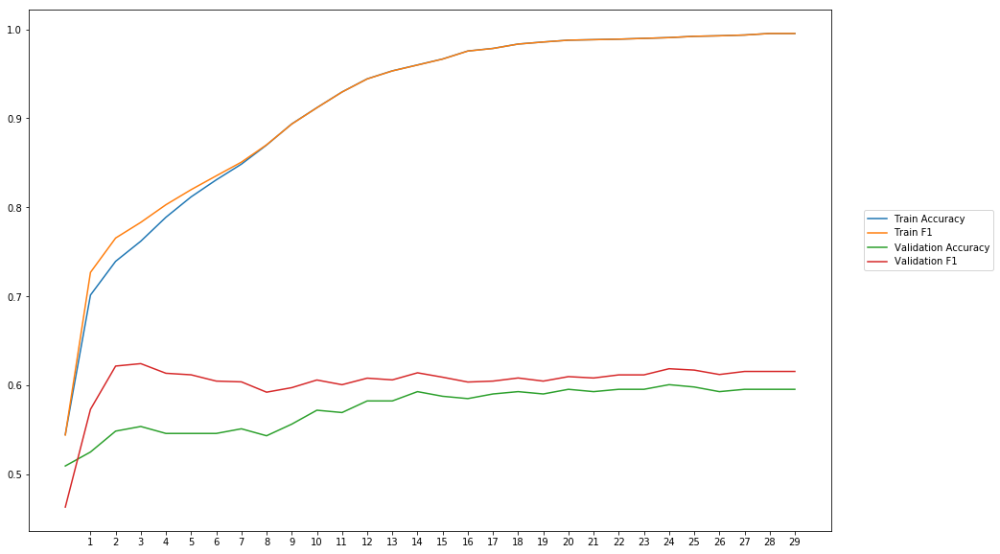

Average Accuracy: 57.41%
Average Precision: 56.42%
Average Recall: 65.17%
Average F1: 60.34%

-----Fold 8--------


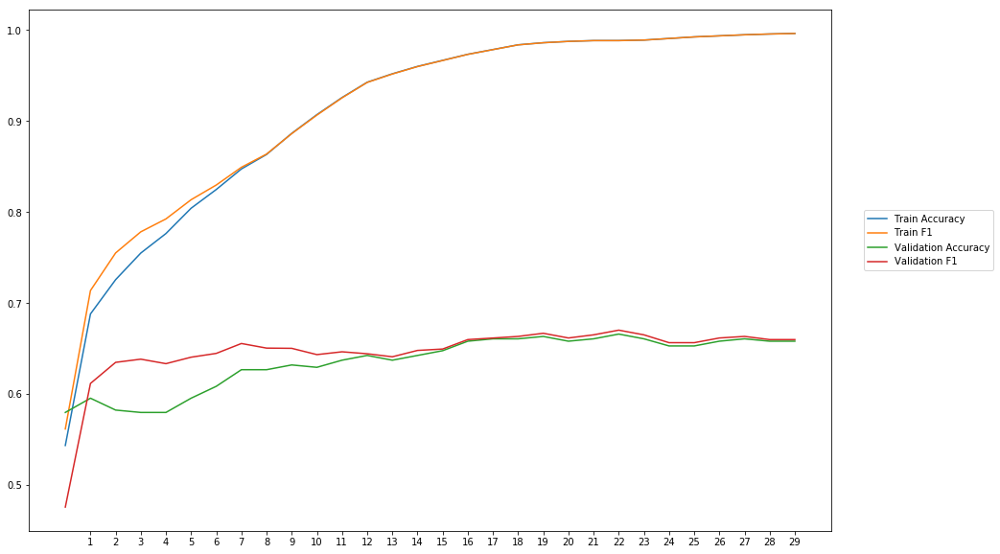

Average Accuracy: 63.56%
Average Precision: 62.87%
Average Recall: 66.91%
Average F1: 64.58%

-----Fold 9--------


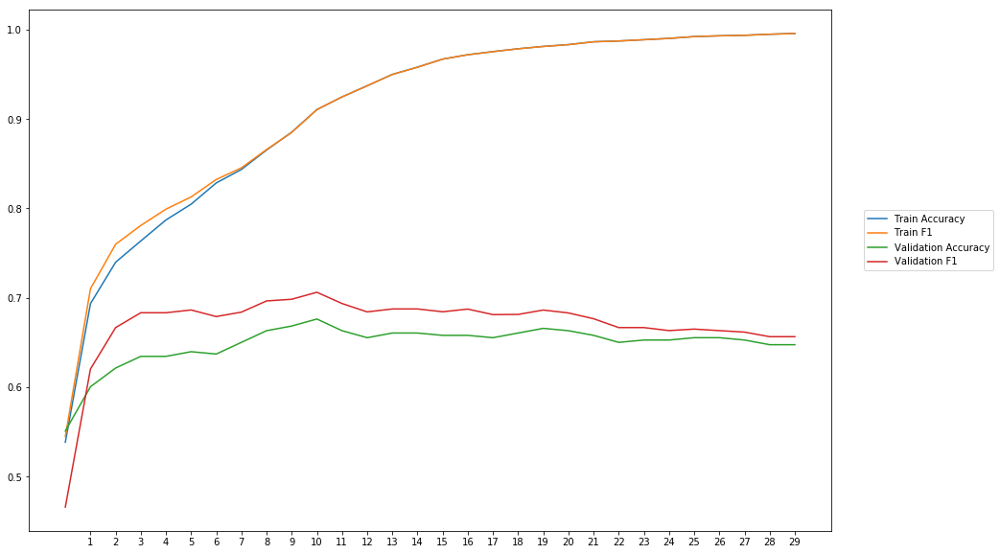

Average Accuracy: 64.83%
Average Precision: 62.82%
Average Recall: 72.22%
Average F1: 67.01%

-----Fold 10--------


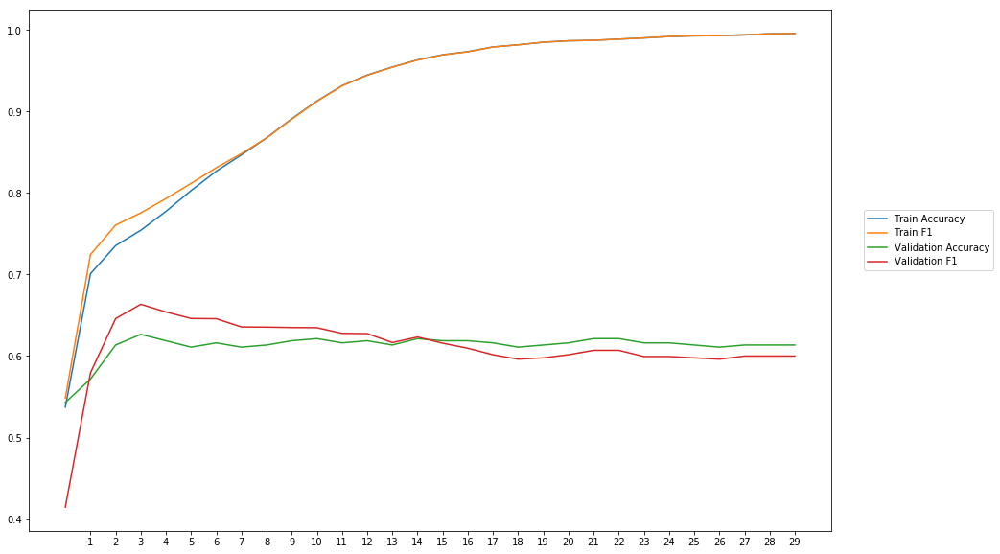

Average Accuracy: 61.24%
Average Precision: 61.09%
Average Recall: 61.55%
Average F1: 61.05%

-------Overallresults-------


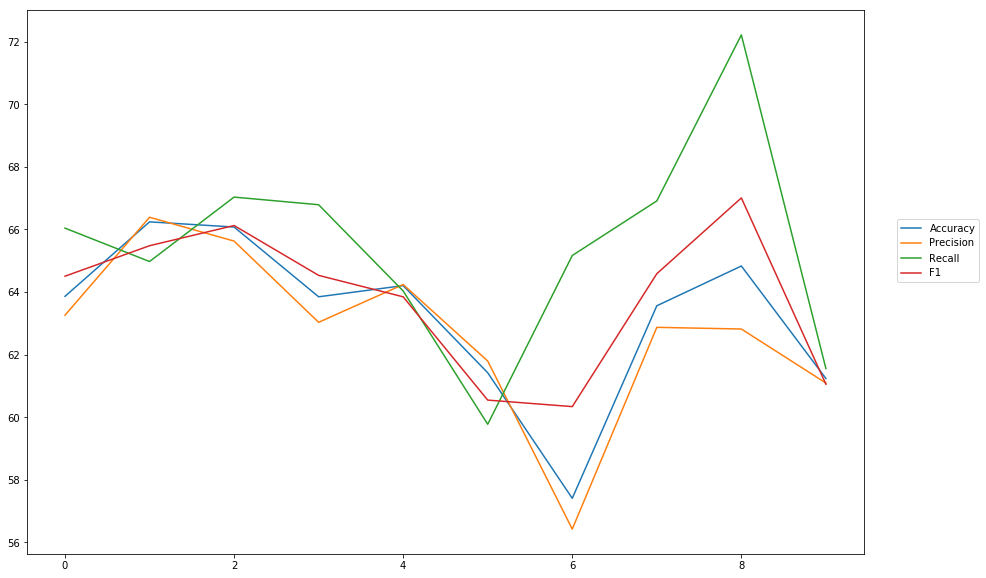

Accuracy: Mean = 63.27% (+/- 2.50%), Max = 66.24%, Min =  57.41%
Precision: Mean = 62.75% (+/- 2.60%), Max = 66.39%, Min =  56.42%
Recall: Mean = 65.45% (+/- 3.20%), Max = 72.22%, Min =  59.77%
F1: Mean = 63.80% (+/- 2.24%), Max = 67.01%, Min =  60.34%


In [17]:
cross_val(model_3, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'gloVe_6_300')

## GloVe 42B 300 Dim

In [9]:
#Load pretrained 42B 300 Dim GloVe-Embeddings
word_vectors_glove_42_300 = txt_embeddings(path+'glove.42B.300d.txt')
EMBEDDING_DIM = 300
embedding_matrix_glove_42_300 = create_eb_matrix(word_vectors_glove_42_300, EMBEDDING_DIM)

In [10]:
wv_layer_4 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_glove_42_300],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_4 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_4 = wv_layer_4(comment_input_4)

#First Dense Layer
x_4 = Dense(600, activation='relu')(embedded_sequences_4)

x_4 = Flatten()(x_4)

#Output (Dense) Layer
preds_4 = Dense(2, activation='softmax')(x_4)

# build the model
model_4 = Model(inputs=[comment_input_4], outputs=preds_4)


-----Fold 1--------


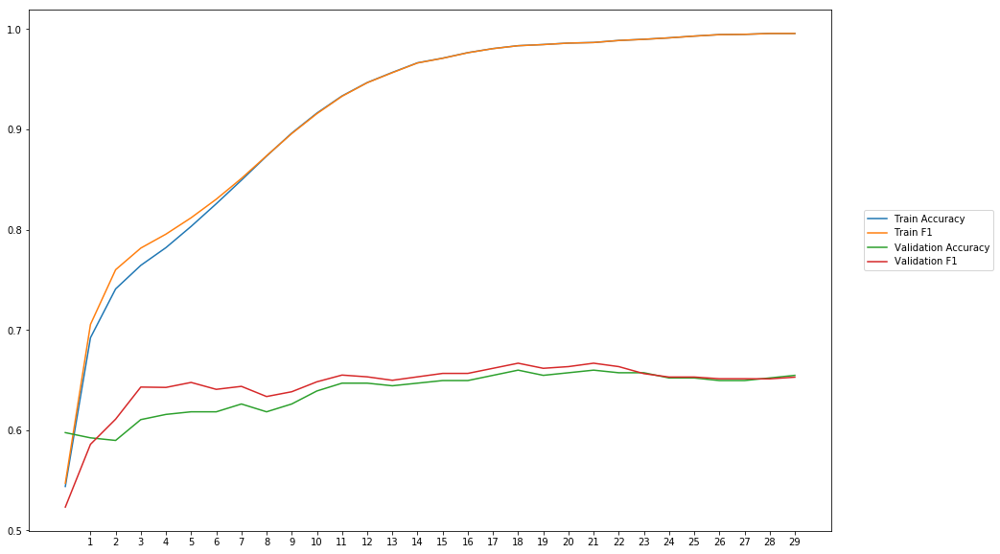

Average Accuracy: 63.81%
Average Precision: 63.22%
Average Recall: 65.94%
Average F1: 64.44%

-----Fold 2--------


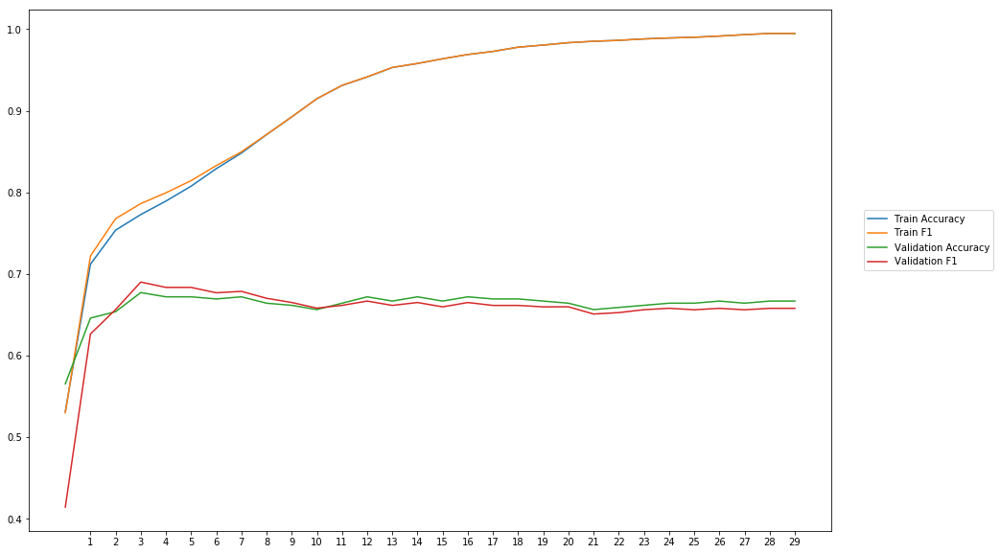

Average Accuracy: 66.20%
Average Precision: 66.34%
Average Recall: 64.92%
Average F1: 65.42%

-----Fold 3--------


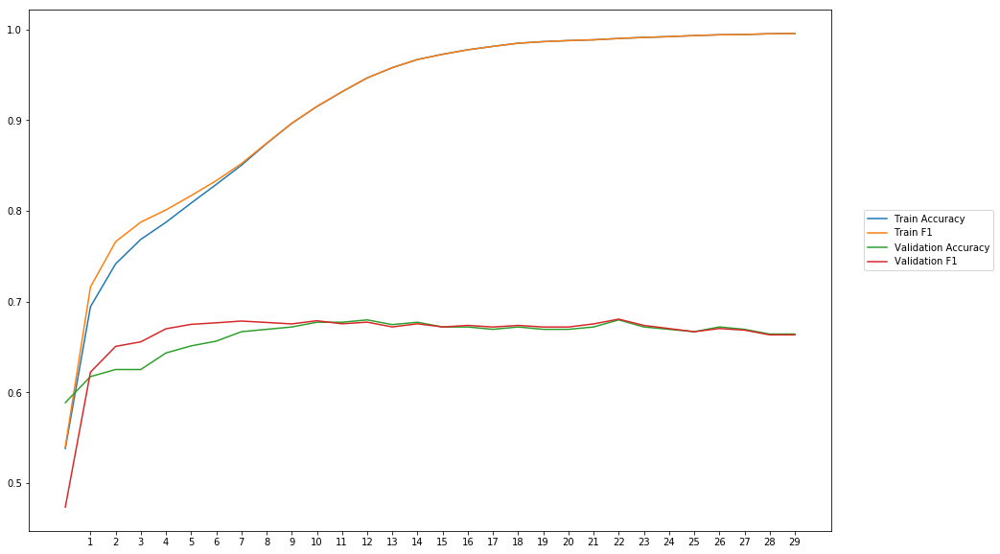

Average Accuracy: 66.17%
Average Precision: 65.65%
Average Recall: 67.40%
Average F1: 66.32%

-----Fold 4--------


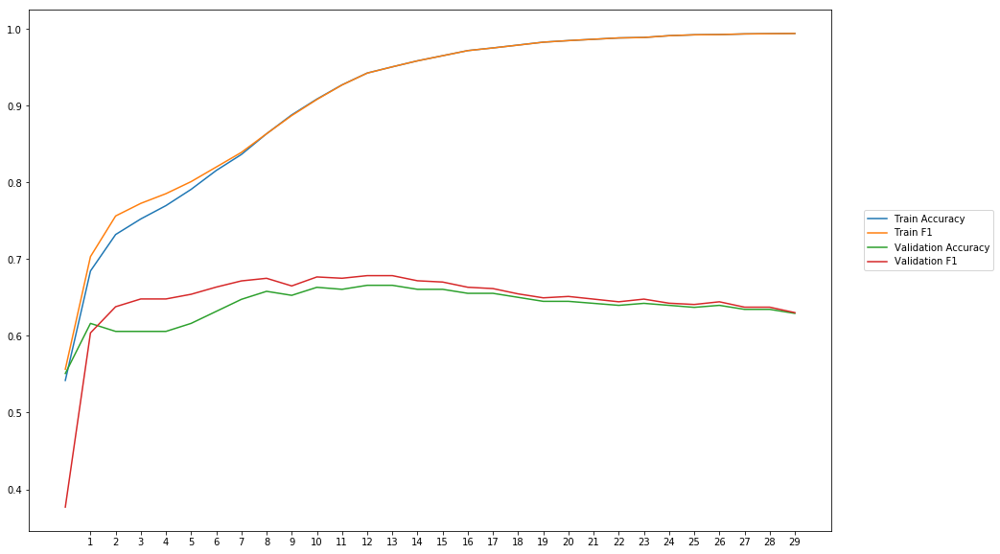

Average Accuracy: 63.86%
Average Precision: 63.06%
Average Recall: 66.67%
Average F1: 64.49%

-----Fold 5--------


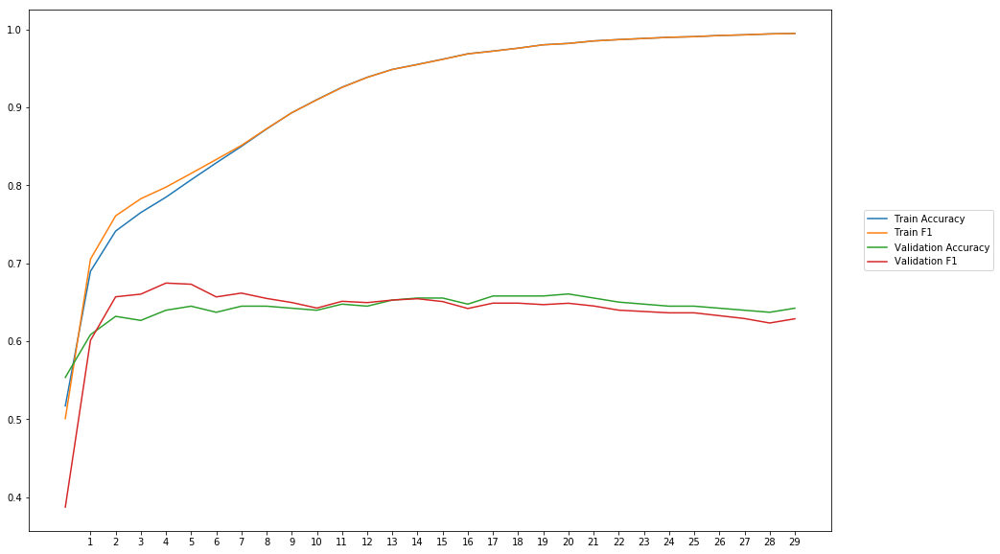

Average Accuracy: 64.19%
Average Precision: 64.22%
Average Recall: 63.87%
Average F1: 63.74%

-----Fold 6--------


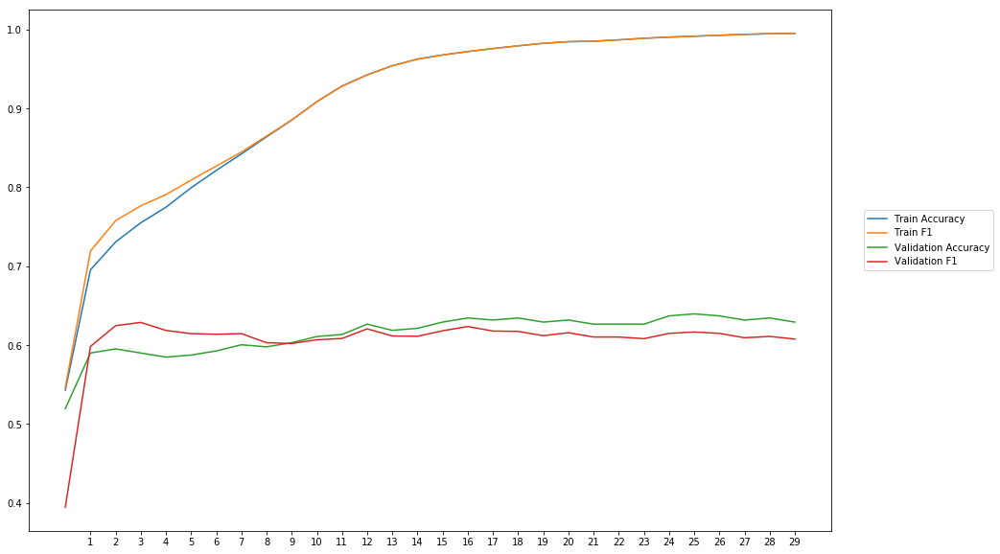

Average Accuracy: 61.44%
Average Precision: 61.83%
Average Recall: 59.84%
Average F1: 60.61%

-----Fold 7--------


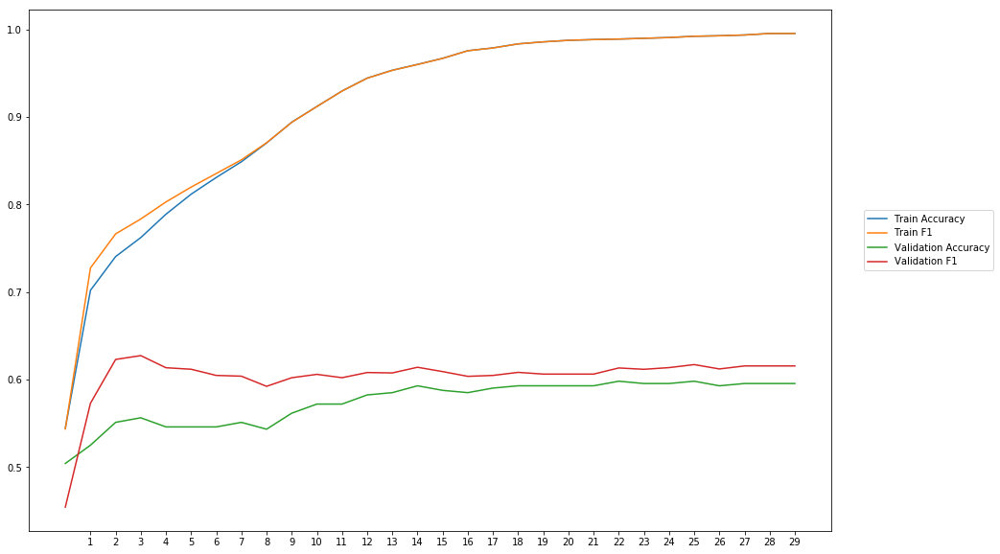

Average Accuracy: 57.43%
Average Precision: 56.45%
Average Recall: 65.11%
Average F1: 60.32%

-----Fold 8--------


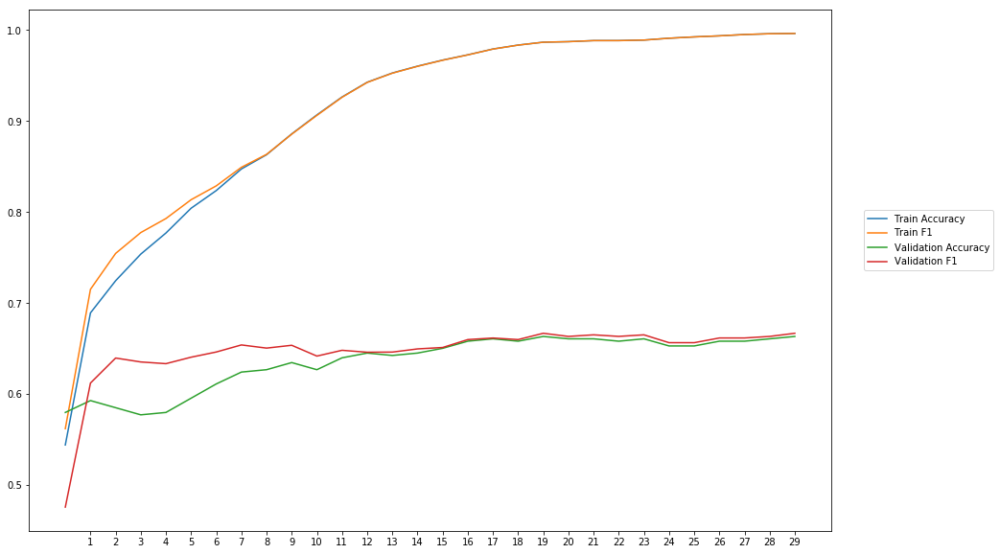

Average Accuracy: 63.59%
Average Precision: 62.90%
Average Recall: 67.00%
Average F1: 64.64%

-----Fold 9--------


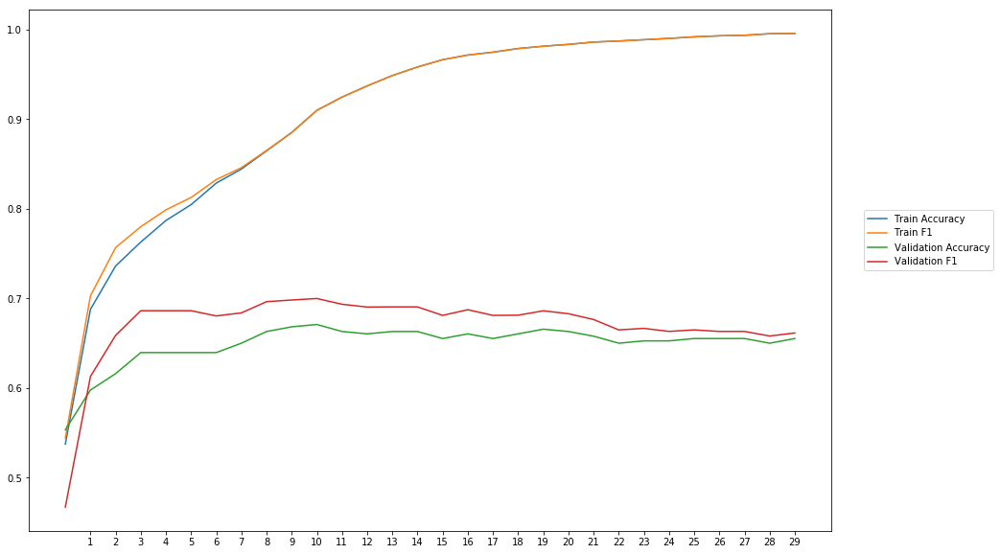

Average Accuracy: 64.92%
Average Precision: 62.94%
Average Recall: 72.09%
Average F1: 67.02%

-----Fold 10--------


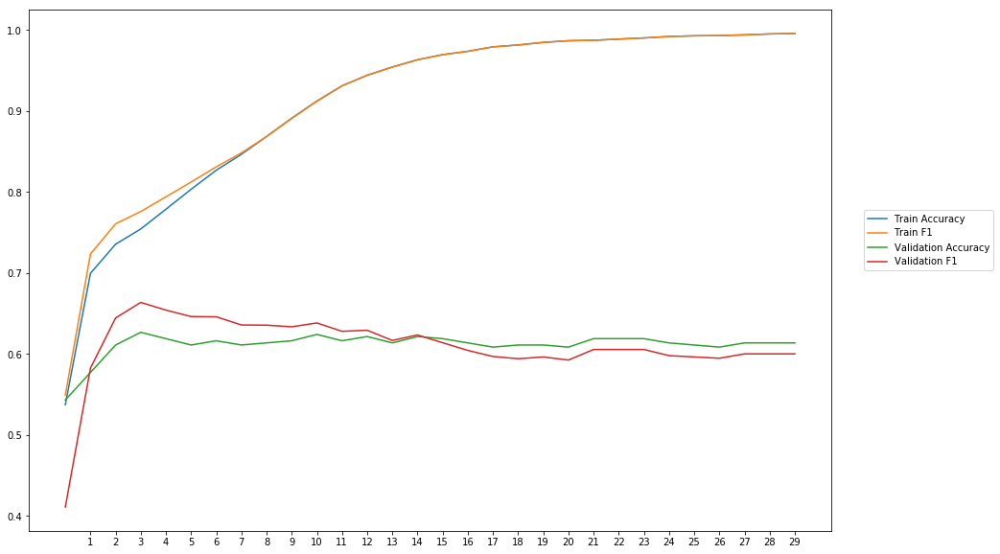

Average Accuracy: 61.14%
Average Precision: 60.98%
Average Recall: 61.50%
Average F1: 60.96%

-------Overallresults-------


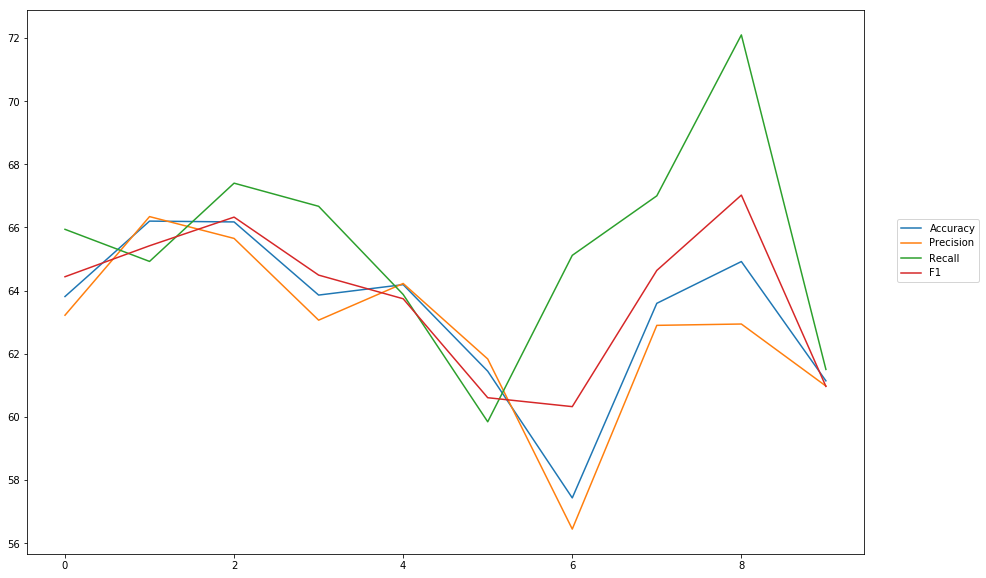

Accuracy: Mean = 63.28% (+/- 2.51%), Max = 66.20%, Min =  57.43%
Precision: Mean = 62.76% (+/- 2.60%), Max = 66.34%, Min =  56.45%
Recall: Mean = 65.43% (+/- 3.19%), Max = 72.09%, Min =  59.84%
F1: Mean = 63.80% (+/- 2.26%), Max = 67.02%, Min =  60.32%


In [21]:
cross_val(model_4, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'gloVe_42_300')

## GloVE 27B 25 Dim

In [74]:
word_vectors_glove_27_25 = txt_embeddings(path+'glove.twitter.27B.25d.txt')
EMBEDDING_DIM = 25
embedding_matrix_glove_27_25 = create_eb_matrix (word_vectors_glove_27_25, EMBEDDING_DIM)

In [75]:
wv_layer_12 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_glove_27_25],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_12 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_12 = wv_layer_12(comment_input_12)

#First Dense Layer
x_12 = Dense(600, activation='relu')(embedded_sequences_12)

x_12 = Flatten()(x_12)

#Output (Dense) Layer
preds_12 = Dense(2, activation='softmax')(x_12)

# build the model
model_12 = Model(inputs=[comment_input_12], outputs=preds_12)


-----Fold 1--------


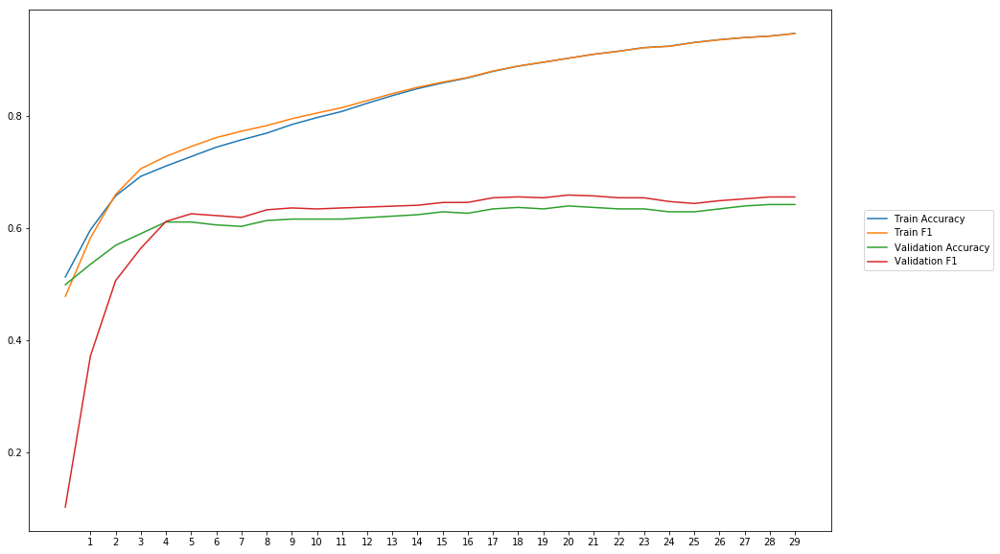

Average Accuracy: 61.52%
Average Precision: 60.61%
Average Recall: 62.85%
Average F1: 60.83%

-----Fold 2--------


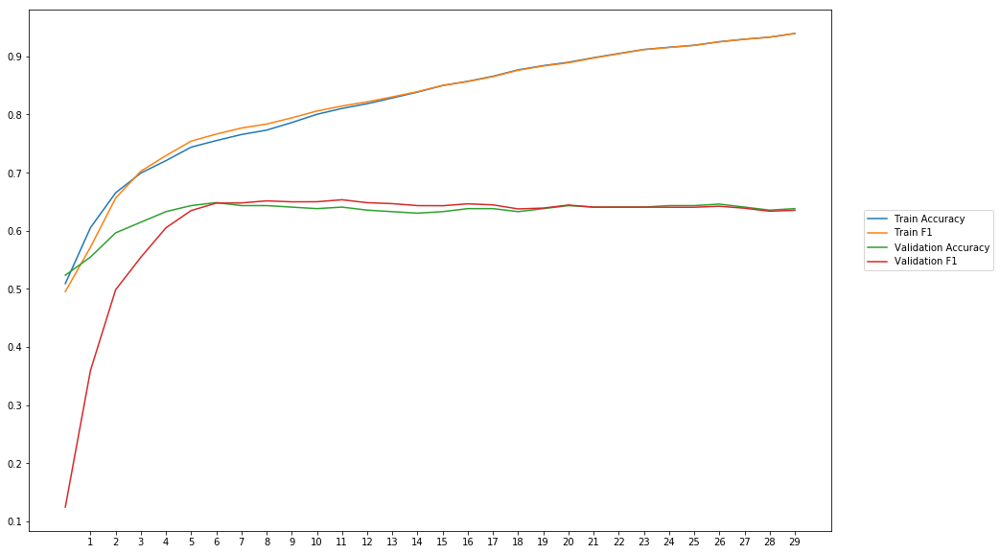

Average Accuracy: 63.03%
Average Precision: 63.83%
Average Recall: 60.35%
Average F1: 60.74%

-----Fold 3--------


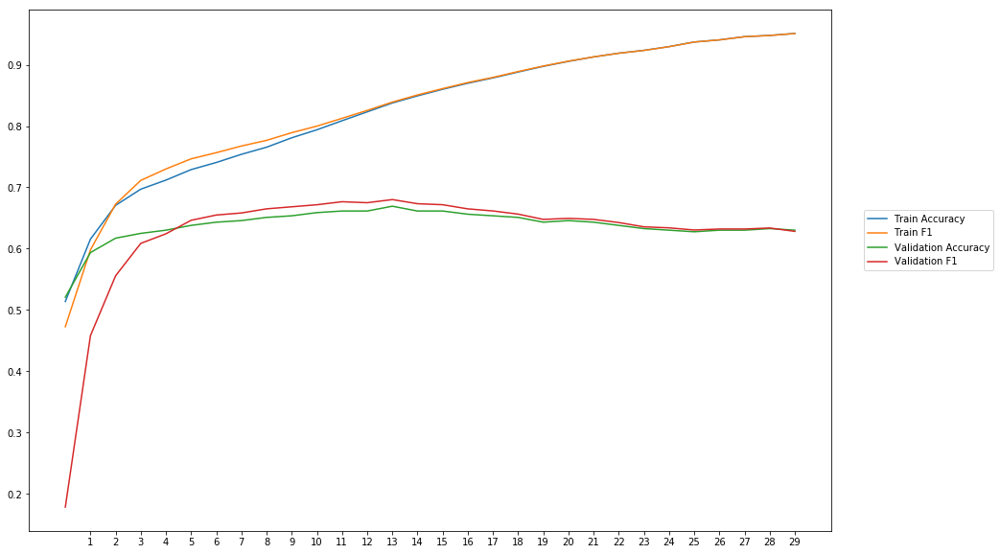

Average Accuracy: 63.79%
Average Precision: 63.73%
Average Recall: 63.11%
Average F1: 62.55%

-----Fold 4--------


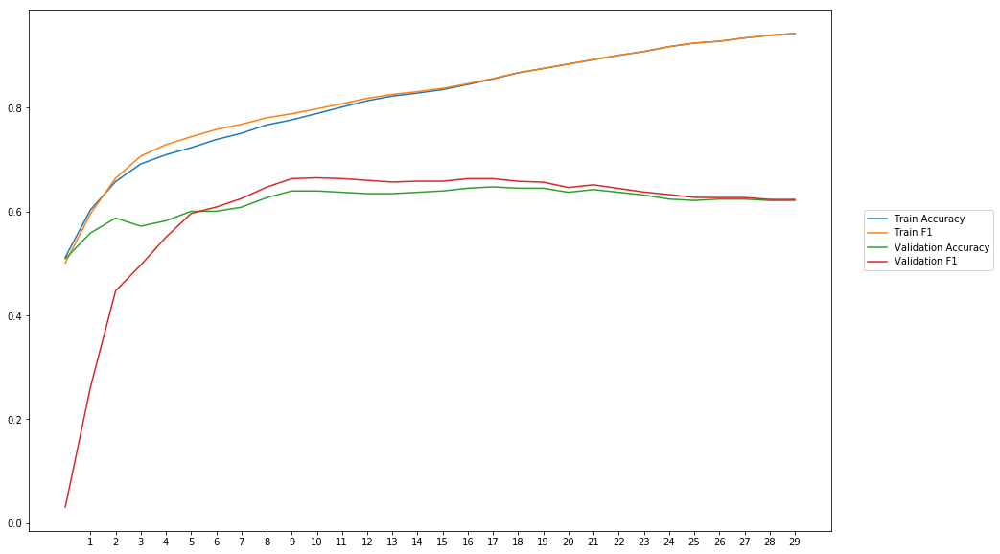

Average Accuracy: 61.91%
Average Precision: 63.86%
Average Recall: 60.59%
Average F1: 59.58%

-----Fold 5--------


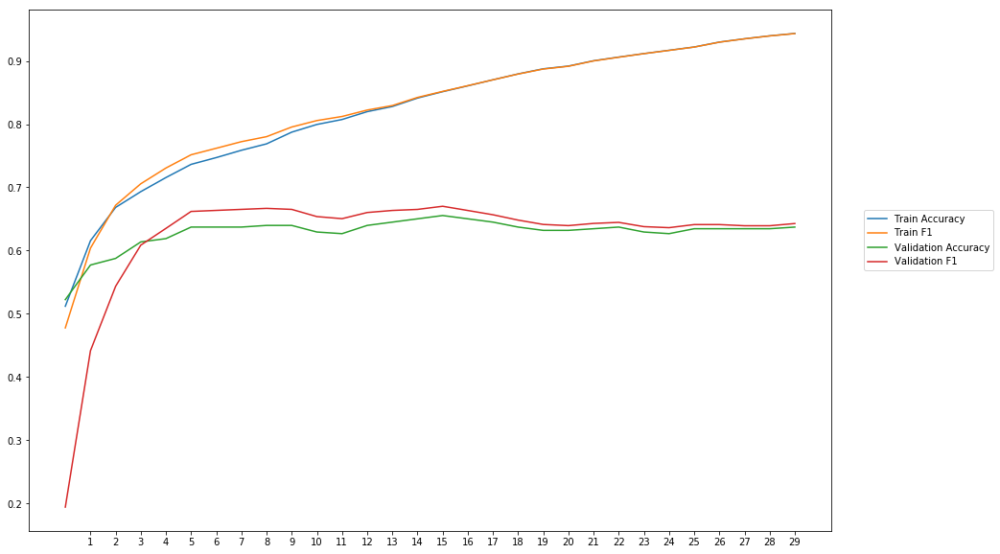

Average Accuracy: 62.85%
Average Precision: 62.40%
Average Recall: 64.15%
Average F1: 62.40%

-----Fold 6--------


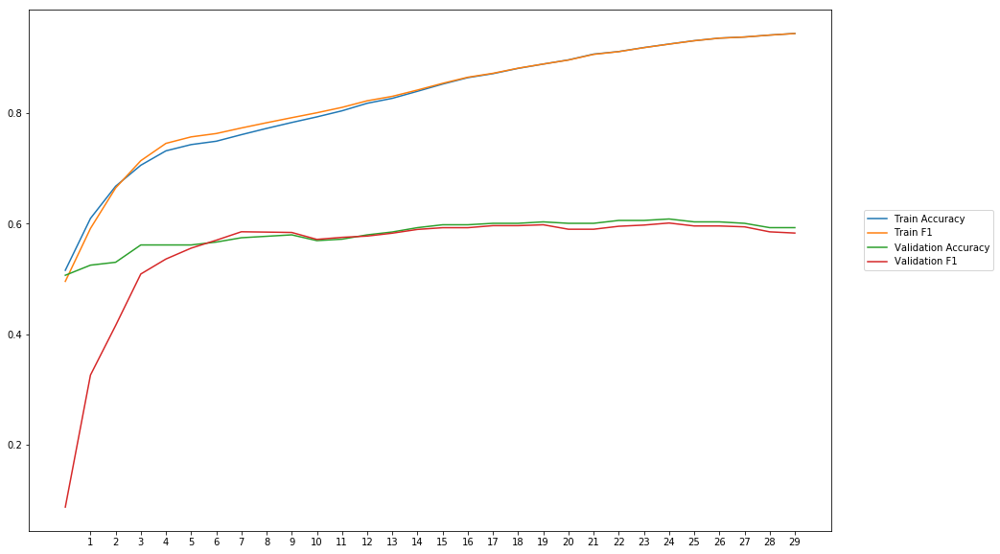

Average Accuracy: 58.18%
Average Precision: 58.64%
Average Recall: 53.86%
Average F1: 55.17%

-----Fold 7--------


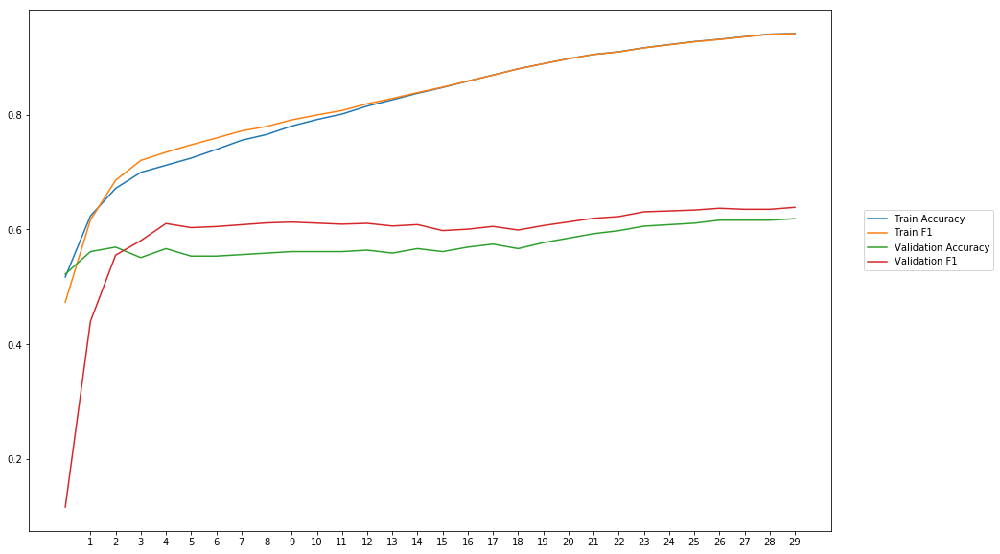

Average Accuracy: 57.61%
Average Precision: 57.40%
Average Recall: 63.63%
Average F1: 58.99%

-----Fold 8--------


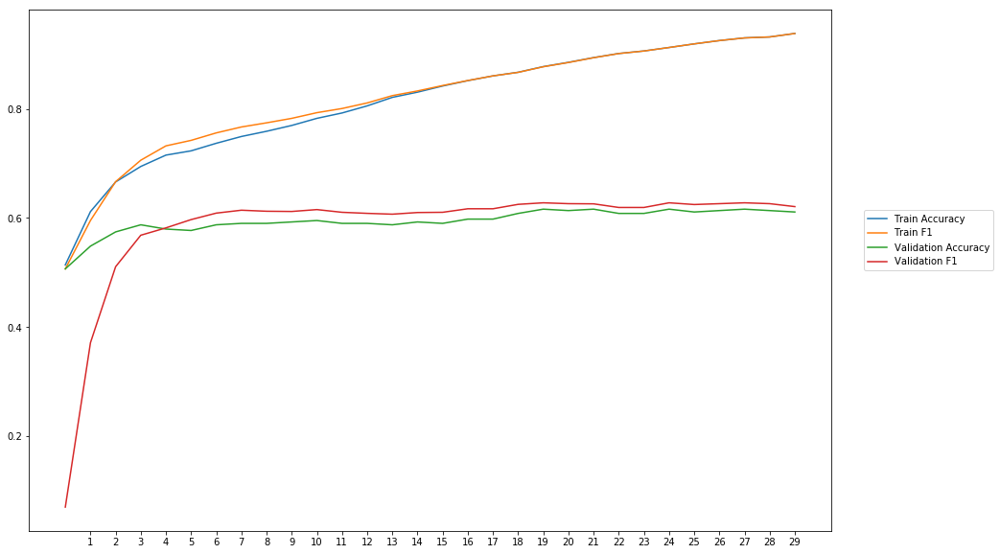

Average Accuracy: 59.43%
Average Precision: 59.21%
Average Recall: 60.03%
Average F1: 58.46%

-----Fold 9--------


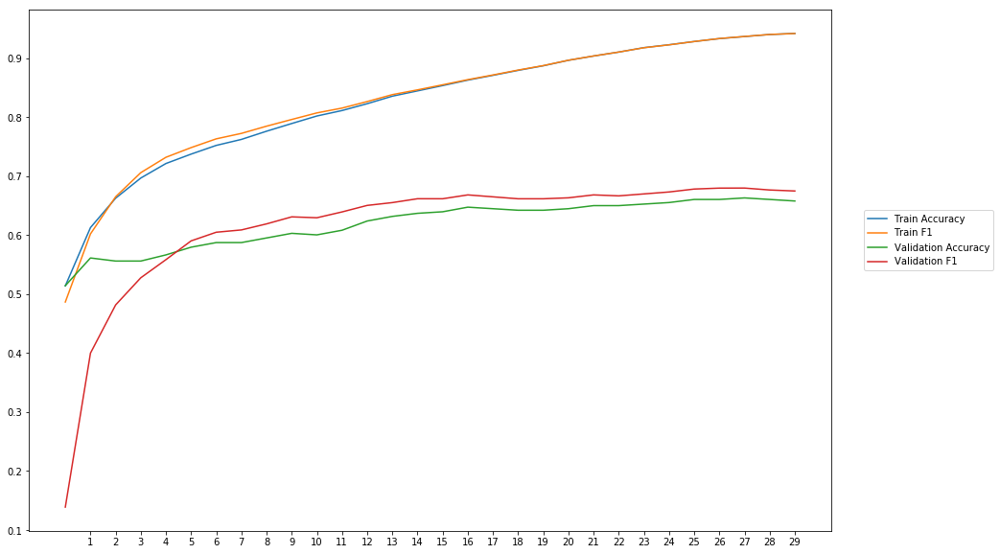

Average Accuracy: 61.94%
Average Precision: 61.25%
Average Recall: 63.96%
Average F1: 61.49%

-----Fold 10--------


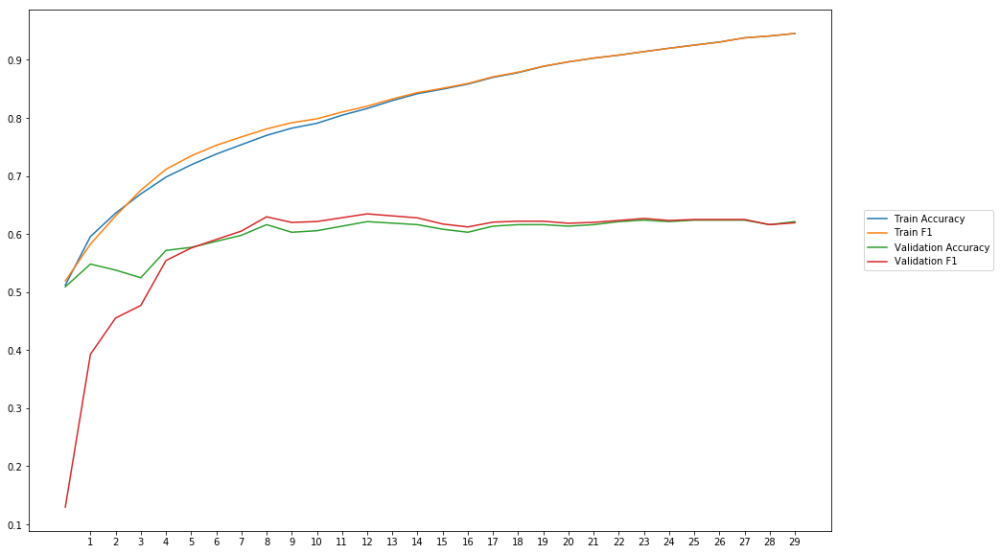

Average Accuracy: 60.04%
Average Precision: 60.02%
Average Recall: 58.38%
Average F1: 58.31%

-------Overallresults-------


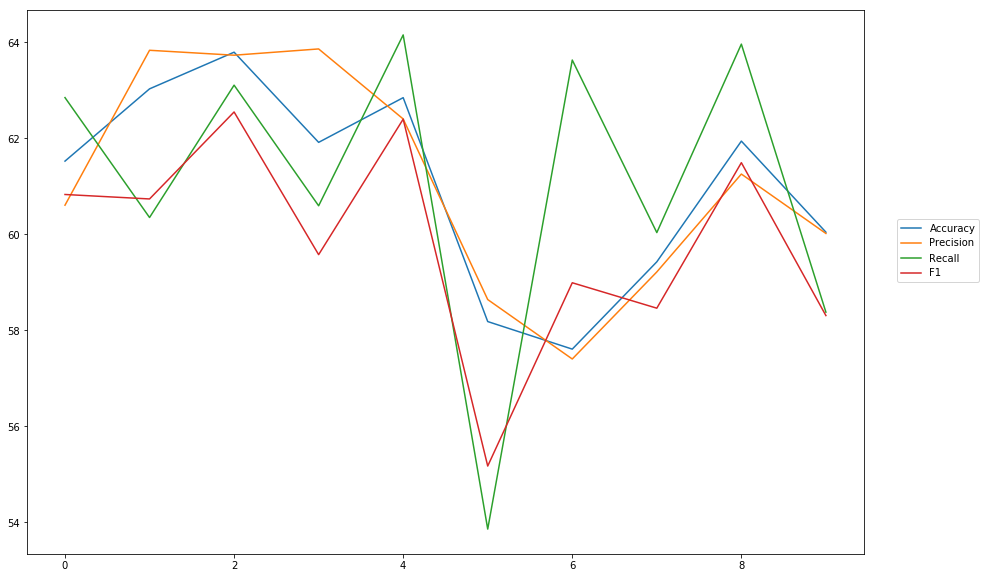

Accuracy: Mean = 61.03% (+/- 2.00%), Max = 63.79%, Min =  57.61%
Precision: Mean = 61.10% (+/- 2.20%), Max = 63.86%, Min =  57.40%
Recall: Mean = 61.09% (+/- 3.05%), Max = 64.15%, Min =  53.86%
F1: Mean = 59.85% (+/- 2.13%), Max = 62.55%, Min =  55.17%


In [76]:
cross_val(model_12, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'gloVe_twitter_27_25')

## GloVe 27B 50 Dim

In [27]:
#Load pretrained 27B 50 Dim GloVe-Embeddings
word_vectors_glove_27_50 = txt_embeddings(path+'glove.twitter.27B.50d.txt')
EMBEDDING_DIM = 50
embedding_matrix_glove_27_50 = create_eb_matrix(word_vectors_glove_27_50, EMBEDDING_DIM)

In [29]:
wv_layer_6 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_glove_27_50],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_6 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_6 = wv_layer_6(comment_input_6)

#First Dense Layer
x_6 = Dense(600, activation='relu')(embedded_sequences_6)

x_6 = Flatten()(x_6)

#Output (Dense) Layer
preds_6 = Dense(2, activation='softmax')(x_6)

# build the model
model_6 = Model(inputs=[comment_input_6], outputs=preds_6)


-----Fold 1--------


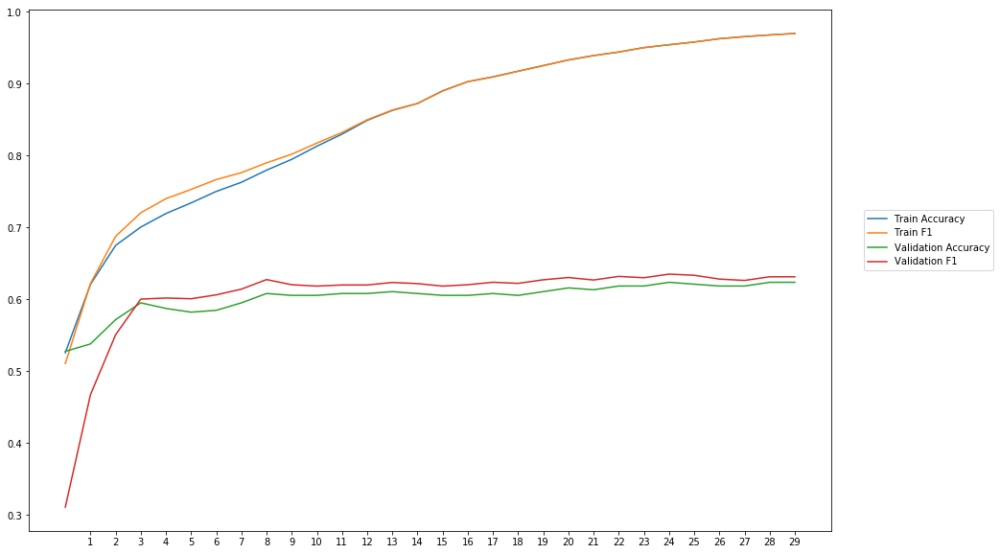

Average Accuracy: 60.19%
Average Precision: 59.63%
Average Recall: 61.89%
Average F1: 60.37%

-----Fold 2--------


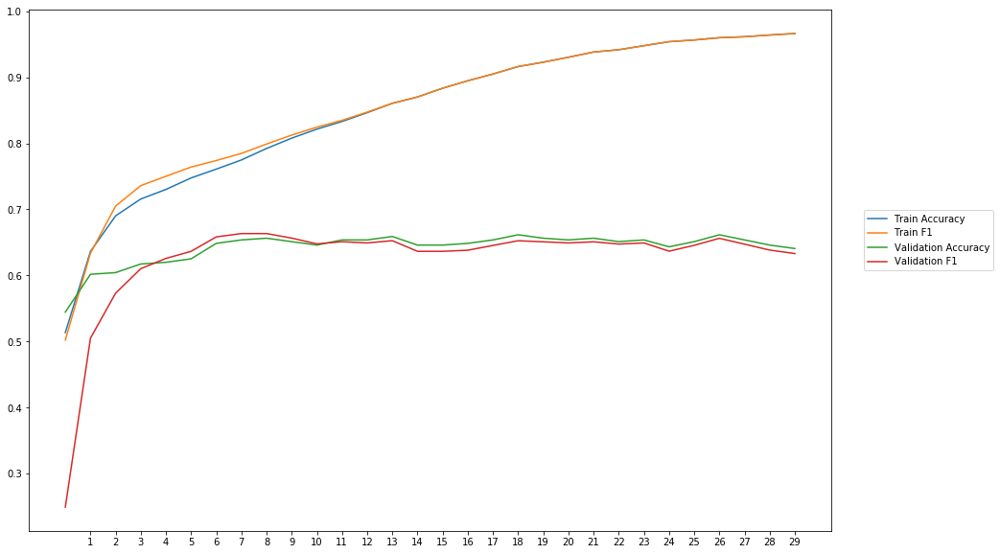

Average Accuracy: 64.18%
Average Precision: 64.85%
Average Recall: 61.57%
Average F1: 62.51%

-----Fold 3--------


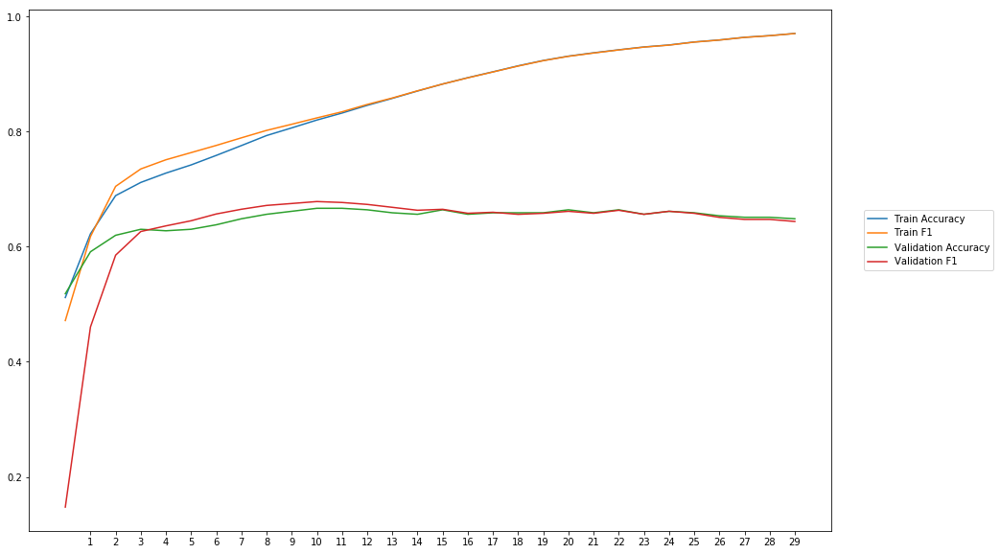

Average Accuracy: 64.66%
Average Precision: 64.71%
Average Recall: 63.58%
Average F1: 63.25%

-----Fold 4--------


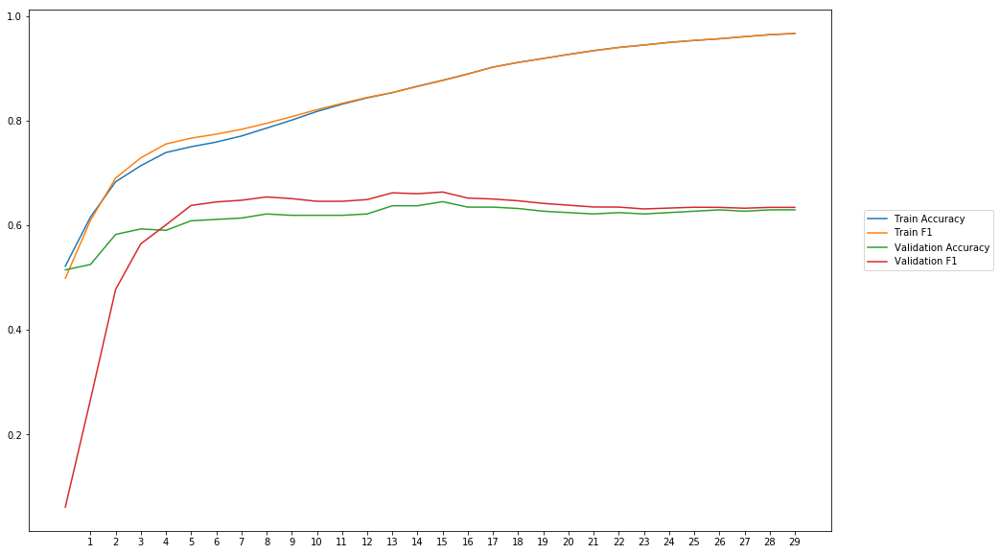

Average Accuracy: 61.46%
Average Precision: 61.92%
Average Recall: 62.34%
Average F1: 60.19%

-----Fold 5--------


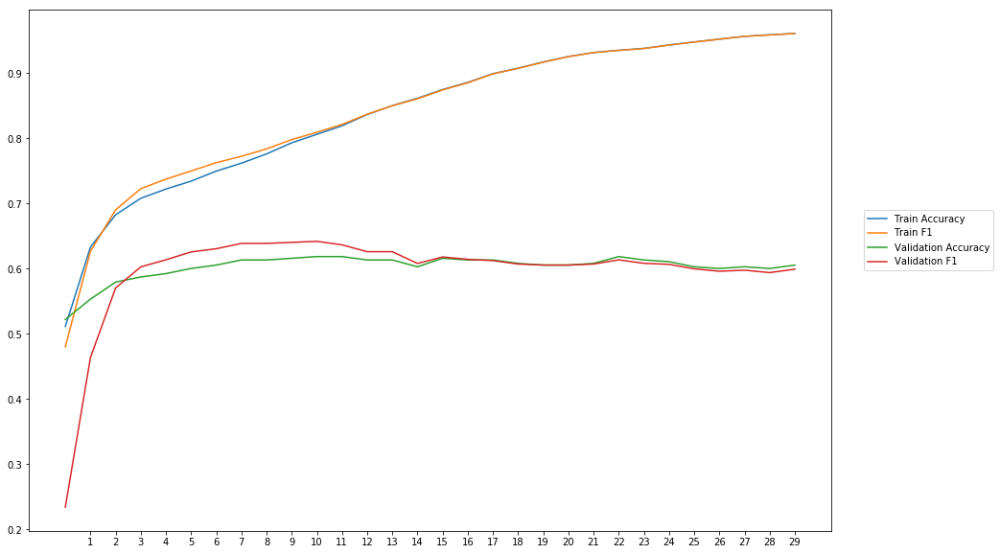

Average Accuracy: 60.27%
Average Precision: 60.09%
Average Recall: 60.33%
Average F1: 59.63%

-----Fold 6--------


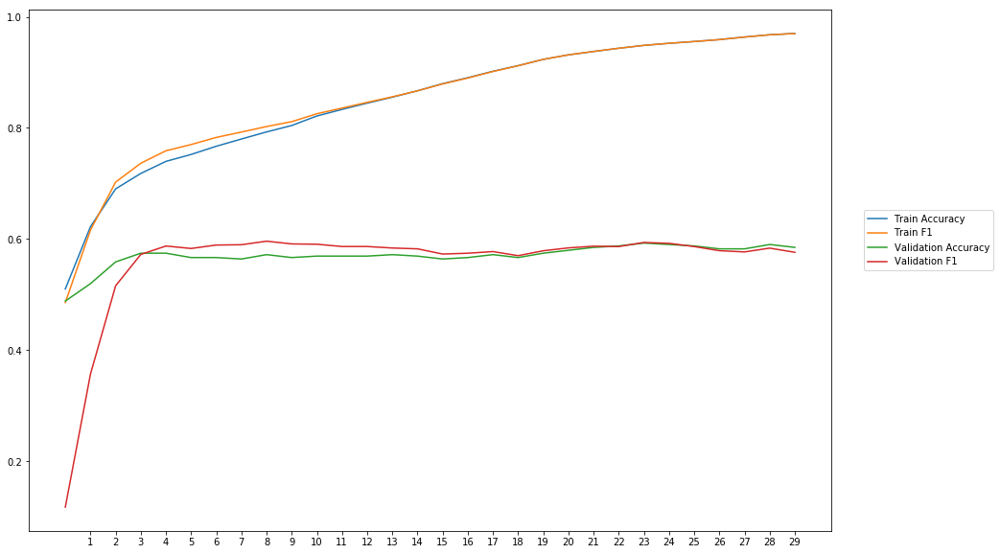

Average Accuracy: 57.01%
Average Precision: 56.53%
Average Recall: 56.39%
Average F1: 55.82%

-----Fold 7--------


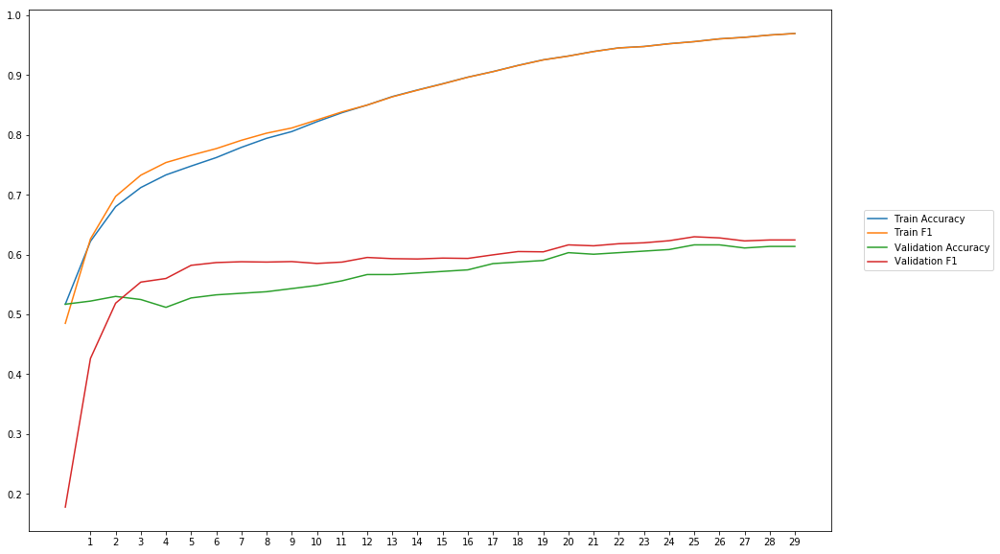

Average Accuracy: 56.96%
Average Precision: 56.51%
Average Recall: 60.82%
Average F1: 57.80%

-----Fold 8--------


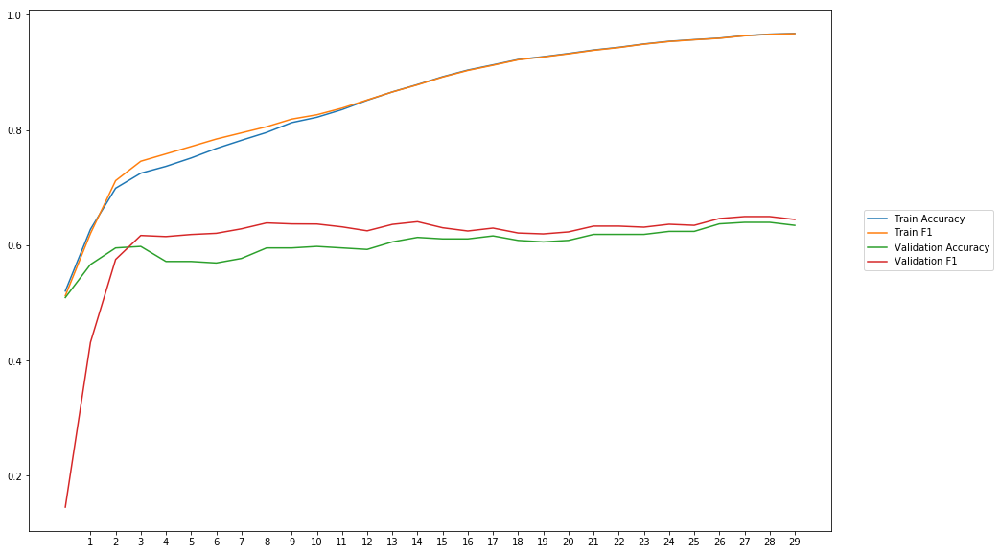

Average Accuracy: 60.23%
Average Precision: 59.48%
Average Recall: 63.93%
Average F1: 60.69%

-----Fold 9--------


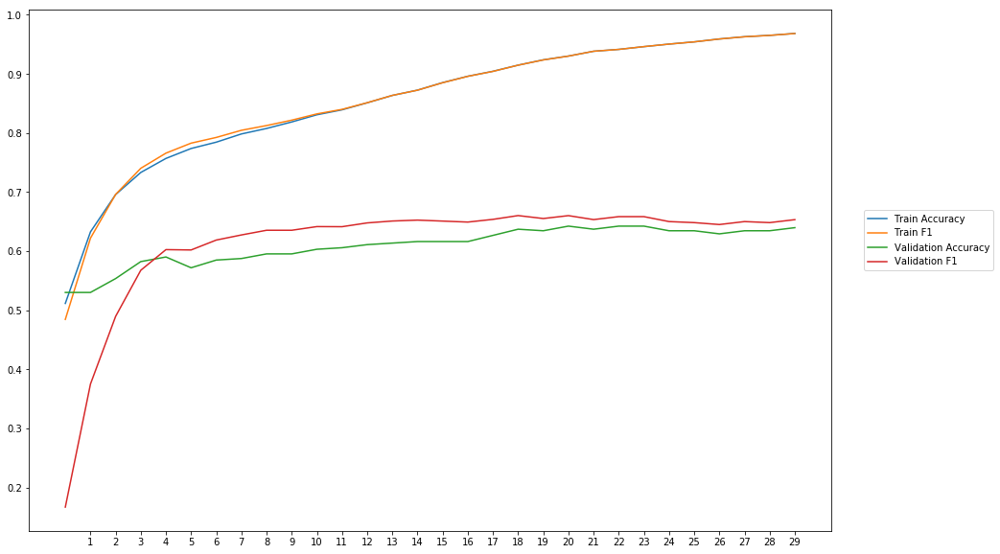

Average Accuracy: 60.91%
Average Precision: 60.34%
Average Recall: 64.55%
Average F1: 61.16%

-----Fold 10--------


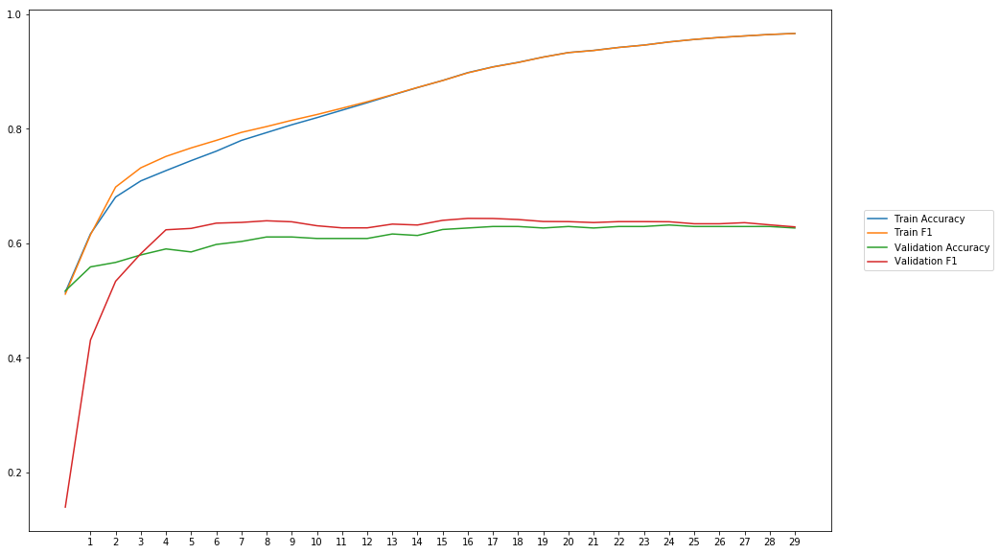

Average Accuracy: 61.00%
Average Precision: 60.64%
Average Recall: 62.62%
Average F1: 60.64%

-------Overallresults-------


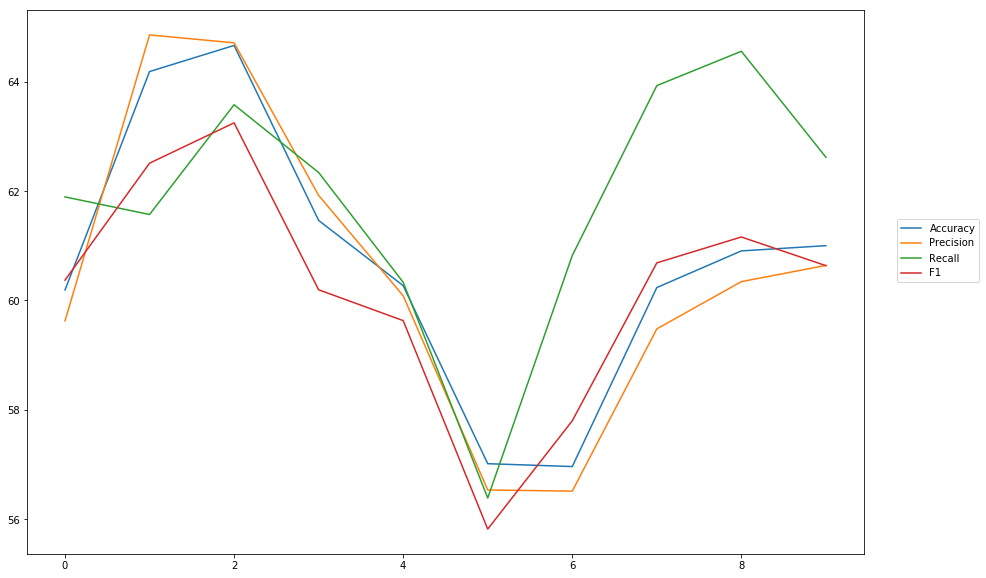

Accuracy: Mean = 60.69% (+/- 2.38%), Max = 64.66%, Min =  56.96%
Precision: Mean = 60.47% (+/- 2.69%), Max = 64.85%, Min =  56.51%
Recall: Mean = 61.80% (+/- 2.21%), Max = 64.55%, Min =  56.39%
F1: Mean = 60.20% (+/- 2.03%), Max = 63.25%, Min =  55.82%


In [30]:
cross_val(model_6, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'gloVe_twitter_27_50')

## GloVe 27B 100 Dim

In [31]:
#Load pretrained 27B 100 Dim GloVe-Embeddings
word_vectors_glove_27_100 = txt_embeddings(path+'glove.twitter.27B.100d.txt')
EMBEDDING_DIM = 100
embedding_matrix_glove_27_100 = create_eb_matrix(word_vectors_glove_27_100,EMBEDDING_DIM)

In [33]:
wv_layer_7 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_glove_27_100],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_7 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_7 = wv_layer_7(comment_input_7)

#First Dense Layer
x_7 = Dense(600, activation='relu')(embedded_sequences_7)

x_7 = Flatten()(x_7)

#Output (Dense) Layer
preds_7 = Dense(2, activation='softmax')(x_7)

# build the model
model_7 = Model(inputs=[comment_input_7], outputs=preds_7)


-----Fold 1--------


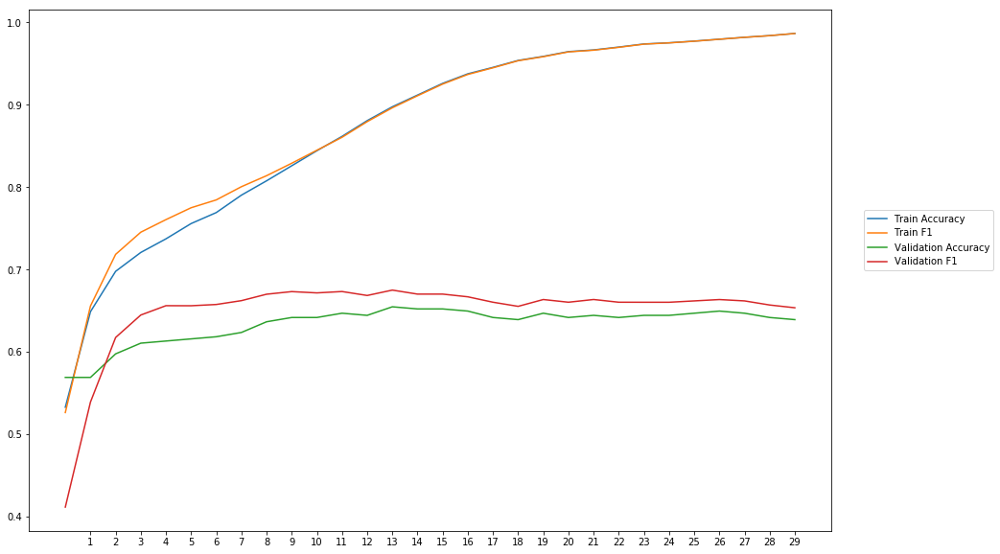

Average Accuracy: 63.33%
Average Precision: 61.99%
Average Recall: 68.77%
Average F1: 64.86%

-----Fold 2--------


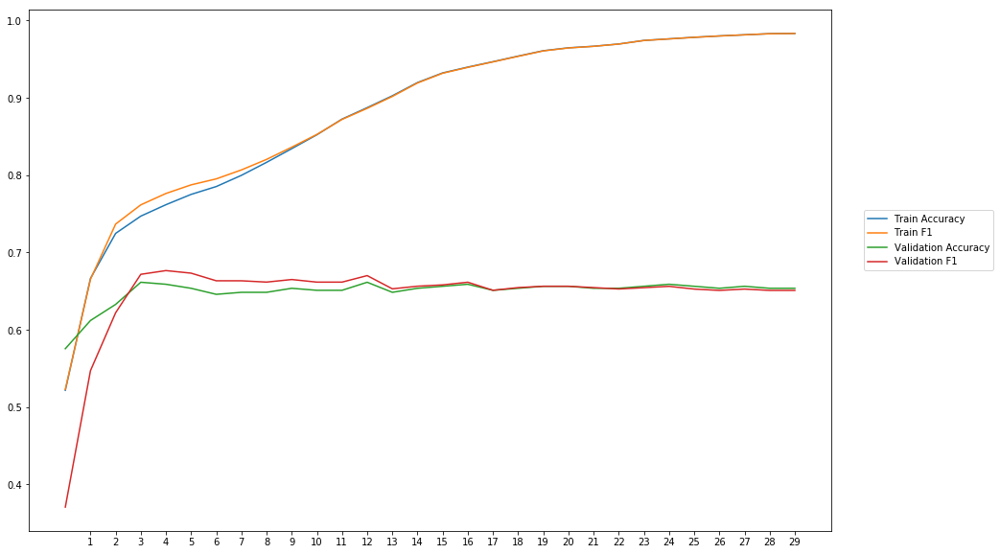

Average Accuracy: 64.95%
Average Precision: 64.88%
Average Recall: 64.90%
Average F1: 64.44%

-----Fold 3--------


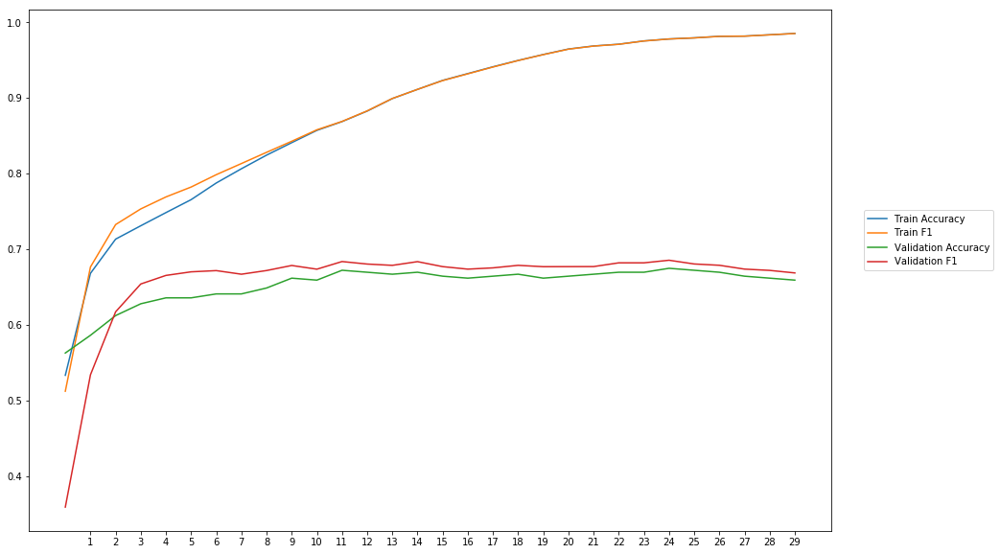

Average Accuracy: 65.24%
Average Precision: 64.16%
Average Recall: 68.46%
Average F1: 65.80%

-----Fold 4--------


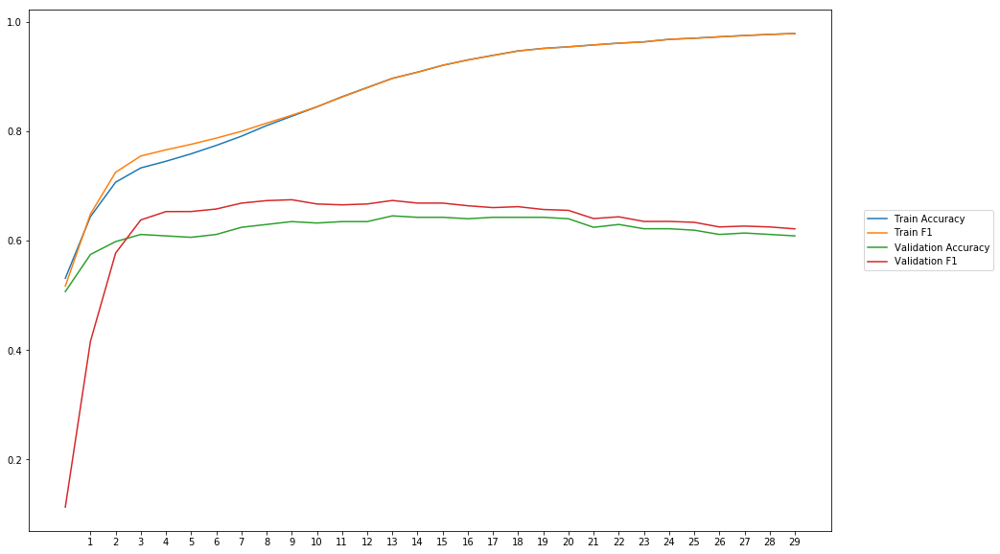

Average Accuracy: 61.99%
Average Precision: 60.88%
Average Recall: 66.28%
Average F1: 62.36%

-----Fold 5--------


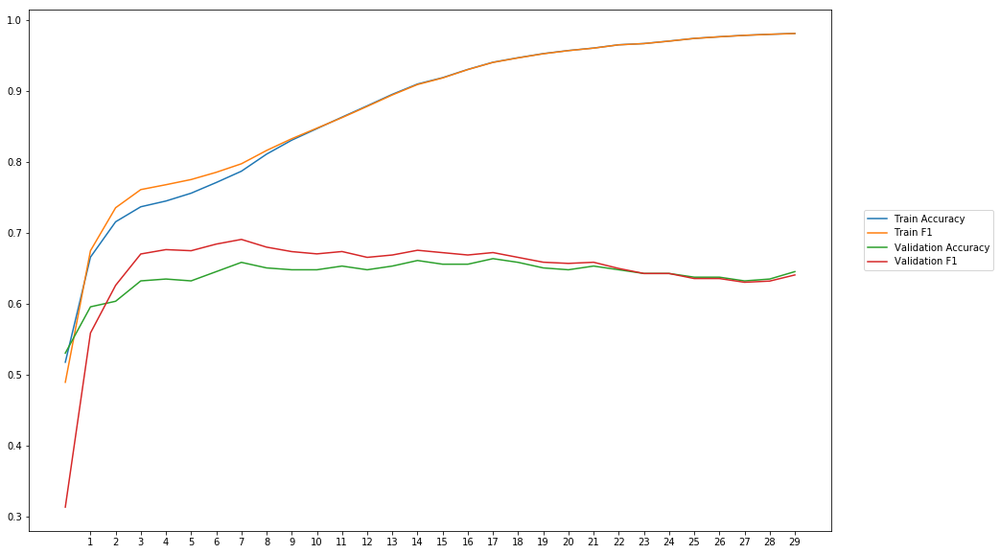

Average Accuracy: 63.96%
Average Precision: 62.99%
Average Recall: 67.05%
Average F1: 64.50%

-----Fold 6--------


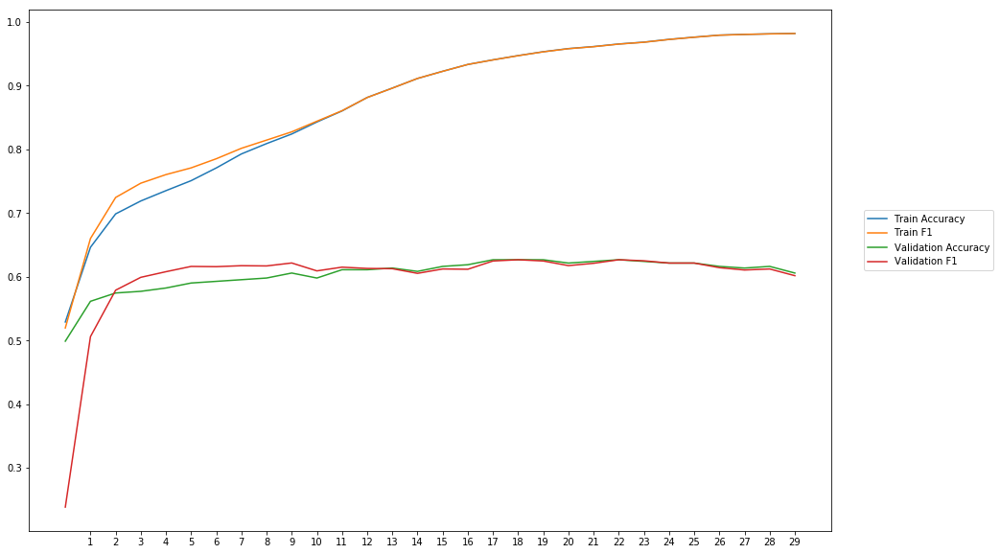

Average Accuracy: 60.41%
Average Precision: 60.12%
Average Recall: 60.23%
Average F1: 59.81%

-----Fold 7--------


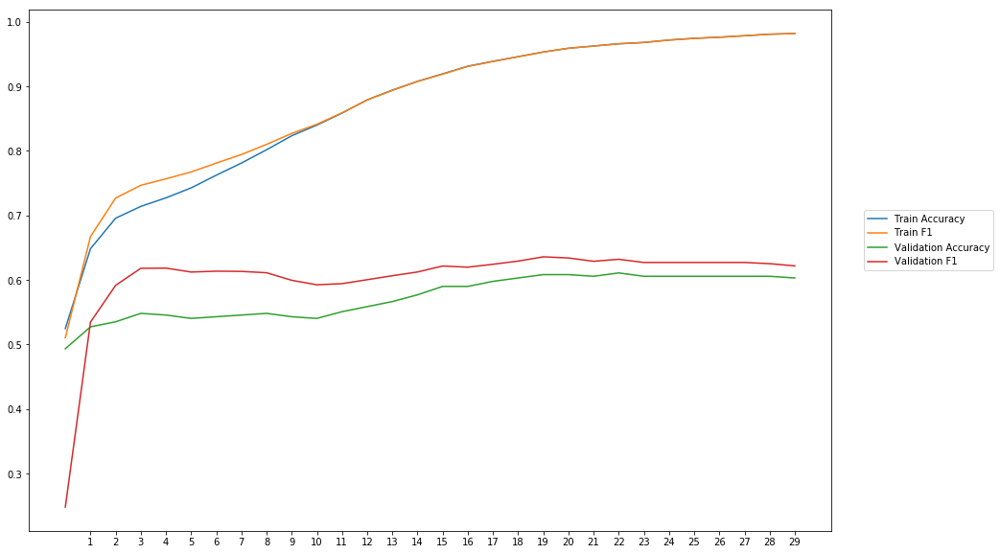

Average Accuracy: 57.39%
Average Precision: 56.17%
Average Recall: 66.02%
Average F1: 60.26%

-----Fold 8--------


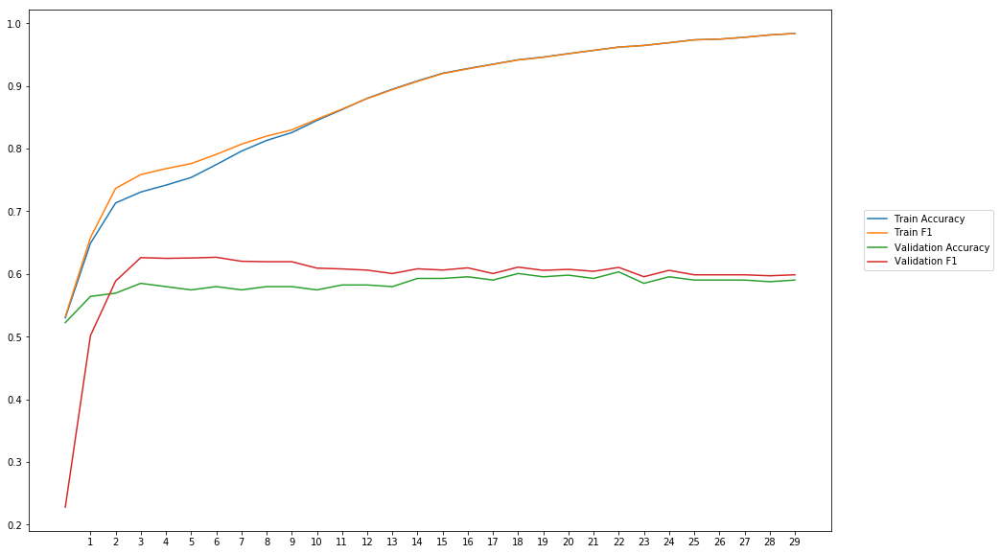

Average Accuracy: 58.38%
Average Precision: 57.80%
Average Recall: 62.02%
Average F1: 59.19%

-----Fold 9--------


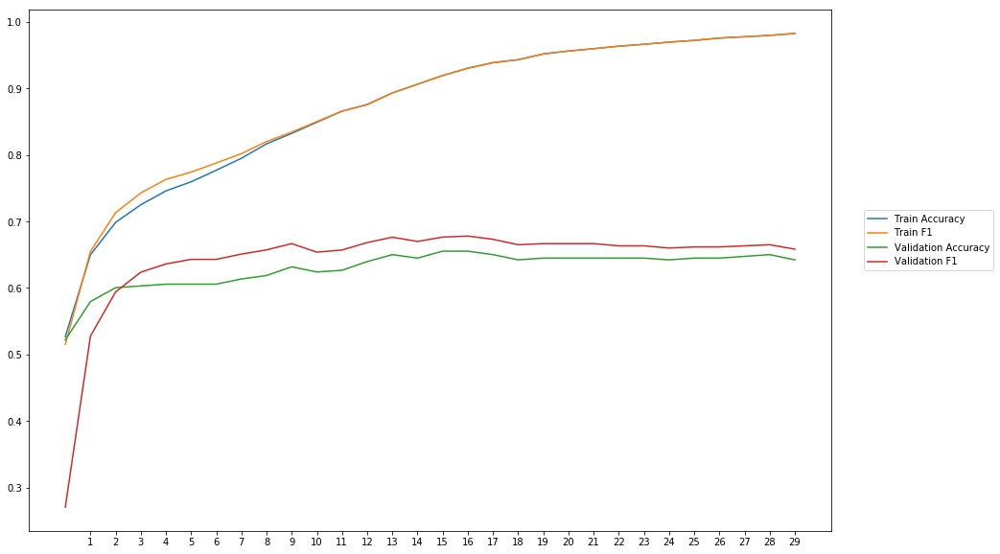

Average Accuracy: 62.91%
Average Precision: 61.49%
Average Recall: 68.05%
Average F1: 64.10%

-----Fold 10--------


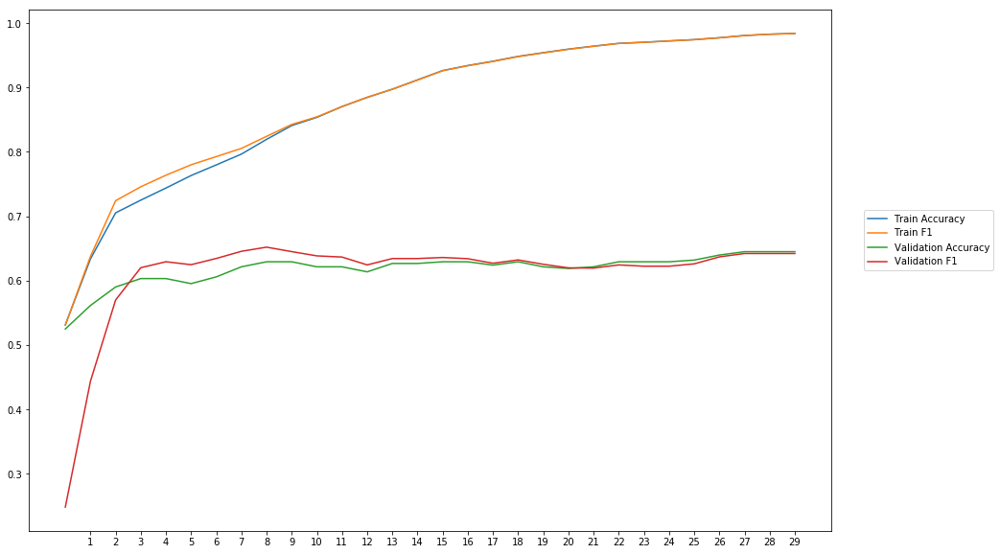

Average Accuracy: 61.80%
Average Precision: 61.67%
Average Recall: 61.76%
Average F1: 61.11%

-------Overallresults-------


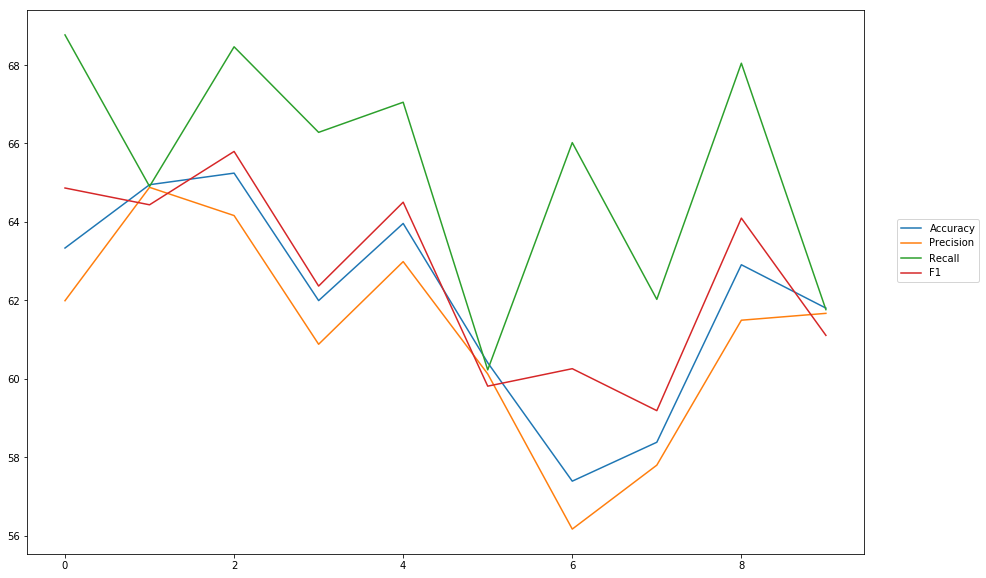

Accuracy: Mean = 62.04% (+/- 2.50%), Max = 65.24%, Min =  57.39%
Precision: Mean = 61.21% (+/- 2.54%), Max = 64.88%, Min =  56.17%
Recall: Mean = 65.35% (+/- 2.88%), Max = 68.77%, Min =  60.23%
F1: Mean = 62.64% (+/- 2.27%), Max = 65.80%, Min =  59.19%


In [34]:
cross_val(model_7, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'gloVe_twitter_27_100')

## GloVe 27B 200 Dim

In [36]:
#Load pretrained 27B 300 Dim GloVe-Embeddings
word_vectors_glove_27_200 = txt_embeddings(path+'glove.twitter.27B.200d.txt')
EMBEDDING_DIM = 200
embedding_matrix_glove_27_200 = create_eb_matrix(word_vectors_glove_27_200,EMBEDDING_DIM)

In [38]:
wv_layer_8 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_glove_27_200],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_8 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_8 = wv_layer_8(comment_input_8)

#First Dense Layer
x_8 = Dense(600, activation='relu')(embedded_sequences_8)

x_8 = Flatten()(x_8)

#Output (Dense) Layer
preds_8 = Dense(2, activation='softmax')(x_8)

# build the model
model_8 = Model(inputs=[comment_input_8], outputs=preds_8)


-----Fold 1--------


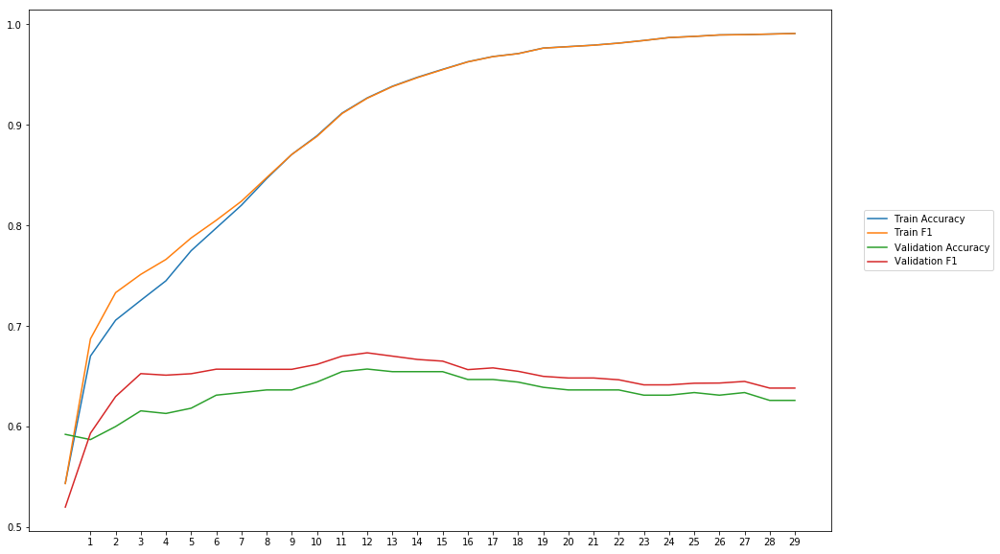

Average Accuracy: 63.27%
Average Precision: 62.18%
Average Recall: 67.52%
Average F1: 64.62%

-----Fold 2--------


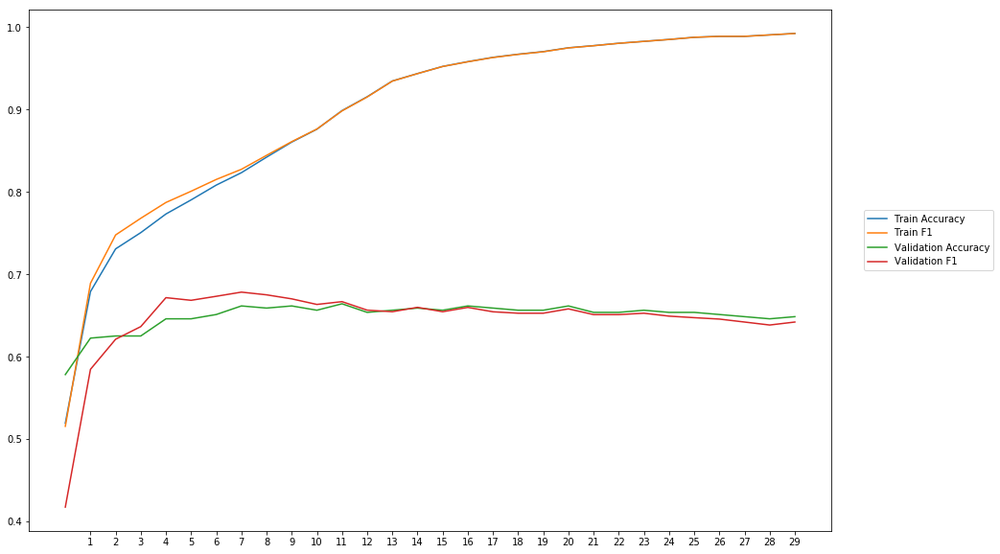

Average Accuracy: 64.93%
Average Precision: 64.83%
Average Recall: 64.75%
Average F1: 64.49%

-----Fold 3--------


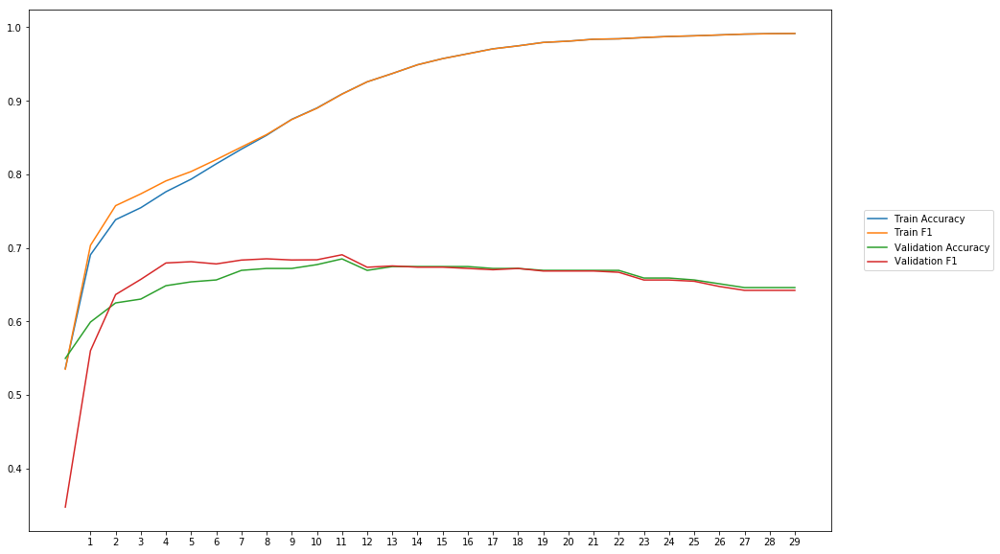

Average Accuracy: 65.62%
Average Precision: 65.22%
Average Recall: 66.11%
Average F1: 65.29%

-----Fold 4--------


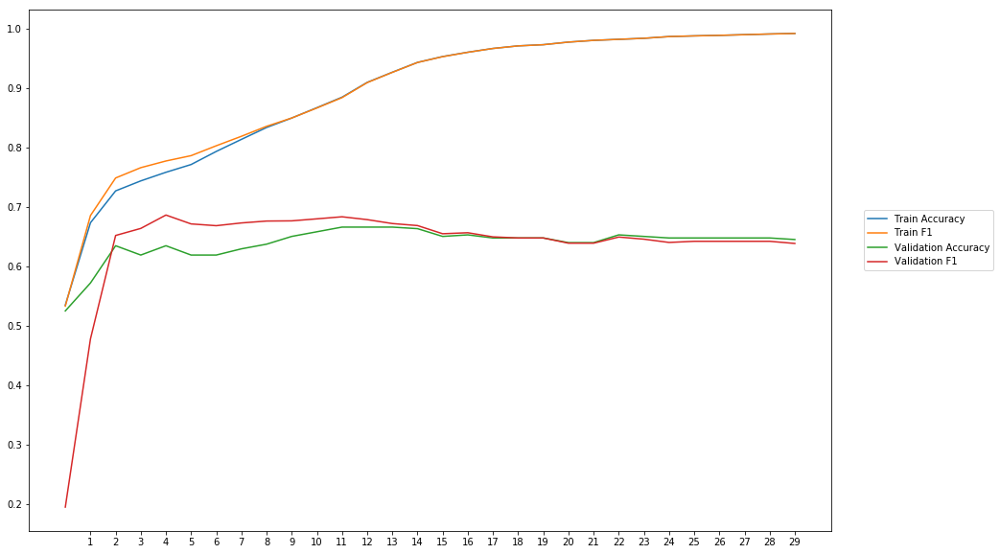

Average Accuracy: 63.89%
Average Precision: 63.46%
Average Recall: 65.71%
Average F1: 63.64%

-----Fold 5--------


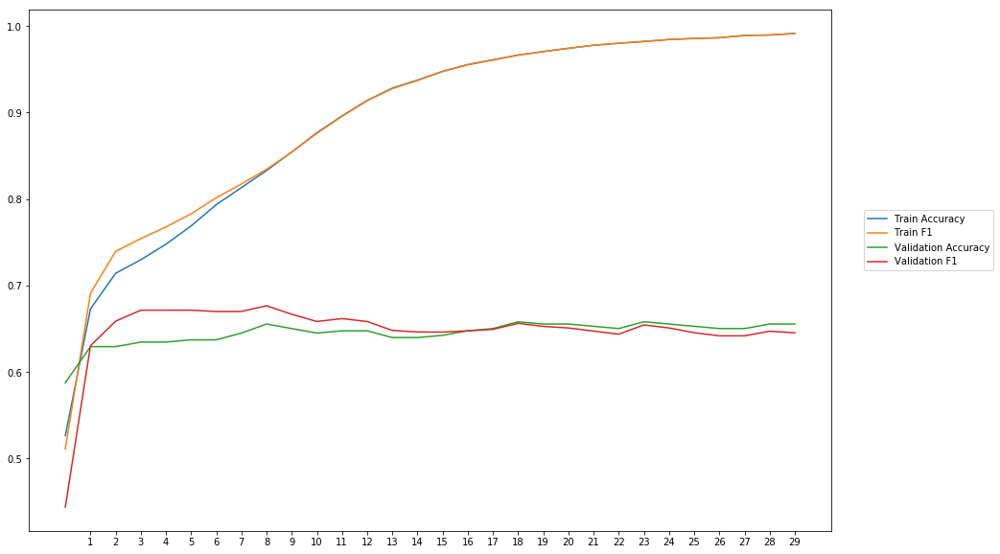

Average Accuracy: 64.49%
Average Precision: 64.15%
Average Recall: 66.02%
Average F1: 64.74%

-----Fold 6--------


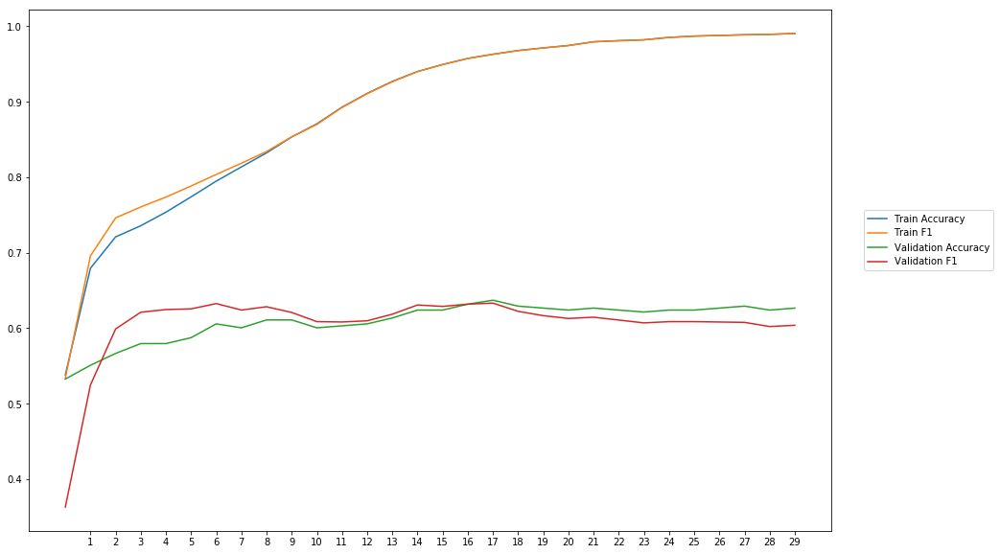

Average Accuracy: 60.91%
Average Precision: 60.95%
Average Recall: 60.77%
Average F1: 60.53%

-----Fold 7--------


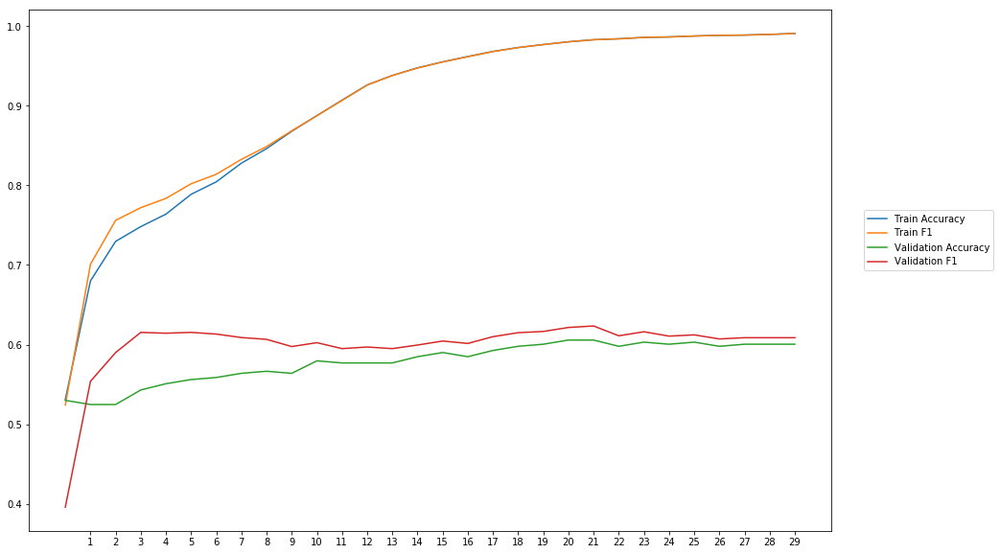

Average Accuracy: 57.87%
Average Precision: 57.09%
Average Recall: 63.65%
Average F1: 59.92%

-----Fold 8--------


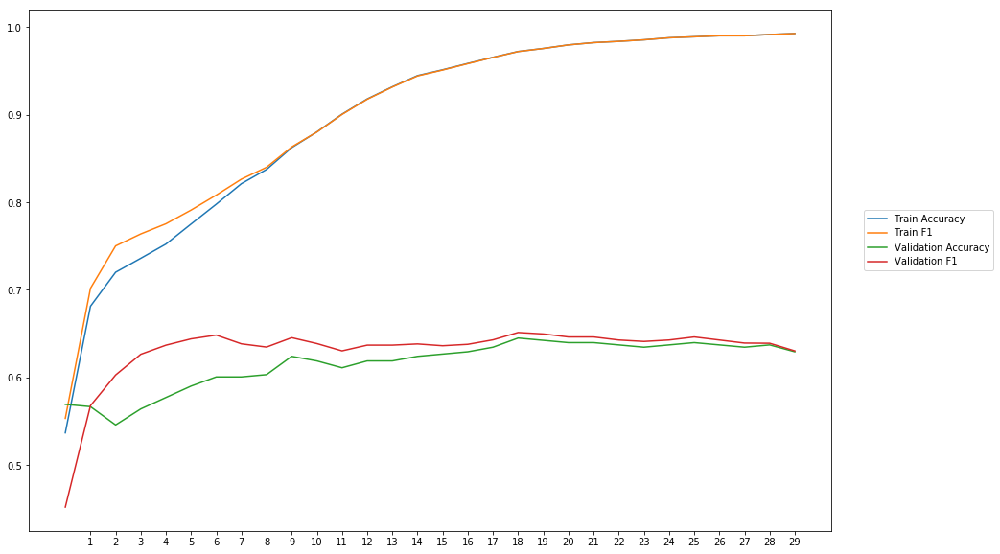

Average Accuracy: 61.58%
Average Precision: 60.76%
Average Recall: 66.09%
Average F1: 63.03%

-----Fold 9--------


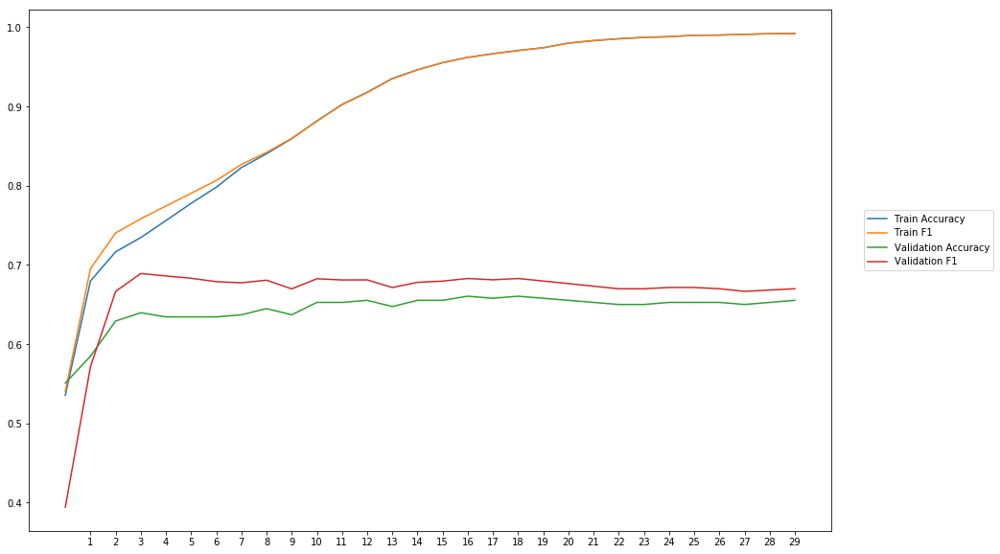

Average Accuracy: 64.36%
Average Precision: 62.46%
Average Recall: 71.54%
Average F1: 66.36%

-----Fold 10--------


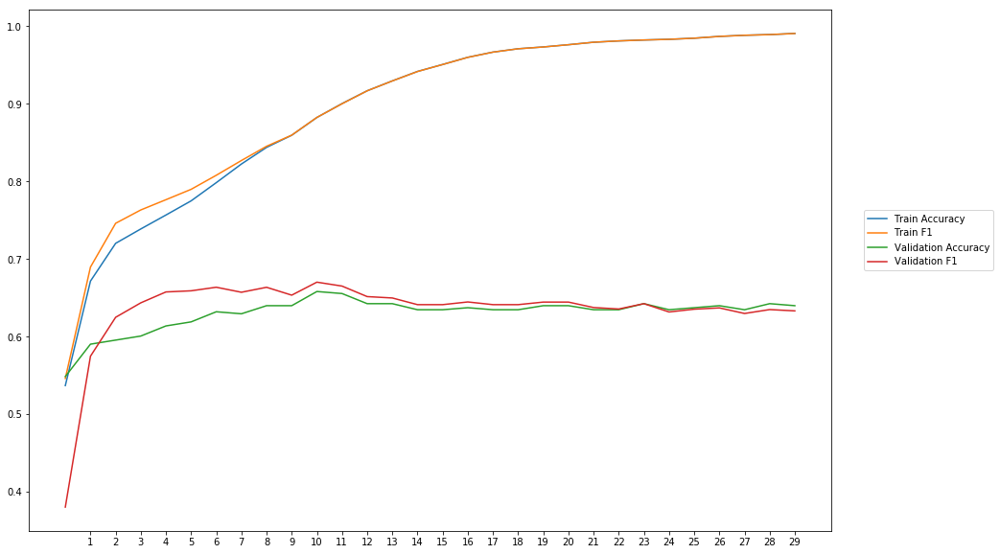

Average Accuracy: 62.99%
Average Precision: 62.41%
Average Recall: 65.13%
Average F1: 63.42%

-------Overallresults-------


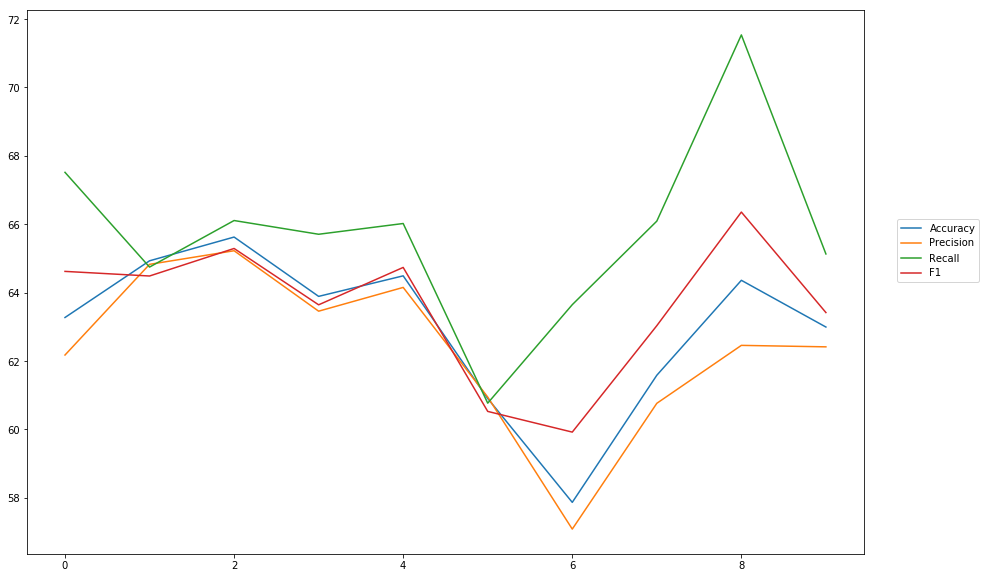

Accuracy: Mean = 62.99% (+/- 2.20%), Max = 65.62%, Min =  57.87%
Precision: Mean = 62.35% (+/- 2.26%), Max = 65.22%, Min =  57.09%
Recall: Mean = 65.73% (+/- 2.60%), Max = 71.54%, Min =  60.77%
F1: Mean = 63.60% (+/- 1.92%), Max = 66.36%, Min =  59.92%


In [39]:
cross_val(model_8, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'gloVe_twitter_27_300')

# Fasttext

## Wikipedia + UMBC + news data

In [11]:
word_vectors_fasttesxt_wiki = vec_embeddings(path + 'wiki-news-300d-1M.vec')
EMBEDDING_DIM = 300
embedding_matrix_fasttext_wiki = create_eb_matrix(word_vectors_fasttesxt_wiki,EMBEDDING_DIM)

C:\Users\Anja Tetzner\Anaconda3\lib\site-packages\ipykernel_launcher.py:27: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).


In [12]:
wv_layer_9 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_fasttext_wiki],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_9 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_9 = wv_layer_9(comment_input_9)

#First Dense Layer
x_9 = Dense(600, activation='relu')(embedded_sequences_9)

x_9 = Flatten()(x_9)

#Output (Dense) Layer
preds_9 = Dense(2, activation='softmax')(x_9)

# build the model
model_9 = Model(inputs=[comment_input_9], outputs=preds_9)


-----Fold 1--------


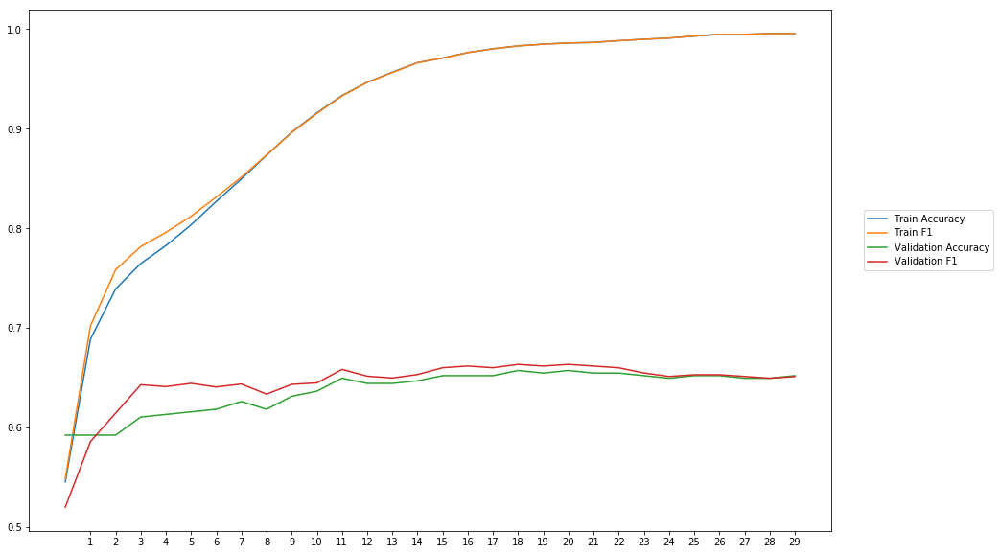

Average Accuracy: 63.73%
Average Precision: 63.10%
Average Recall: 65.97%
Average F1: 64.40%

-----Fold 2--------


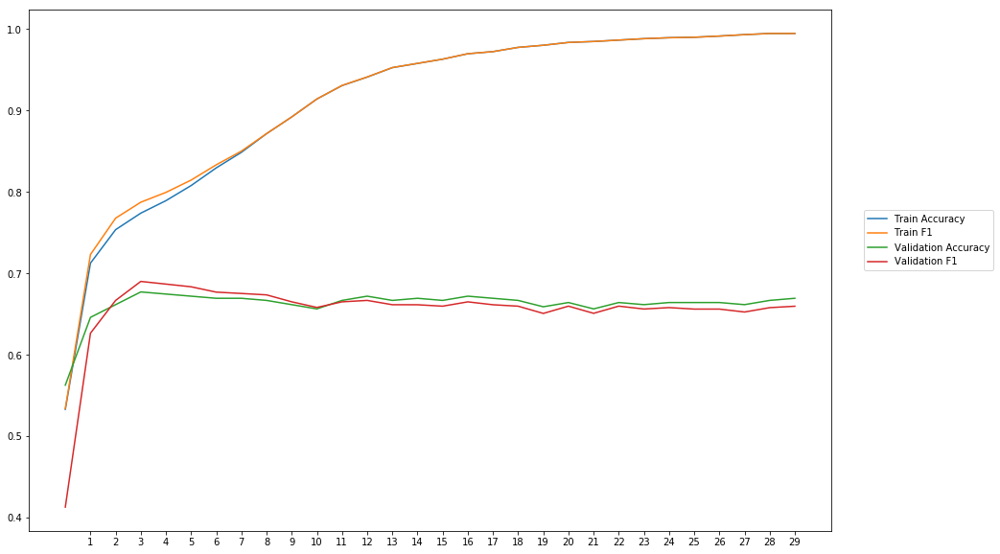

Average Accuracy: 66.20%
Average Precision: 66.31%
Average Recall: 64.97%
Average F1: 65.43%

-----Fold 3--------


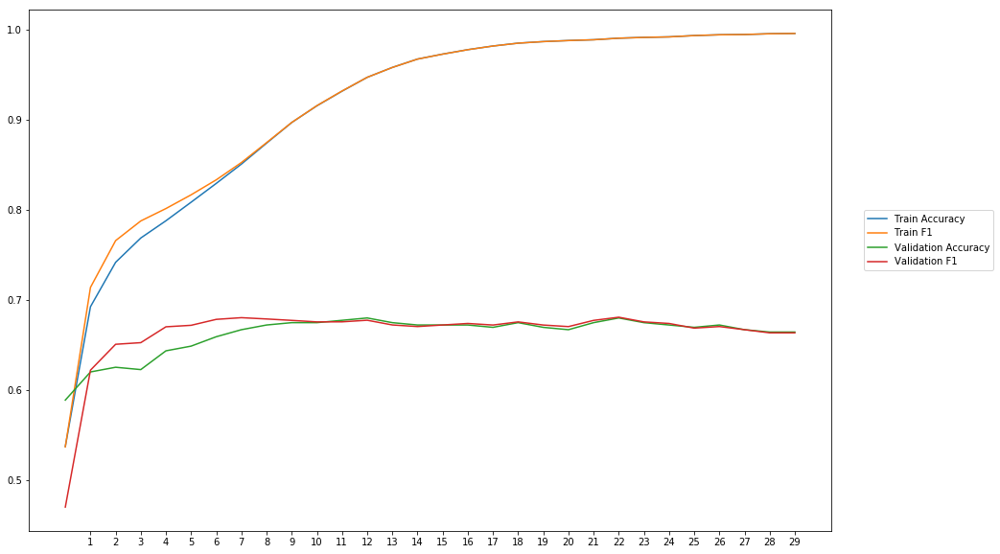

Average Accuracy: 66.19%
Average Precision: 65.69%
Average Recall: 67.33%
Average F1: 66.31%

-----Fold 4--------


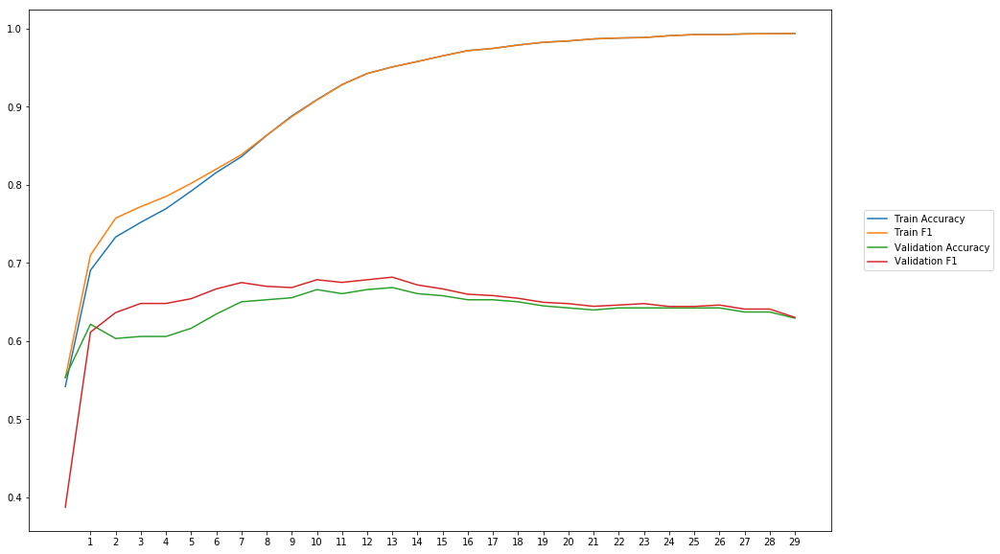

Average Accuracy: 63.92%
Average Precision: 63.13%
Average Recall: 66.74%
Average F1: 64.57%

-----Fold 5--------


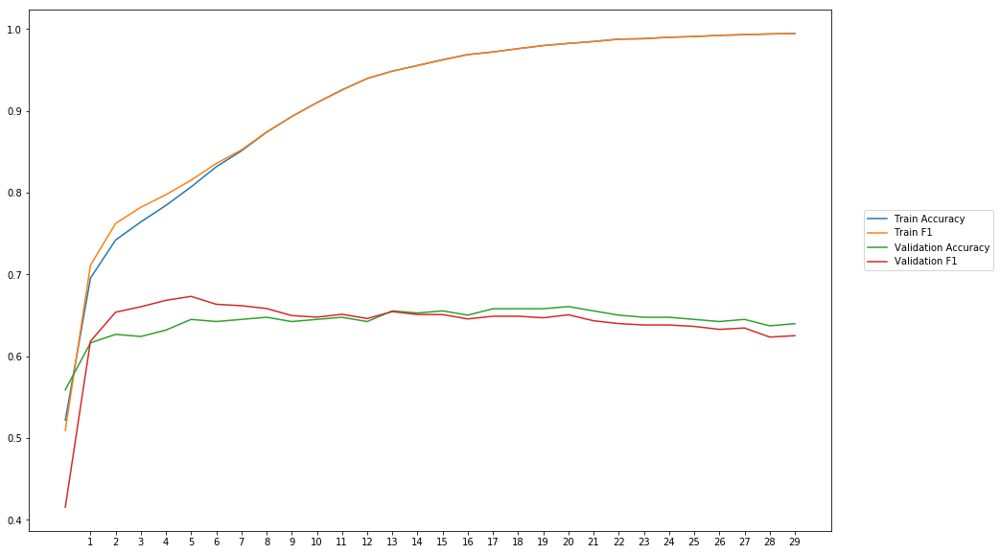

Average Accuracy: 64.24%
Average Precision: 64.24%
Average Recall: 64.14%
Average F1: 63.91%

-----Fold 6--------


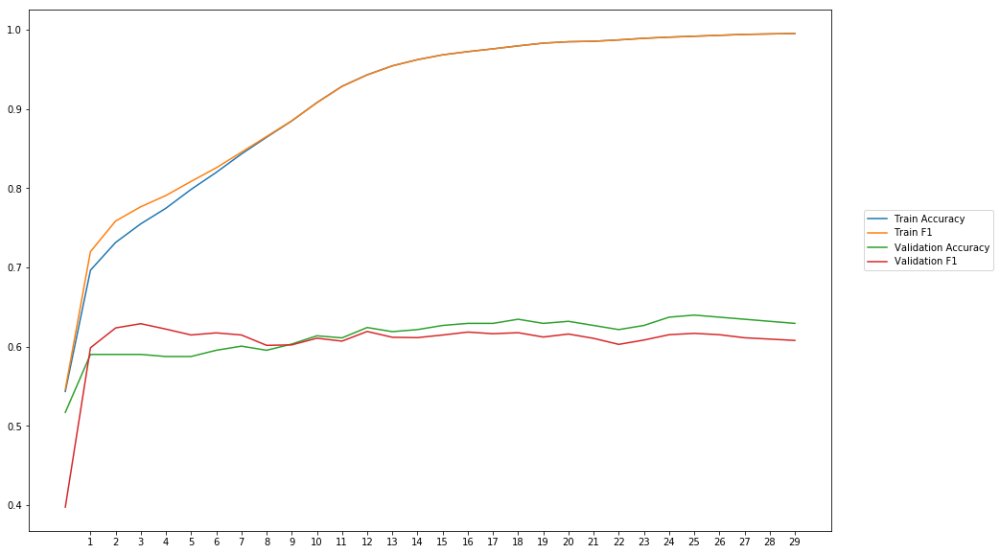

Average Accuracy: 61.37%
Average Precision: 61.73%
Average Recall: 59.86%
Average F1: 60.57%

-----Fold 7--------


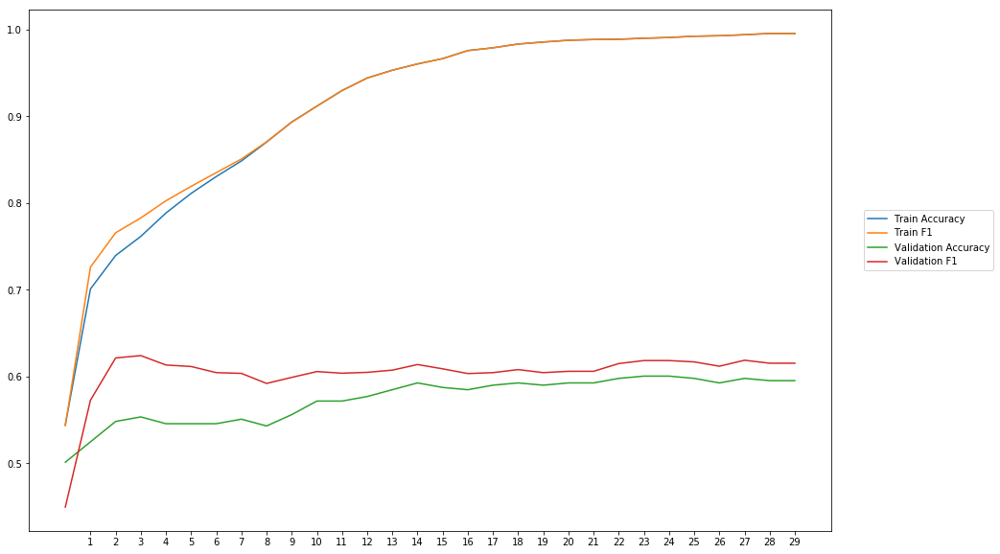

Average Accuracy: 57.41%
Average Precision: 56.41%
Average Recall: 65.18%
Average F1: 60.33%

-----Fold 8--------


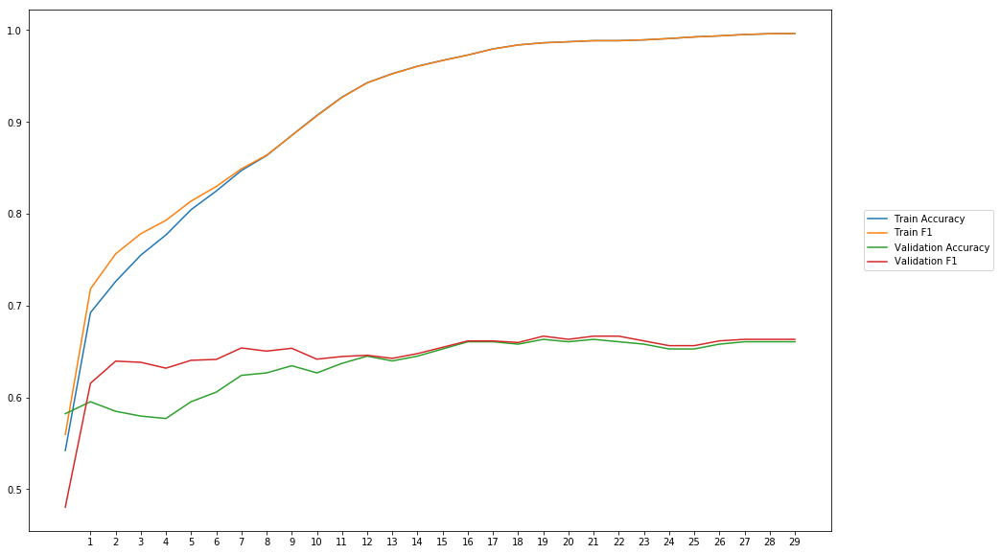

Average Accuracy: 63.60%
Average Precision: 62.92%
Average Recall: 66.98%
Average F1: 64.64%

-----Fold 9--------


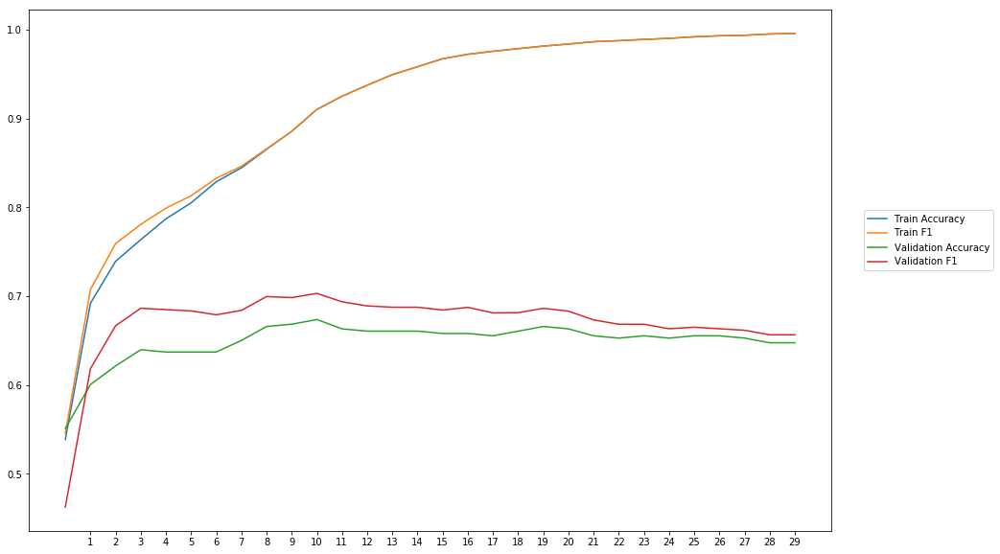

Average Accuracy: 64.87%
Average Precision: 62.87%
Average Recall: 72.16%
Average F1: 67.01%

-----Fold 10--------


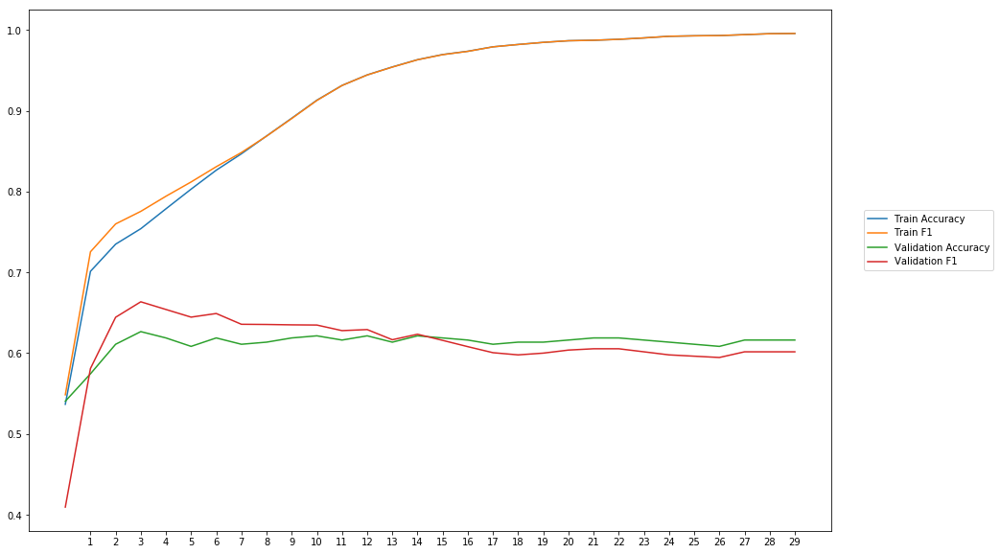

Average Accuracy: 61.20%
Average Precision: 61.02%
Average Recall: 61.62%
Average F1: 61.05%

-------Overallresults-------


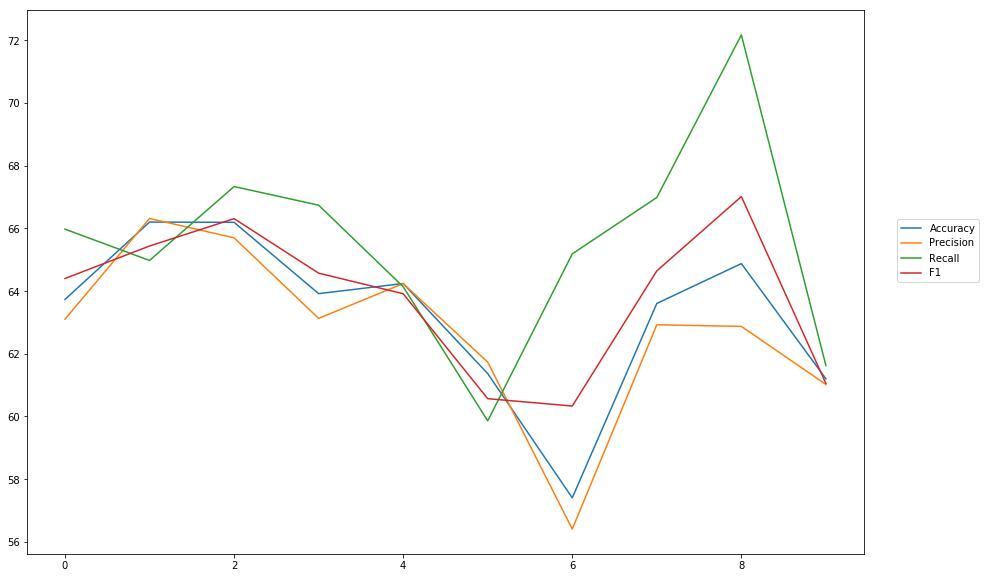

Accuracy: Mean = 63.27% (+/- 2.52%), Max = 66.20%, Min =  57.41%
Precision: Mean = 62.74% (+/- 2.61%), Max = 66.31%, Min =  56.41%
Recall: Mean = 65.50% (+/- 3.17%), Max = 72.16%, Min =  59.86%
F1: Mean = 63.82% (+/- 2.26%), Max = 67.01%, Min =  60.33%


In [48]:
cross_val(model_9, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'fasttext_twitter')

### with subword information

In [67]:
word_vectors_fasttext_wiki_sub = vec_embeddings(path+'wiki-news-300d-1M-subword.vec')
EMBDEEING_DIM = 300
embedding_matrix_fasttext_wiki_sub = create_eb_matrix(word_vectors_fasttext_wiki_sub,EMBEDDING_DIM)

C:\Users\twitter\Anaconda3\lib\site-packages\ipykernel_launcher.py:27: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).


In [68]:
wv_layer_13 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_fasttext_wiki_sub],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_13 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_13 = wv_layer_13(comment_input_13)

#First Dense Layer
x_13 = Dense(600, activation='relu')(embedded_sequences_13)

x_13 = Flatten()(x_13)

#Output (Dense) Layer
preds_13 = Dense(2, activation='softmax')(x_13)

# build the model
model_13 = Model(inputs=[comment_input_13], outputs=preds_13)


-----Fold 1--------


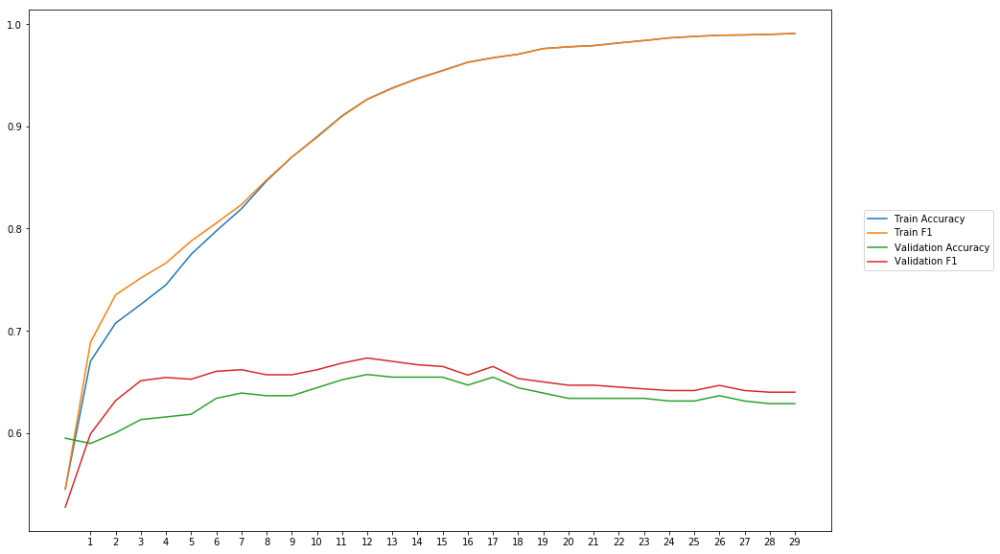

Average Accuracy: 63.33%
Average Precision: 62.22%
Average Recall: 67.64%
Average F1: 64.71%

-----Fold 2--------


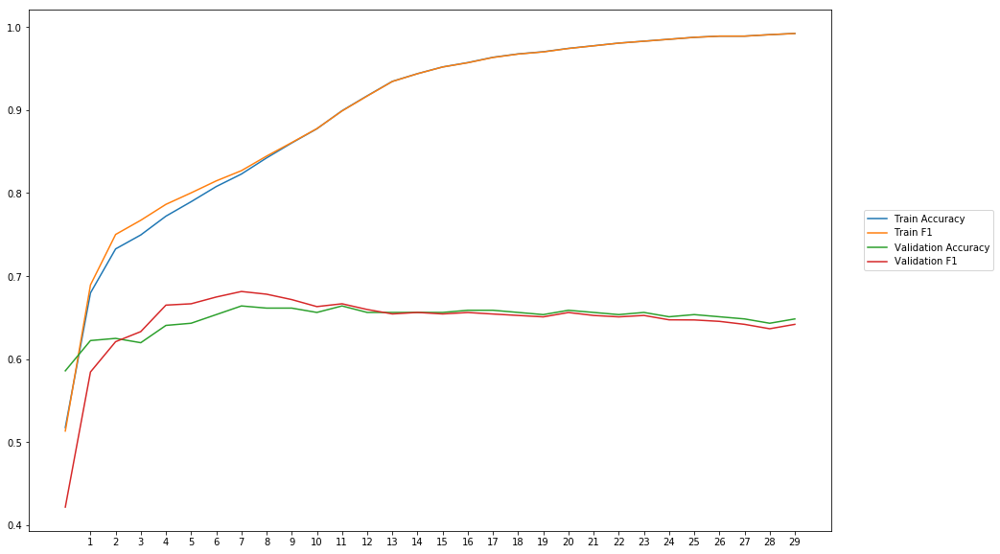

Average Accuracy: 64.90%
Average Precision: 64.84%
Average Recall: 64.75%
Average F1: 64.47%

-----Fold 3--------


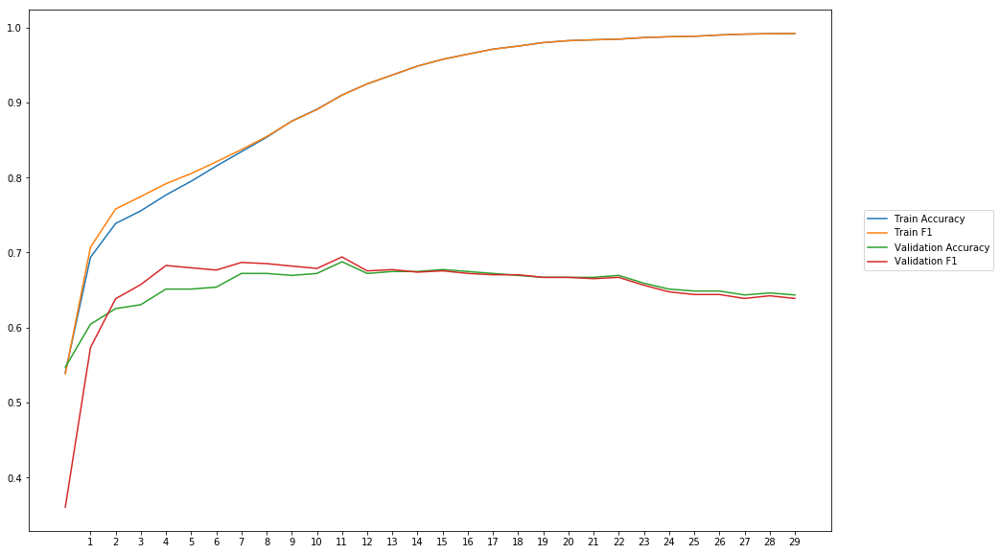

Average Accuracy: 65.52%
Average Precision: 65.06%
Average Recall: 66.14%
Average F1: 65.27%

-----Fold 4--------


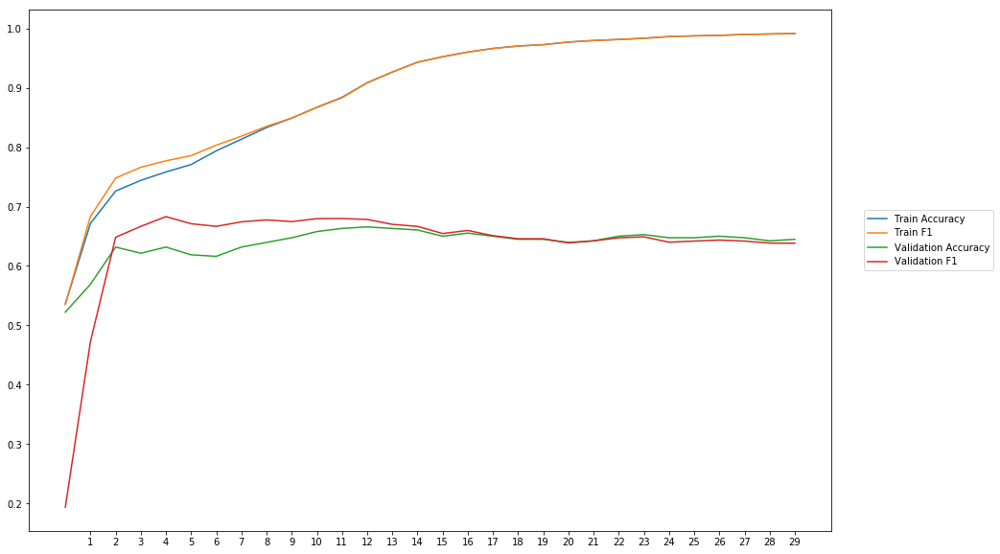

Average Accuracy: 63.84%
Average Precision: 63.34%
Average Recall: 65.71%
Average F1: 63.61%

-----Fold 5--------


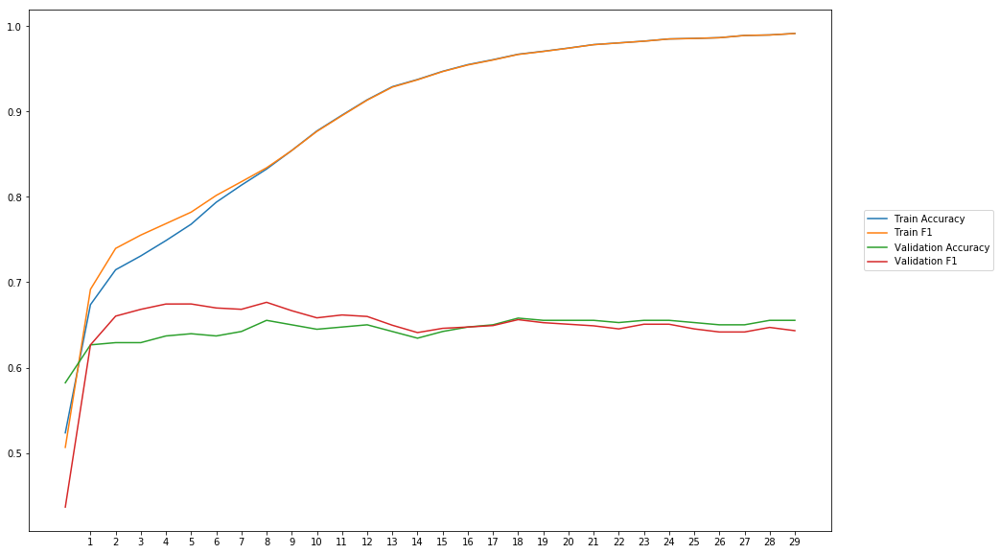

Average Accuracy: 64.46%
Average Precision: 64.12%
Average Recall: 65.99%
Average F1: 64.70%

-----Fold 6--------


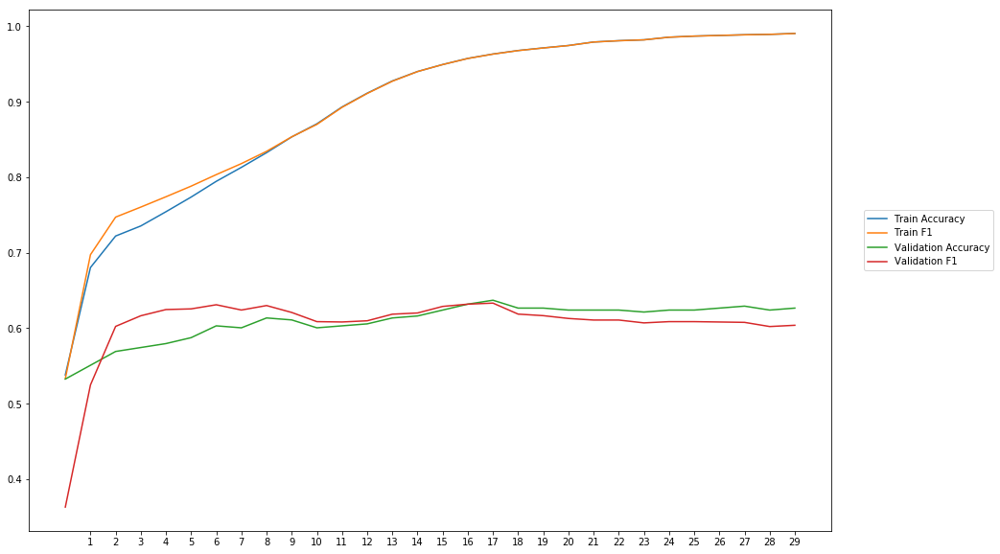

Average Accuracy: 60.85%
Average Precision: 60.91%
Average Recall: 60.68%
Average F1: 60.46%

-----Fold 7--------


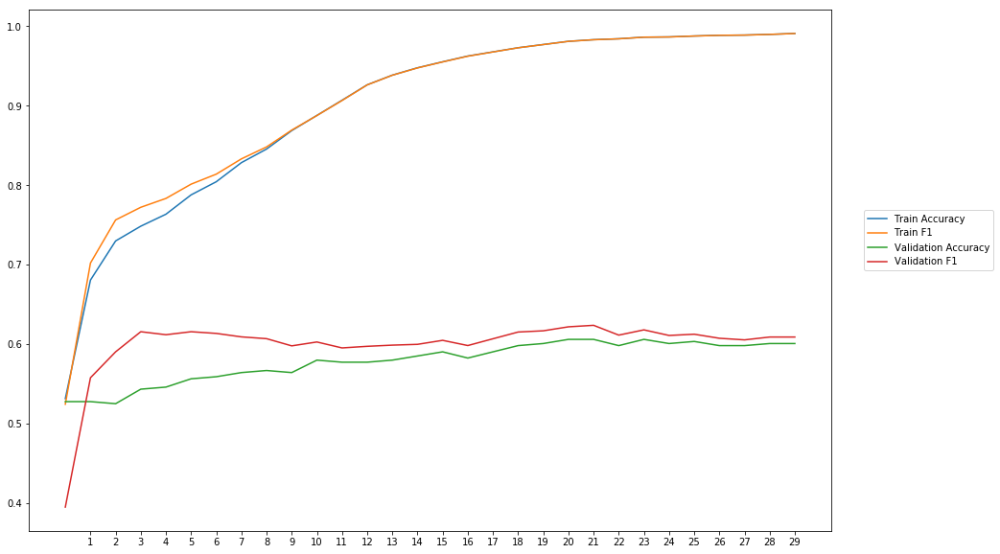

Average Accuracy: 57.84%
Average Precision: 57.06%
Average Recall: 63.63%
Average F1: 59.90%

-----Fold 8--------


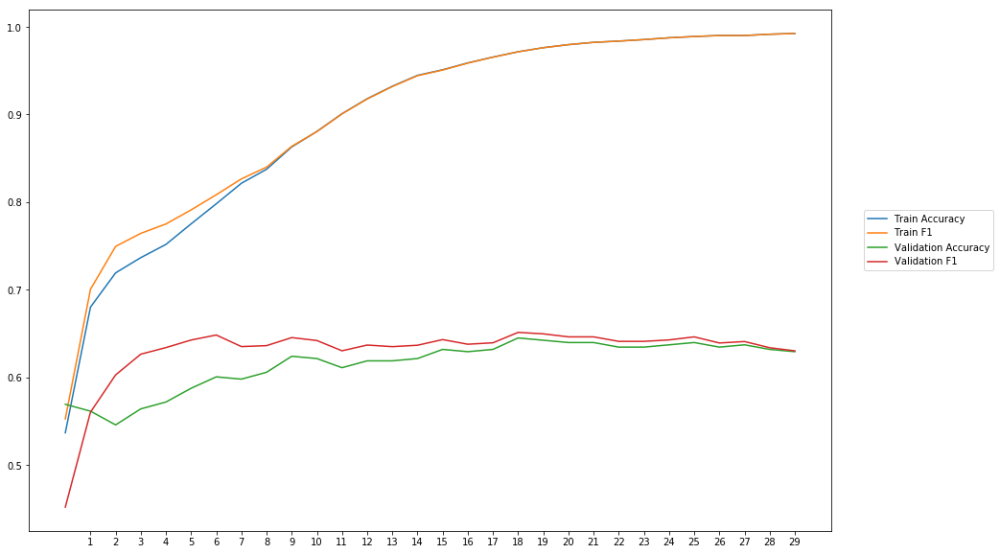

Average Accuracy: 61.52%
Average Precision: 60.71%
Average Recall: 66.02%
Average F1: 62.97%

-----Fold 9--------


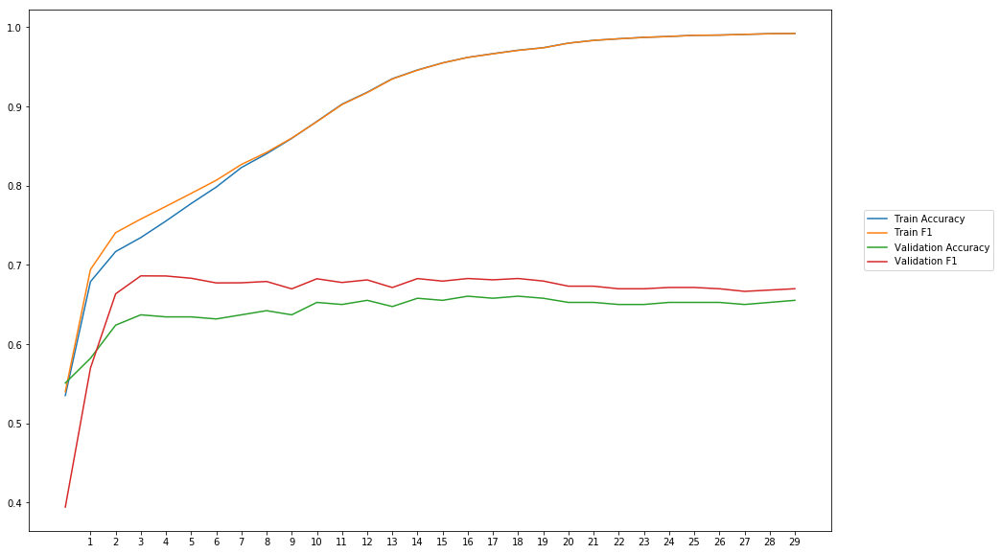

Average Accuracy: 64.30%
Average Precision: 62.40%
Average Recall: 71.52%
Average F1: 66.31%

-----Fold 10--------


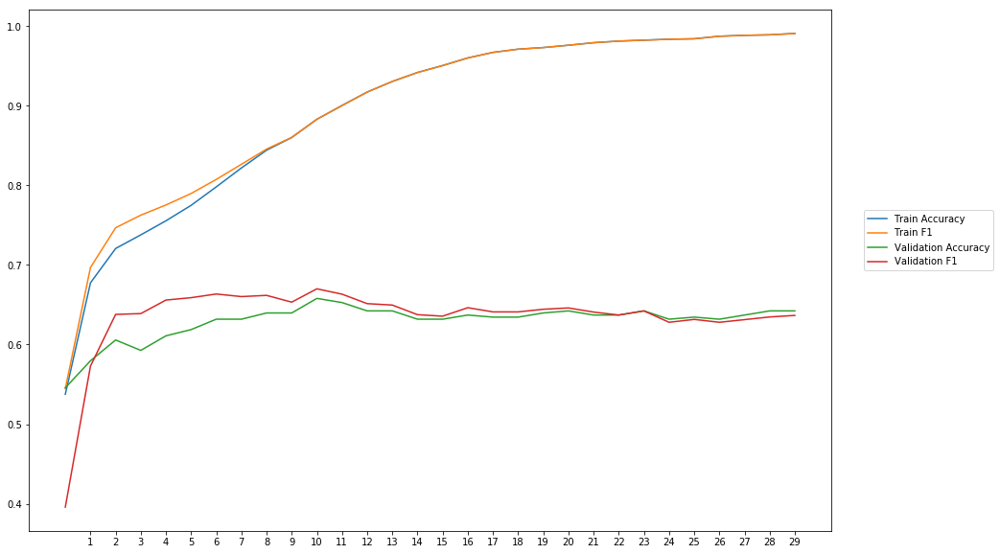

Average Accuracy: 62.93%
Average Precision: 62.30%
Average Recall: 65.24%
Average F1: 63.45%

-------Overallresults-------


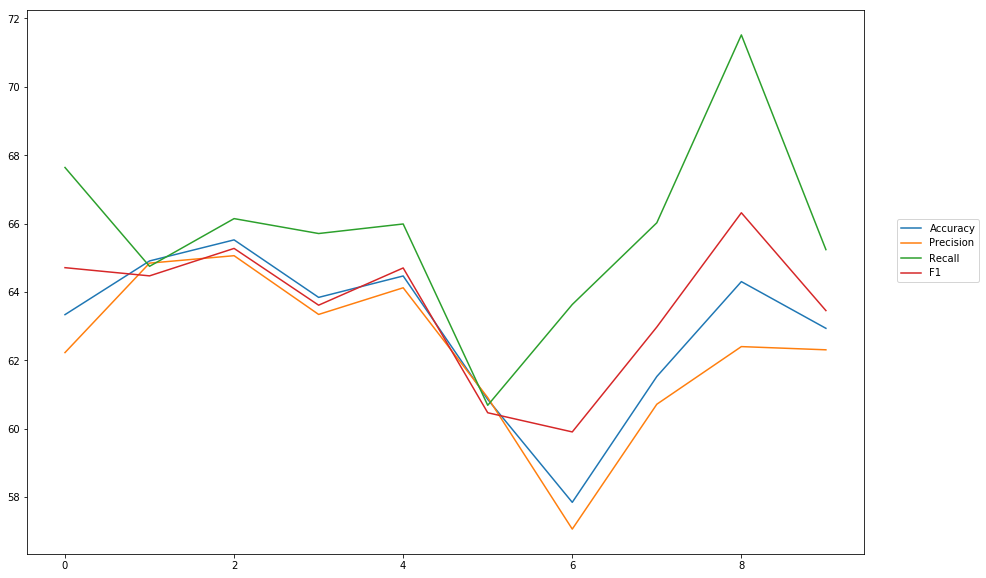

Accuracy: Mean = 62.95% (+/- 2.19%), Max = 65.52%, Min =  57.84%
Precision: Mean = 62.30% (+/- 2.25%), Max = 65.06%, Min =  57.06%
Recall: Mean = 65.73% (+/- 2.62%), Max = 71.52%, Min =  60.68%
F1: Mean = 63.59% (+/- 1.93%), Max = 66.31%, Min =  59.90%


In [69]:
cross_val(model_13, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'fasttext_wiki_subwords')

## Common Crawler

In [20]:
word_vectors_fasttesxt_cc = vec_embeddings(path + 'crawl-300d-2M.vec')
EMBEDDING_DIM = 300
embedding_matrix_fasttext_cc = create_eb_matrix(word_vectors_fasttesxt_cc,EMBEDDING_DIM)

C:\Users\twitter\Anaconda3\lib\site-packages\ipykernel_launcher.py:27: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).


In [21]:
wv_layer_10 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_fasttext_cc],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_10 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_10 = wv_layer_10(comment_input_10)

#First Dense Layer
x_10 = Dense(600, activation='relu')(embedded_sequences_10)

x_10 = Flatten()(x_10)

#Output (Dense) Layer
preds_10 = Dense(2, activation='softmax')(x_10)

# build the model
model_10 = Model(inputs=[comment_input_10], outputs=preds_10)


-----Fold 1--------


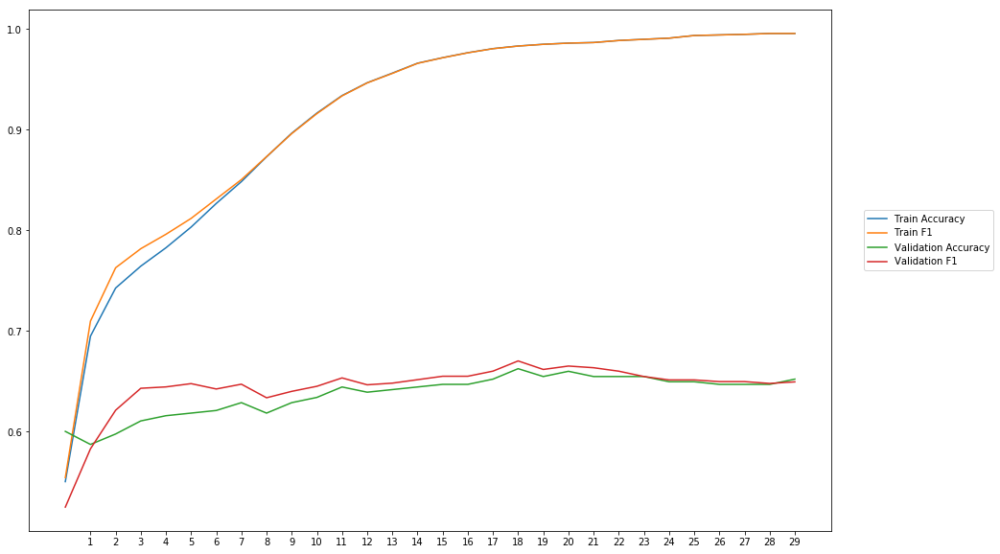

Average Accuracy: 63.68%
Average Precision: 63.05%
Average Recall: 65.99%
Average F1: 64.37%

-----Fold 2--------


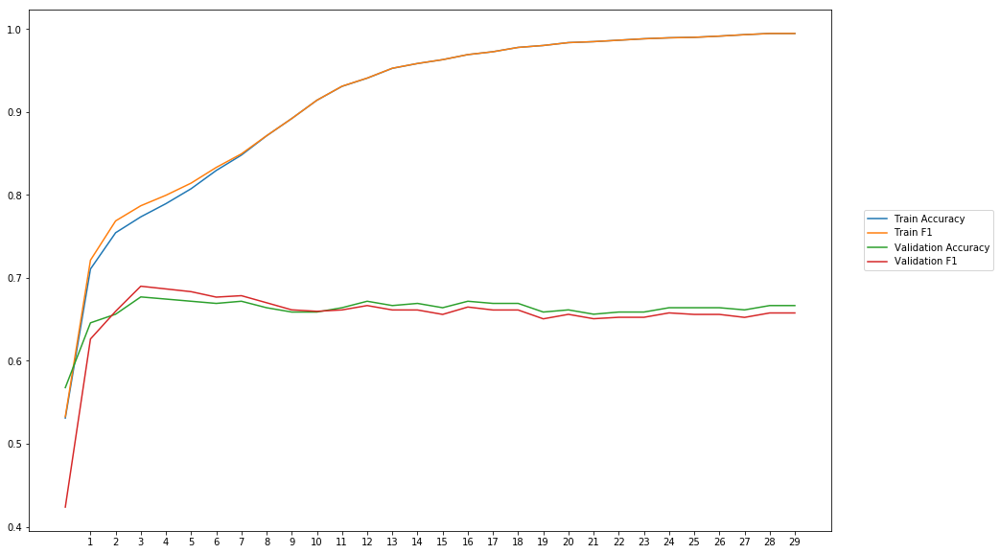

Average Accuracy: 66.15%
Average Precision: 66.30%
Average Recall: 64.85%
Average F1: 65.37%

-----Fold 3--------


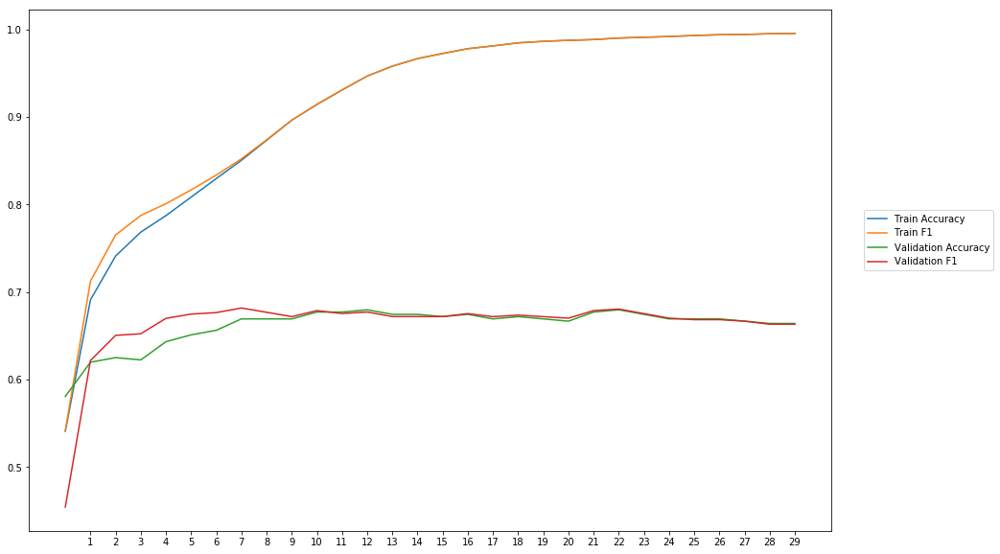

Average Accuracy: 66.15%
Average Precision: 65.65%
Average Recall: 67.28%
Average F1: 66.25%

-----Fold 4--------


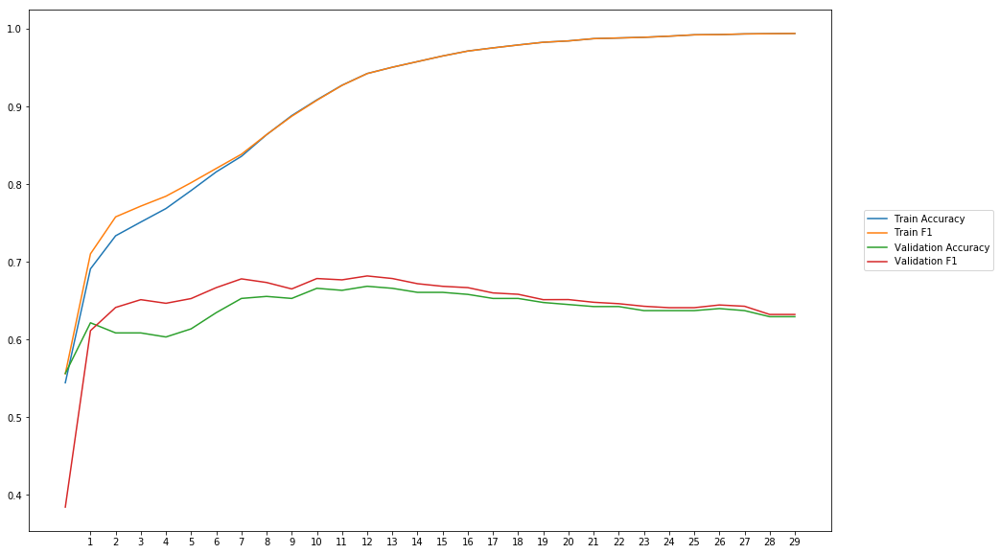

Average Accuracy: 63.93%
Average Precision: 63.12%
Average Recall: 66.86%
Average F1: 64.60%

-----Fold 5--------


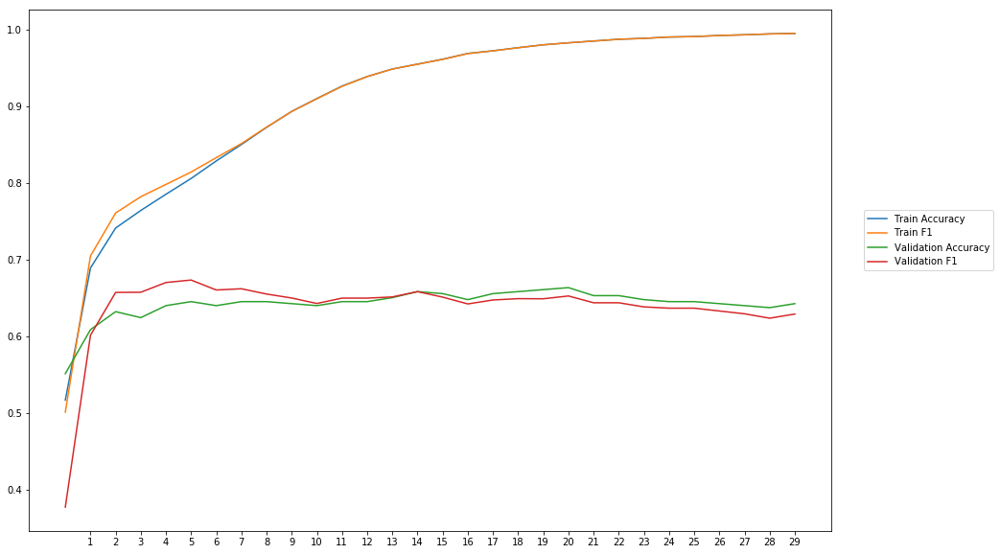

Average Accuracy: 64.18%
Average Precision: 64.21%
Average Recall: 63.84%
Average F1: 63.71%

-----Fold 6--------


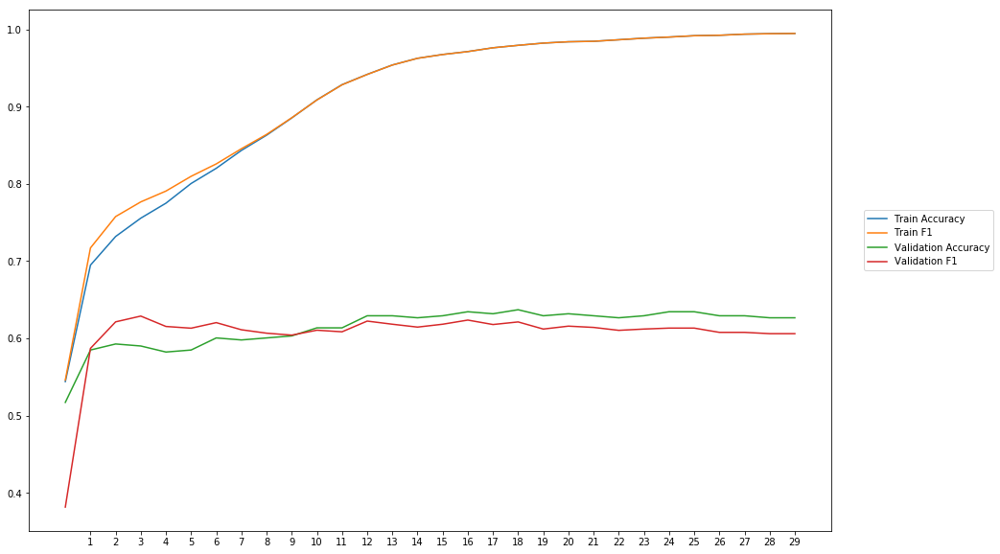

Average Accuracy: 61.42%
Average Precision: 61.79%
Average Recall: 59.77%
Average F1: 60.54%

-----Fold 7--------


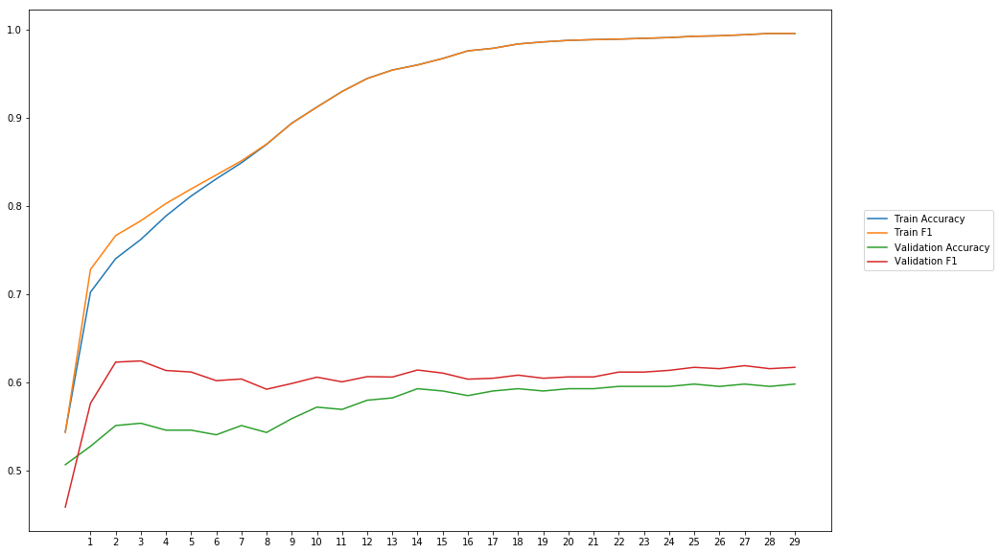

Average Accuracy: 57.41%
Average Precision: 56.42%
Average Recall: 65.15%
Average F1: 60.33%

-----Fold 8--------


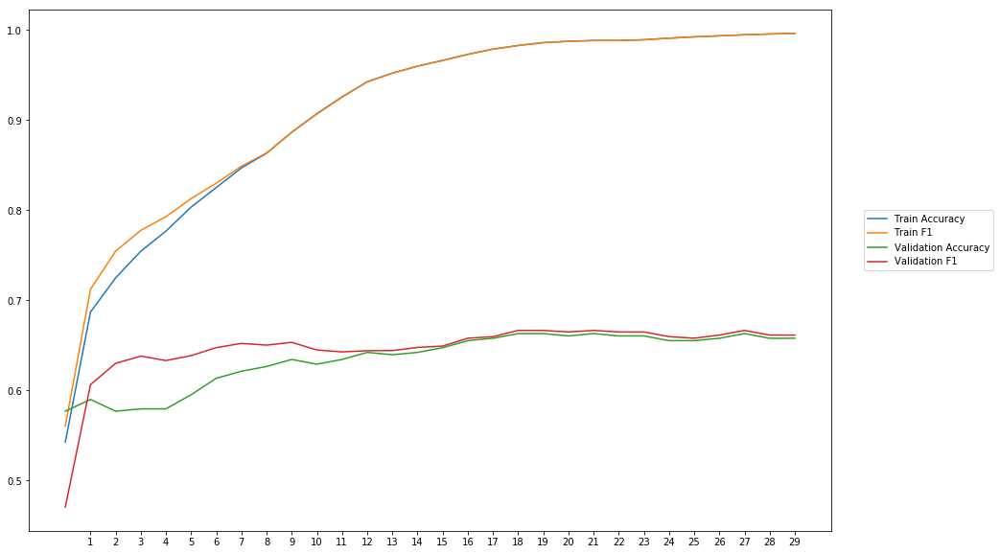

Average Accuracy: 63.54%
Average Precision: 62.83%
Average Recall: 66.96%
Average F1: 64.59%

-----Fold 9--------


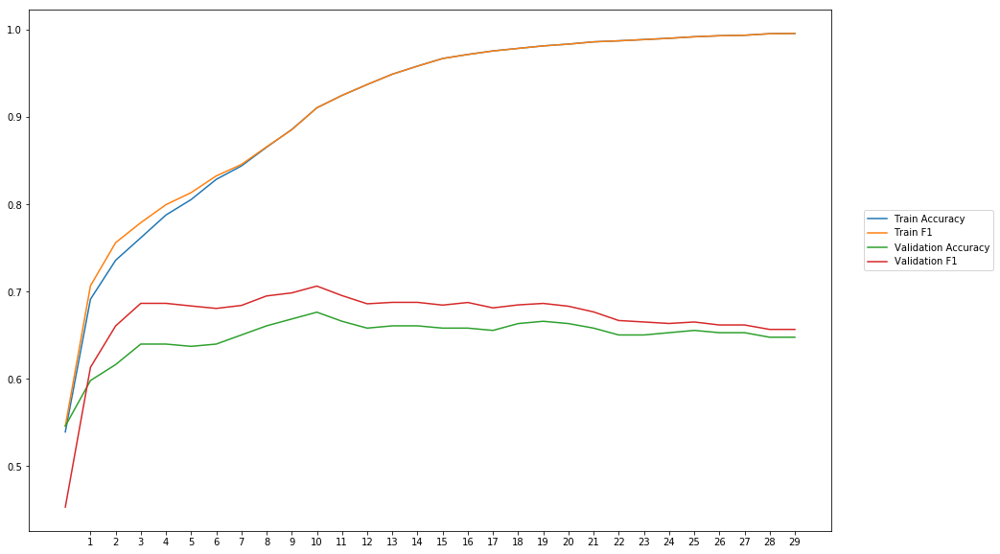

Average Accuracy: 64.82%
Average Precision: 62.82%
Average Recall: 72.08%
Average F1: 66.94%

-----Fold 10--------


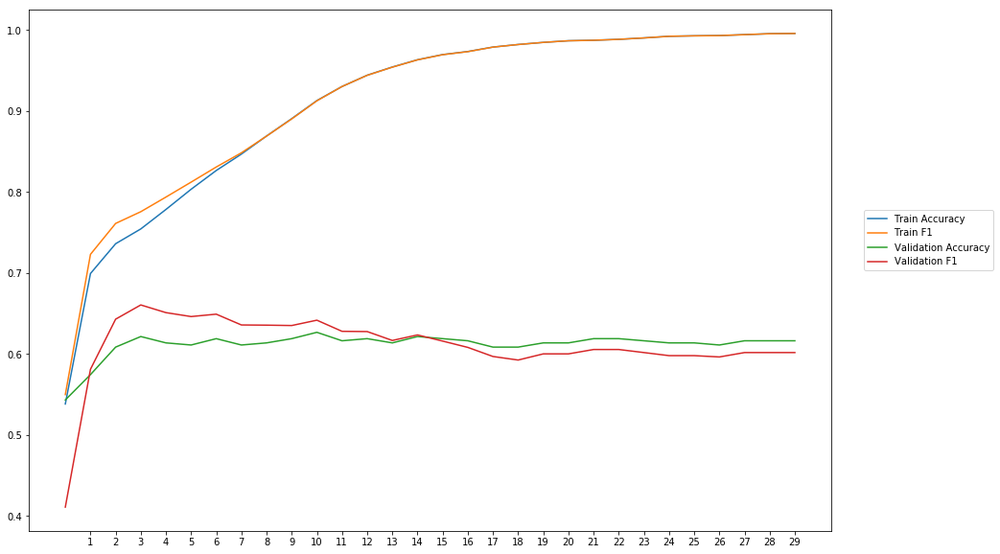

Average Accuracy: 61.17%
Average Precision: 61.00%
Average Recall: 61.61%
Average F1: 61.02%

-------Overallresults-------


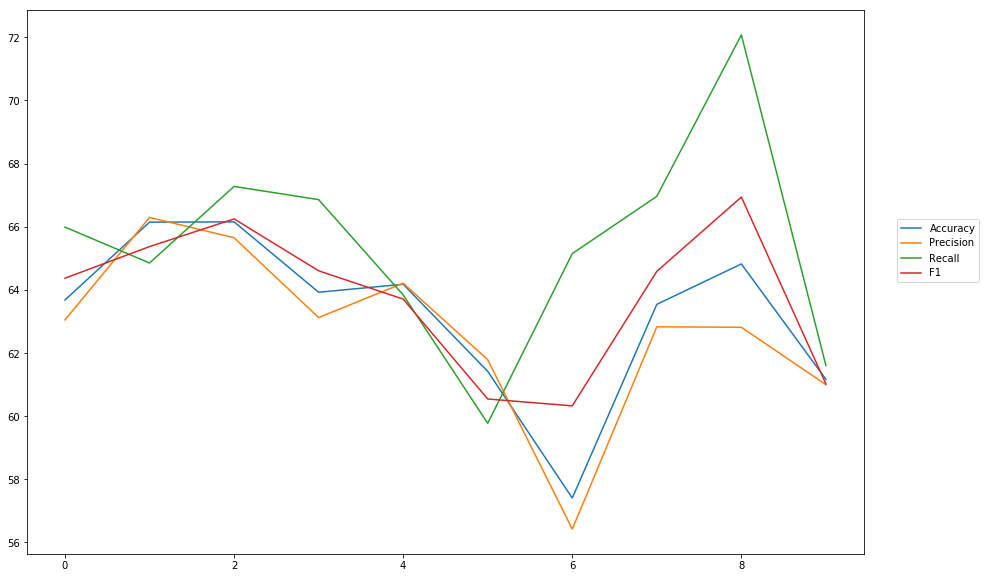

Accuracy: Mean = 63.24% (+/- 2.50%), Max = 66.15%, Min =  57.41%
Precision: Mean = 62.72% (+/- 2.60%), Max = 66.30%, Min =  56.42%
Recall: Mean = 65.44% (+/- 3.19%), Max = 72.08%, Min =  59.77%
F1: Mean = 63.77% (+/- 2.24%), Max = 66.94%, Min =  60.33%


In [53]:
cross_val(model_10, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'fasttext_commoncrawler')

### with subword information

In [70]:
word_vectors_fasttext_cc_sub = vec_embeddings(path+'crawl-300d-2M-subword.vec')
EMBDEEING_DIM = 300
embedding_matrix_fasttext_cc_sub = create_eb_matrix(word_vectors_fasttext_cnn_sub,EMBEDDING_DIM)

C:\Users\twitter\Anaconda3\lib\site-packages\ipykernel_launcher.py:27: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).


In [72]:
wv_layer_14 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_fasttext_cc_sub],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_14 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_14 = wv_layer_14(comment_input_14)

#First Dense Layer
x_14 = Dense(600, activation='relu')(embedded_sequences_14)

x_14 = Flatten()(x_14)

#Output (Dense) Layer
preds_14 = Dense(2, activation='softmax')(x_14)

# build the model
model_14 = Model(inputs=[comment_input_14], outputs=preds_14)


-----Fold 1--------


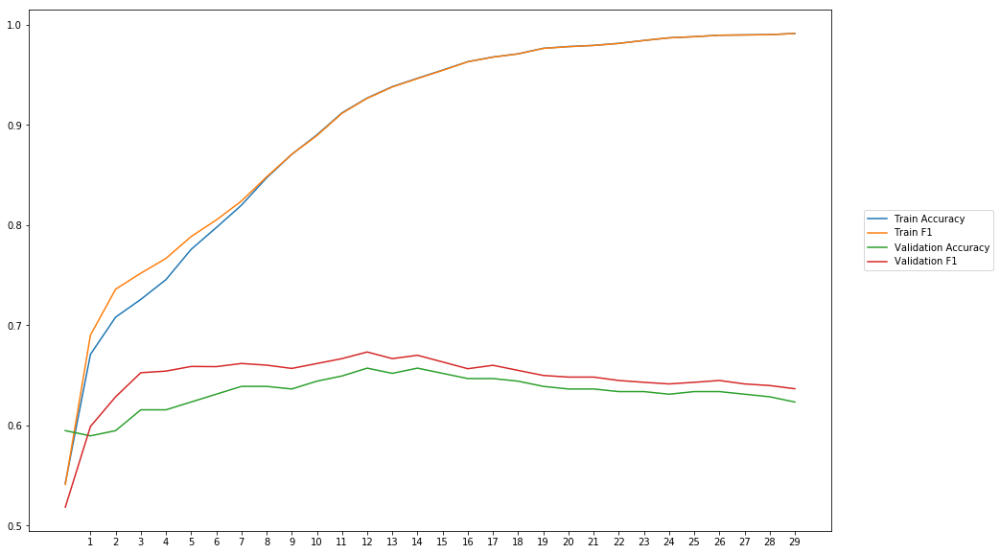

Average Accuracy: 63.30%
Average Precision: 62.19%
Average Recall: 67.66%
Average F1: 64.68%

-----Fold 2--------


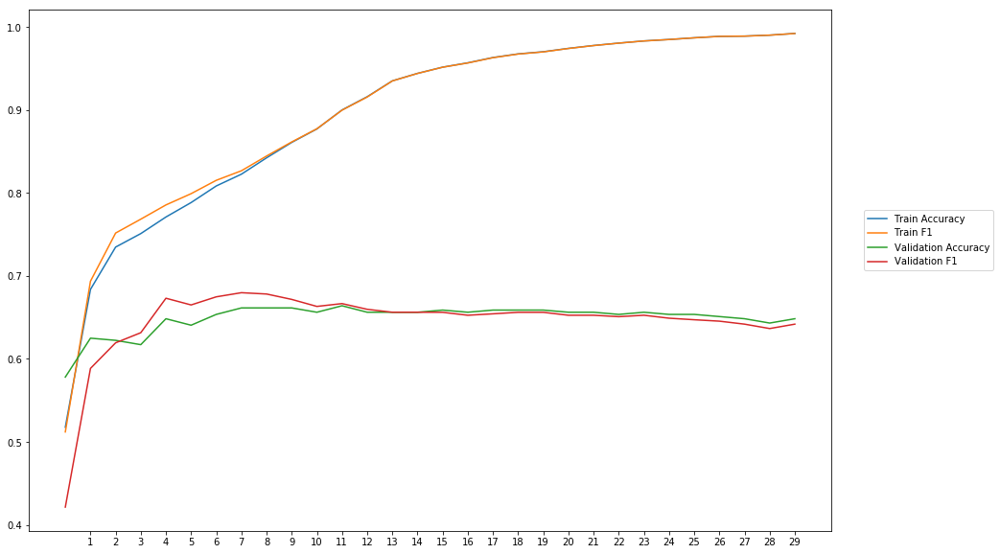

Average Accuracy: 64.90%
Average Precision: 64.77%
Average Recall: 64.83%
Average F1: 64.51%

-----Fold 3--------


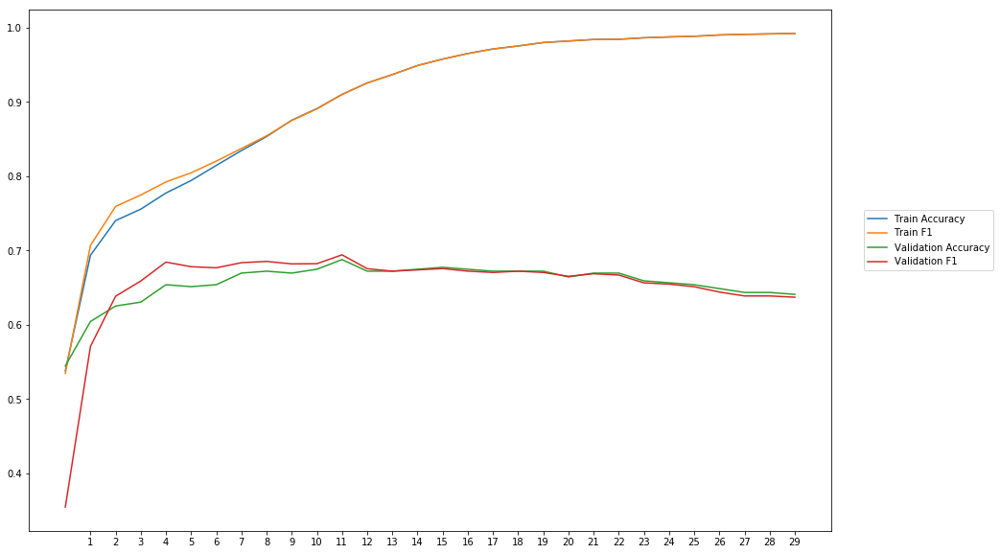

Average Accuracy: 65.56%
Average Precision: 65.09%
Average Recall: 66.14%
Average F1: 65.28%

-----Fold 4--------


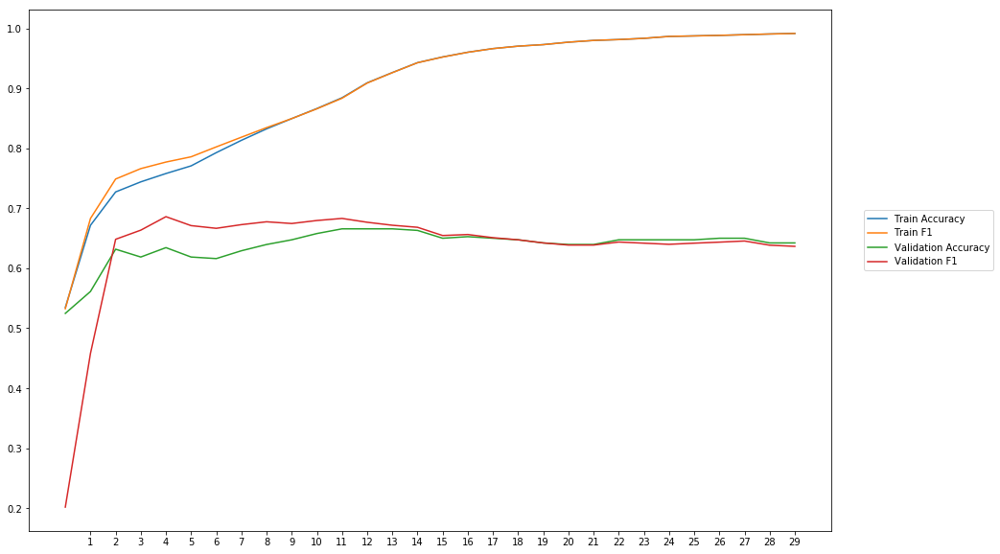

Average Accuracy: 63.79%
Average Precision: 63.33%
Average Recall: 65.58%
Average F1: 63.54%

-----Fold 5--------


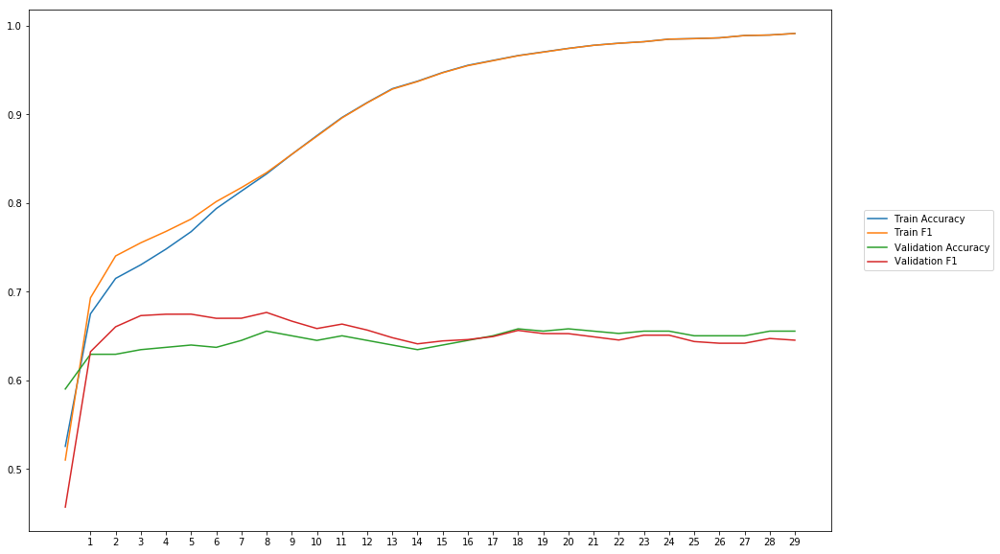

Average Accuracy: 64.49%
Average Precision: 64.12%
Average Recall: 66.13%
Average F1: 64.79%

-----Fold 6--------


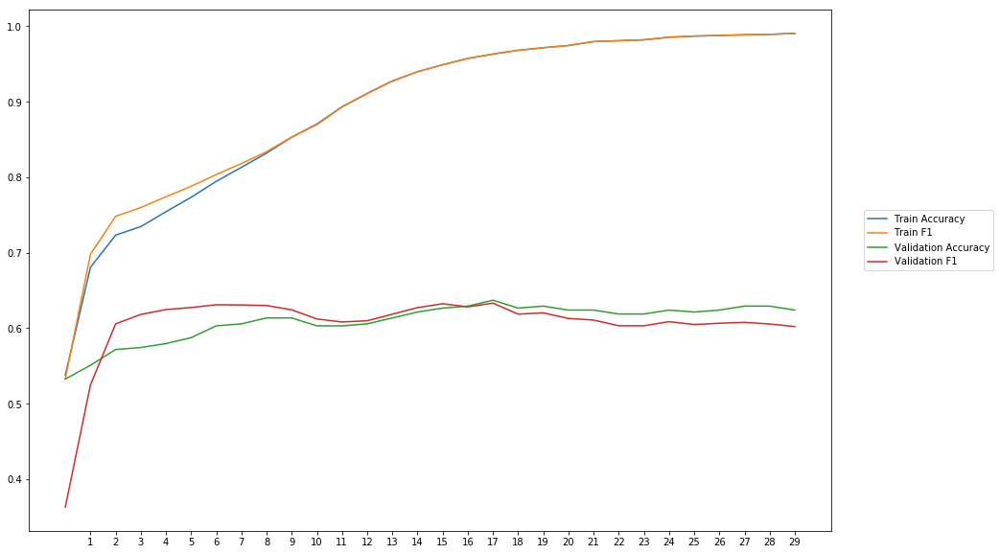

Average Accuracy: 60.89%
Average Precision: 60.93%
Average Recall: 60.79%
Average F1: 60.52%

-----Fold 7--------


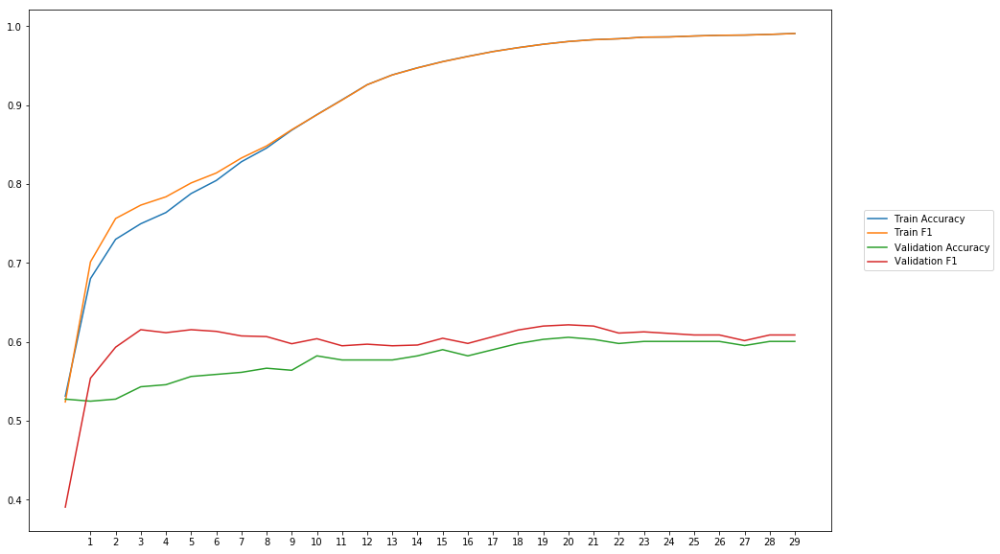

Average Accuracy: 57.80%
Average Precision: 57.03%
Average Recall: 63.53%
Average F1: 59.83%

-----Fold 8--------


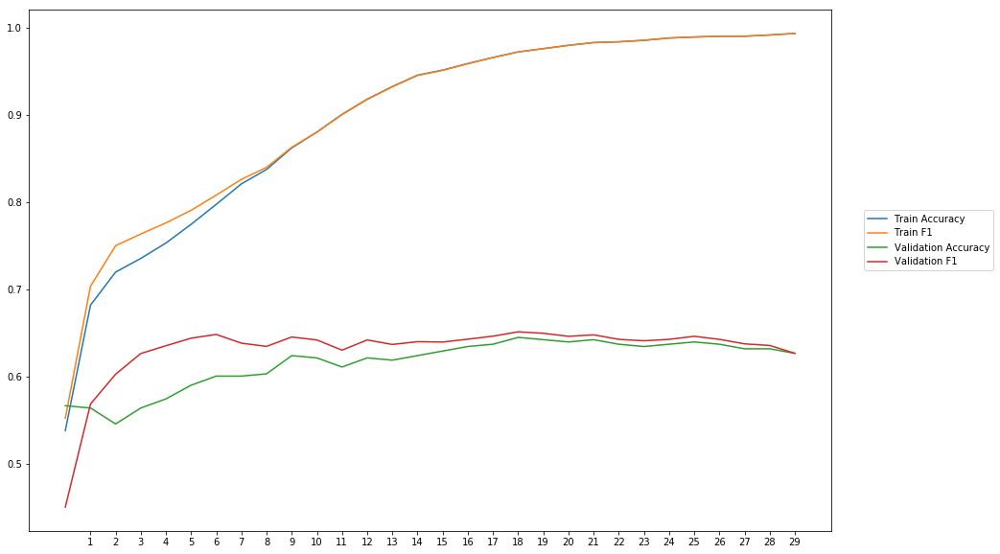

Average Accuracy: 61.58%
Average Precision: 60.73%
Average Recall: 66.21%
Average F1: 63.08%

-----Fold 9--------


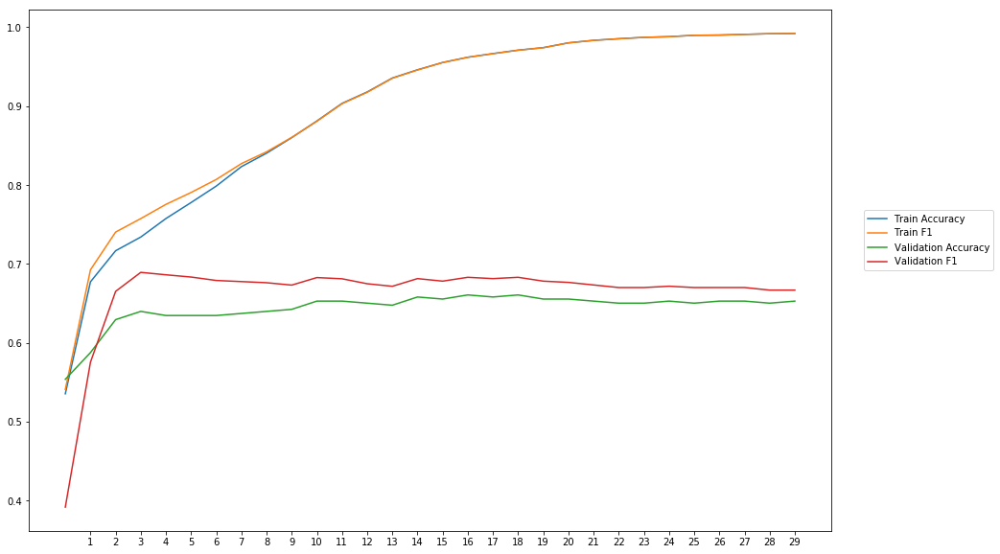

Average Accuracy: 64.34%
Average Precision: 62.47%
Average Recall: 71.47%
Average F1: 66.32%

-----Fold 10--------


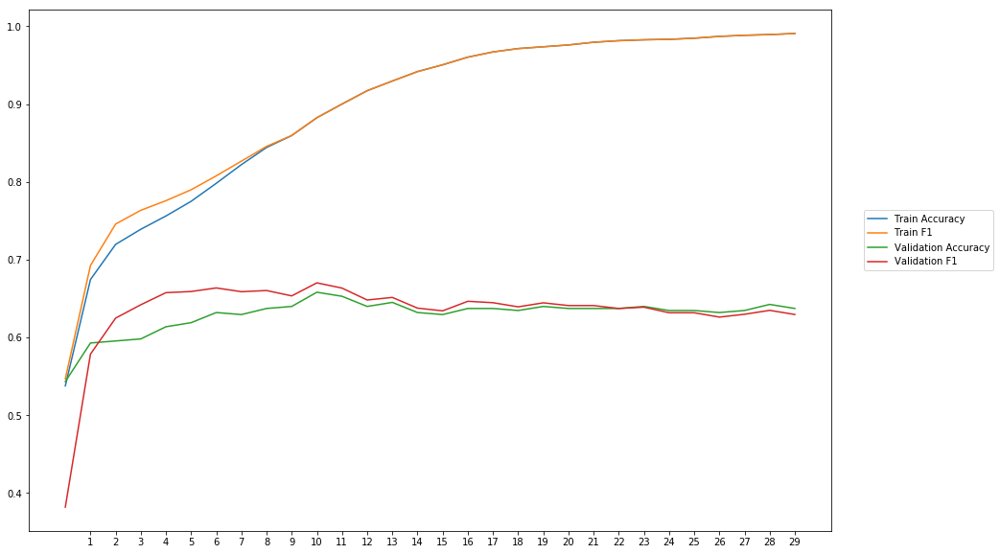

Average Accuracy: 62.90%
Average Precision: 62.31%
Average Recall: 65.01%
Average F1: 63.32%

-------Overallresults-------


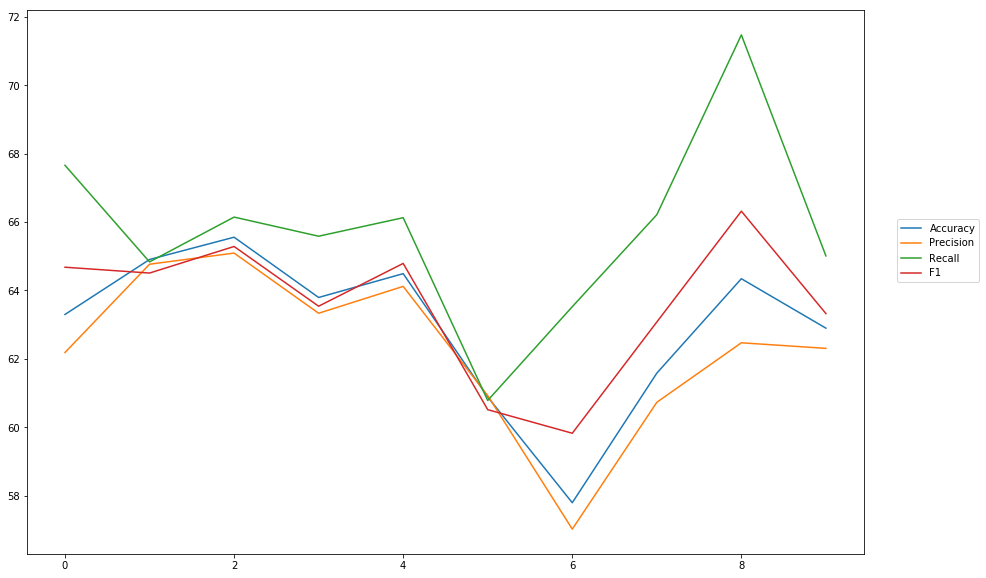

Accuracy: Mean = 62.96% (+/- 2.20%), Max = 65.56%, Min =  57.80%
Precision: Mean = 62.30% (+/- 2.25%), Max = 65.09%, Min =  57.03%
Recall: Mean = 65.73% (+/- 2.60%), Max = 71.47%, Min =  60.79%
F1: Mean = 63.59% (+/- 1.94%), Max = 66.32%, Min =  59.83%


In [73]:
cross_val(model_14, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'fasttext_commoncrawler_sub')

## LexVec

### Common Crawl

In [13]:
word_vectors_lexvec_cc = vec_embeddings(path+'lexvec.commoncrawl.300d.W.pos.neg3.vectors')
EMBEDDING_DIM = 300
embedding_matrix_lexvec_cc = create_eb_matrix(word_vectors_lexvec_cc,EMBEDDING_DIM)

C:\Users\Anja Tetzner\Anaconda3\lib\site-packages\ipykernel_launcher.py:27: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).


In [14]:
wv_layer_16 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_lexvec_cc],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_16 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_16 = wv_layer_16(comment_input_16)

#First Dense Layer
x_16 = Dense(600, activation='relu')(embedded_sequences_16)

x_16 = Flatten()(x_16)

#Output (Dense) Layer
preds_16 = Dense(2, activation='softmax')(x_16)

# build the model
model_16 = Model(inputs=[comment_input_16], outputs=preds_16)

Instructions for updating:
Use tf.cast instead.

-----Fold 1--------


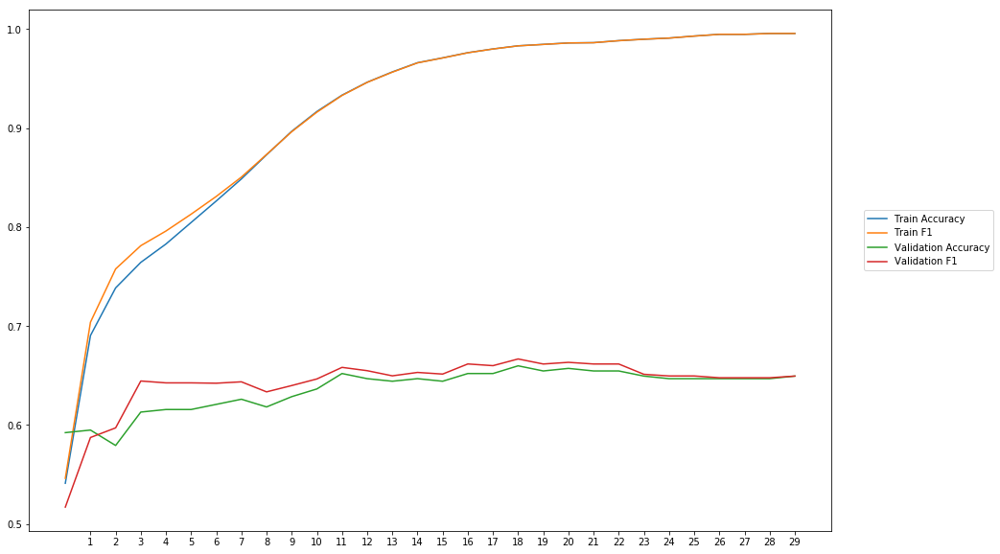

Average Accuracy: 63.64%
Average Precision: 63.02%
Average Recall: 65.80%
Average F1: 64.27%

-----Fold 2--------


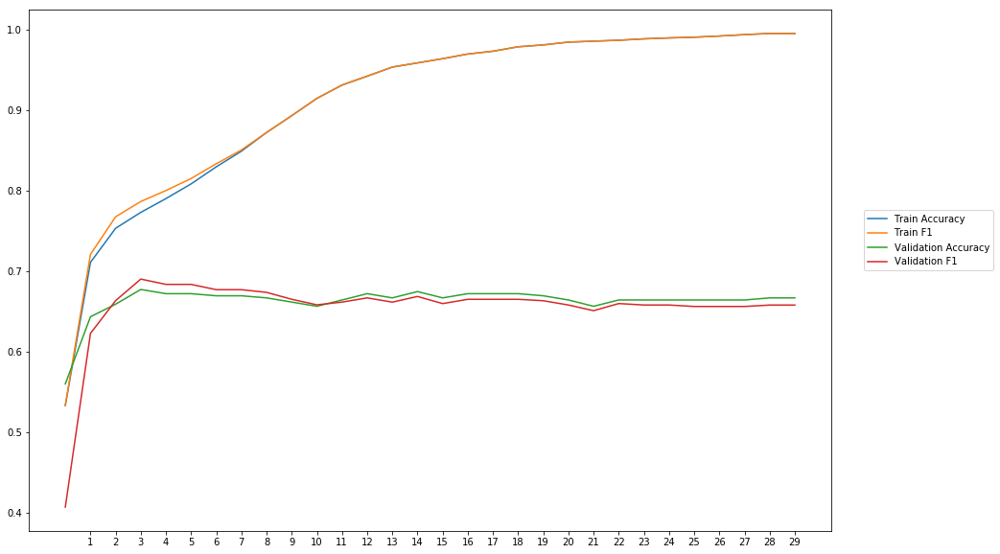

Average Accuracy: 66.24%
Average Precision: 66.35%
Average Recall: 65.03%
Average F1: 65.48%

-----Fold 3--------


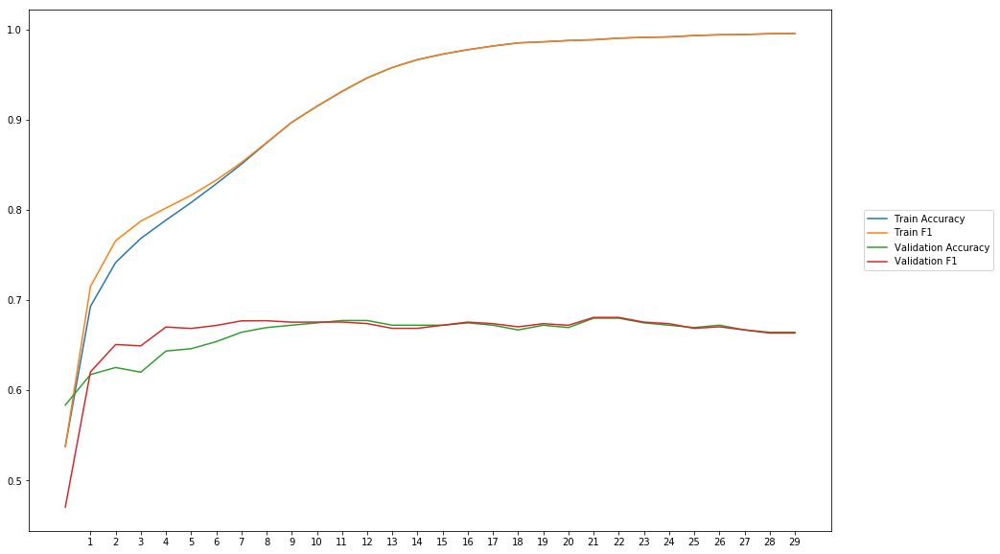

Average Accuracy: 66.11%
Average Precision: 65.61%
Average Recall: 67.21%
Average F1: 66.23%

-----Fold 4--------


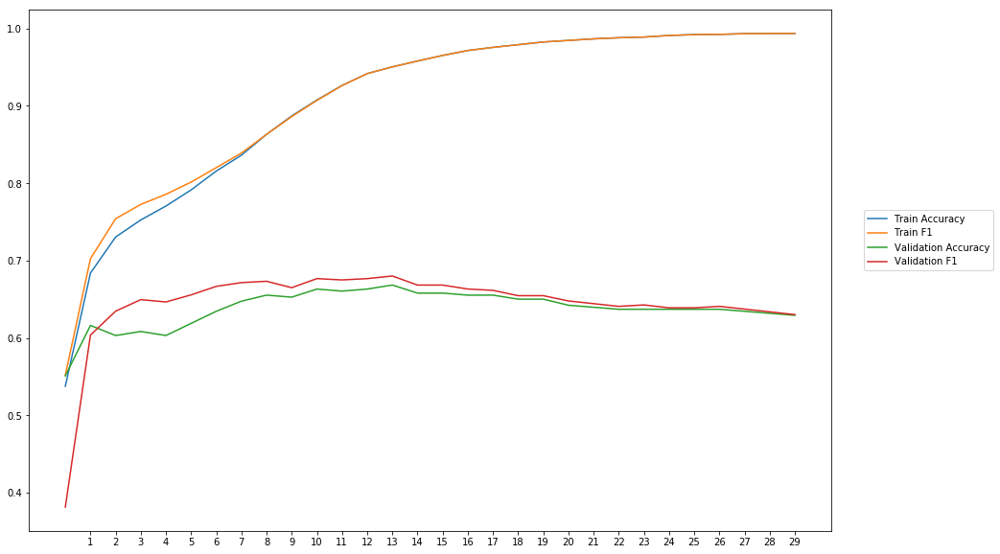

Average Accuracy: 63.79%
Average Precision: 63.00%
Average Recall: 66.54%
Average F1: 64.41%

-----Fold 5--------


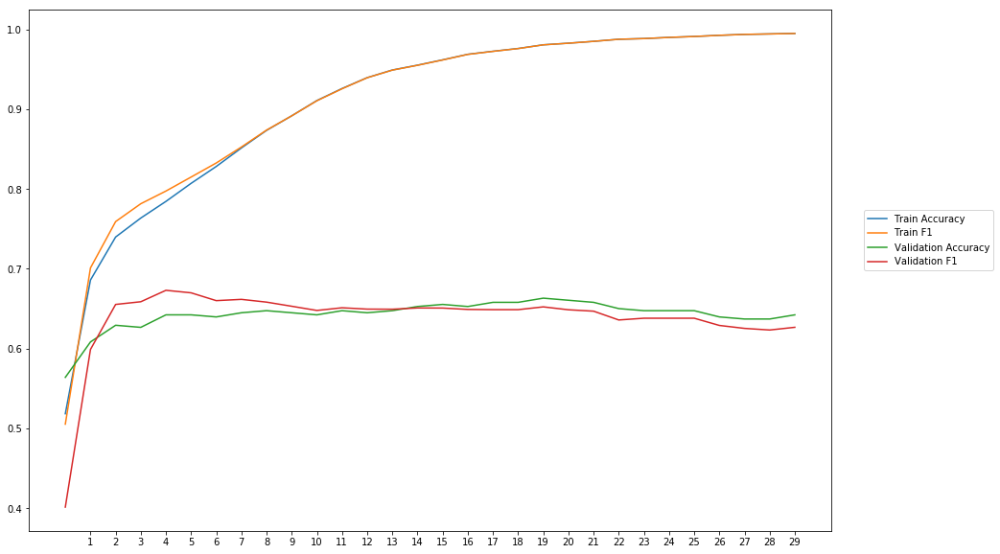

Average Accuracy: 64.26%
Average Precision: 64.37%
Average Recall: 63.86%
Average F1: 63.80%

-----Fold 6--------


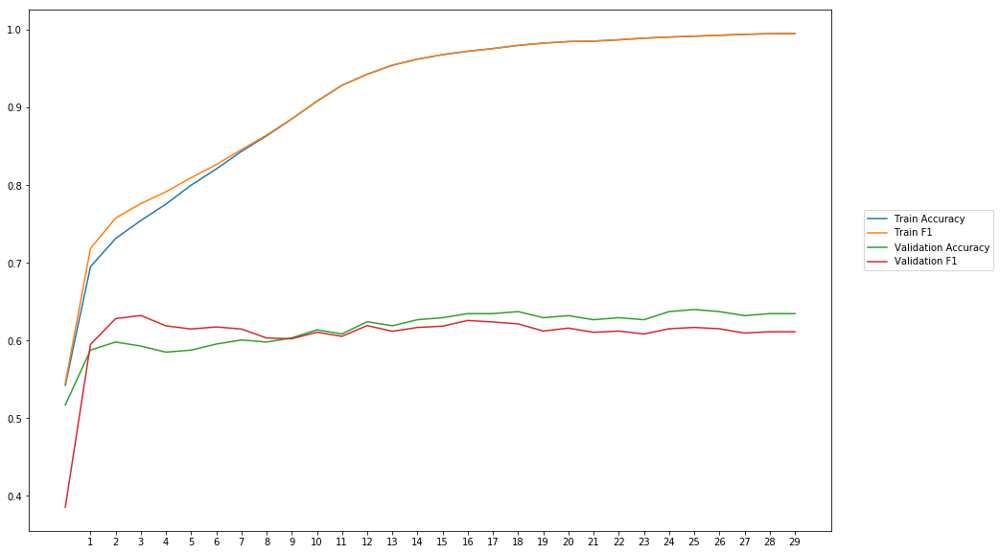

Average Accuracy: 61.50%
Average Precision: 61.86%
Average Recall: 59.95%
Average F1: 60.66%

-----Fold 7--------


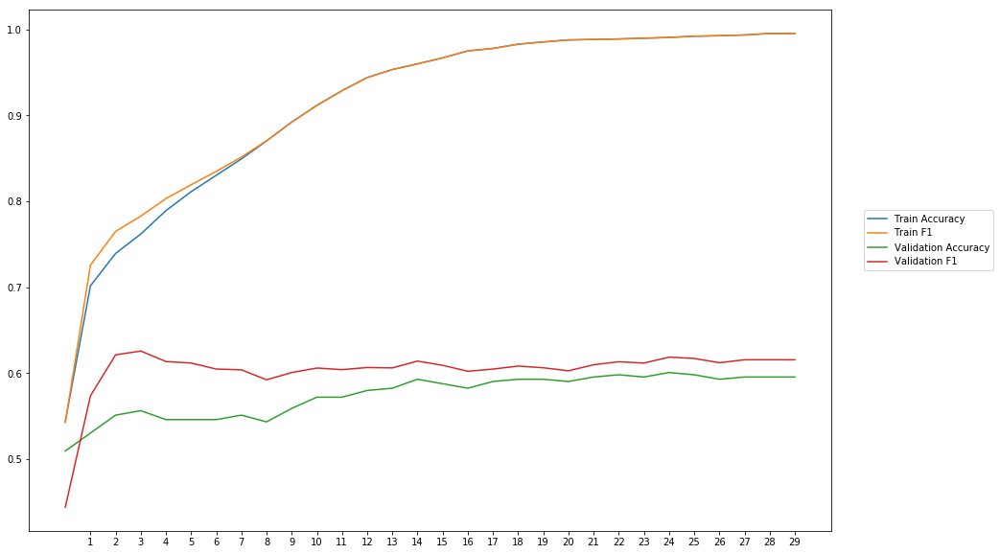

Average Accuracy: 57.45%
Average Precision: 56.47%
Average Recall: 65.03%
Average F1: 60.28%

-----Fold 8--------


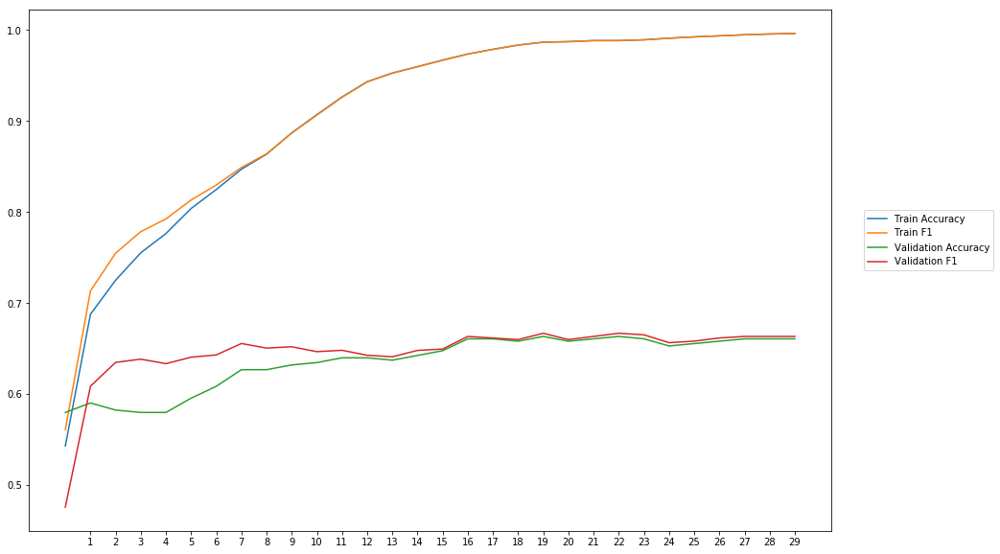

Average Accuracy: 63.58%
Average Precision: 62.90%
Average Recall: 66.89%
Average F1: 64.59%

-----Fold 9--------


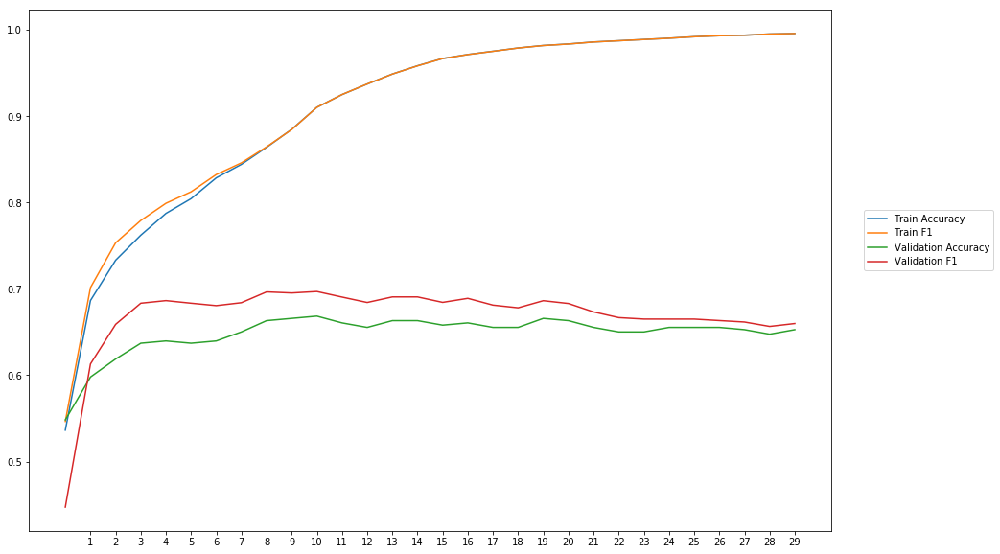

Average Accuracy: 64.80%
Average Precision: 62.84%
Average Recall: 71.90%
Average F1: 66.86%

-----Fold 10--------


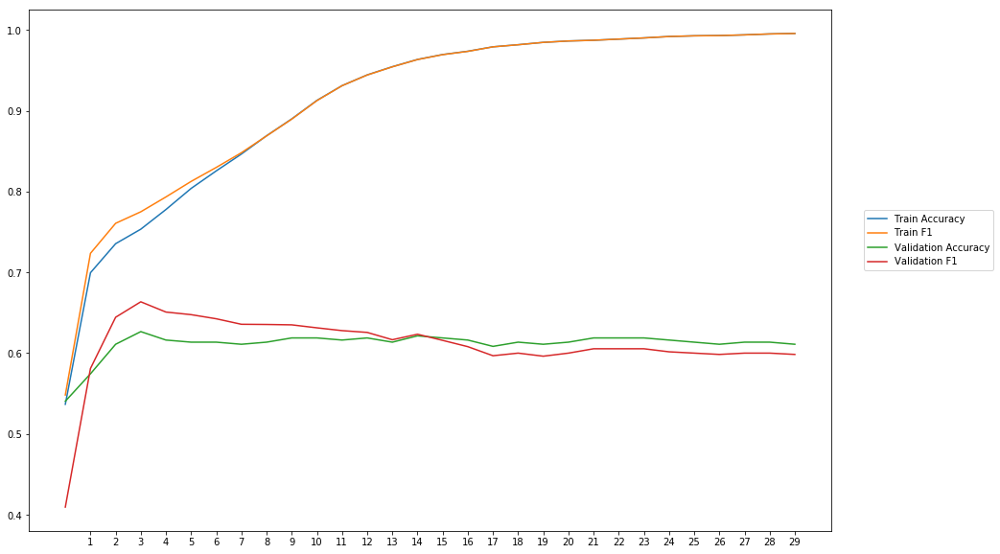

Average Accuracy: 61.15%
Average Precision: 60.96%
Average Recall: 61.57%
Average F1: 61.01%

-------Overallresults-------


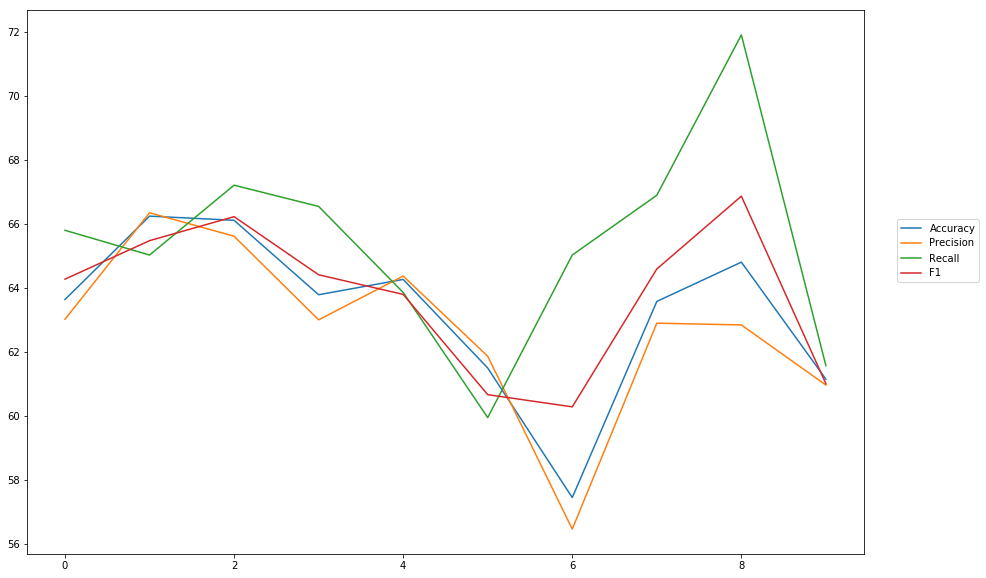

Accuracy: Mean = 63.25% (+/- 2.50%), Max = 66.24%, Min =  57.45%
Precision: Mean = 62.74% (+/- 2.60%), Max = 66.35%, Min =  56.47%
Recall: Mean = 65.38% (+/- 3.10%), Max = 71.90%, Min =  59.95%
F1: Mean = 63.76% (+/- 2.22%), Max = 66.86%, Min =  60.28%


In [9]:
cross_val(model_16, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'lexvec_cc')

### Common Crawl Subwords

In [15]:
word_vectors_lexvec_cc_sub = txt_embeddings(path+'lexvec.commoncrawl.300d.subword.vectors.txt')
EMBEDDING_DIM = 300
embedding_matrix_lexvec_cc_sub = create_eb_matrix(word_vectors_lexvec_cc_sub,EMBEDDING_DIM)

In [16]:
wv_layer_17 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_lexvec_cc_sub],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_17 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_17 = wv_layer_17(comment_input_17)

#First Dense Layer
x_17 = Dense(600, activation='relu')(embedded_sequences_17)

x_17 = Flatten()(x_17)

#Output (Dense) Layer
preds_17 = Dense(2, activation='softmax')(x_17)

# build the model
model_17 = Model(inputs=[comment_input_17], outputs=preds_17)


-----Fold 1--------


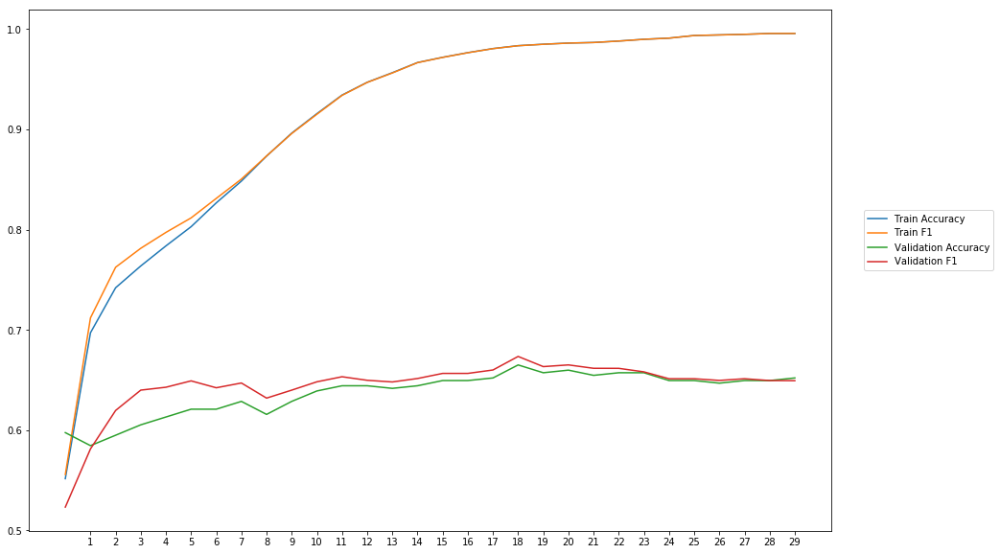

Average Accuracy: 63.73%
Average Precision: 63.11%
Average Recall: 66.01%
Average F1: 64.41%

-----Fold 2--------


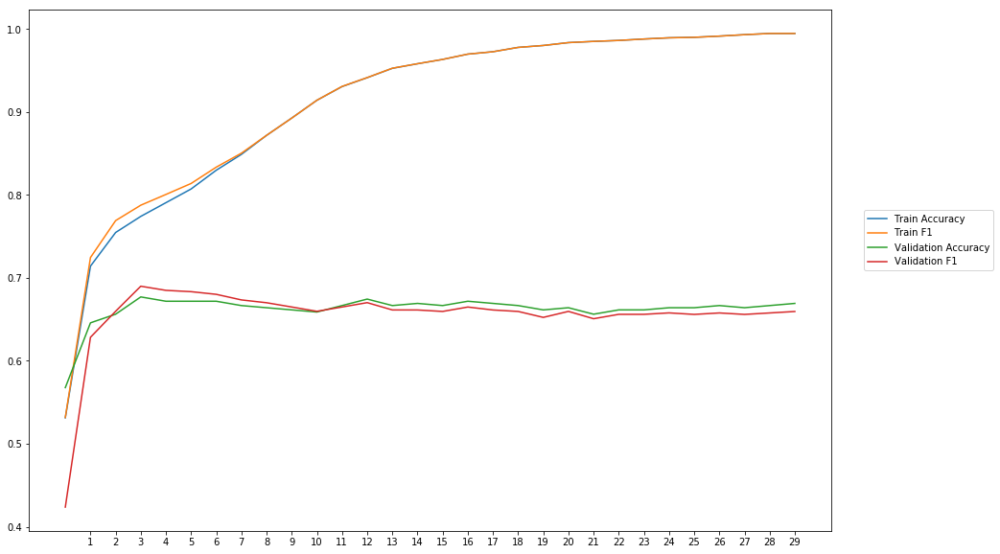

Average Accuracy: 66.22%
Average Precision: 66.34%
Average Recall: 65.01%
Average F1: 65.47%

-----Fold 3--------


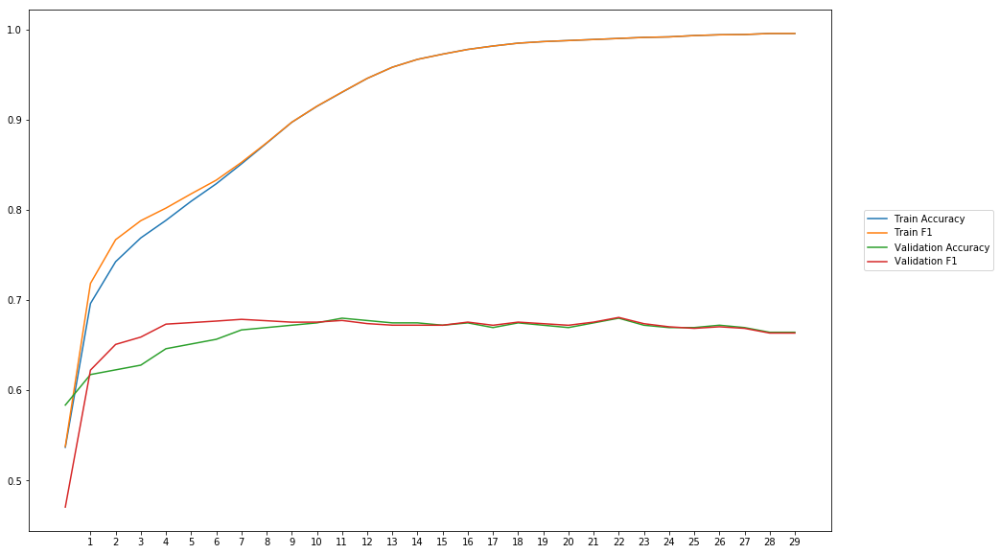

Average Accuracy: 66.19%
Average Precision: 65.67%
Average Recall: 67.38%
Average F1: 66.33%

-----Fold 4--------


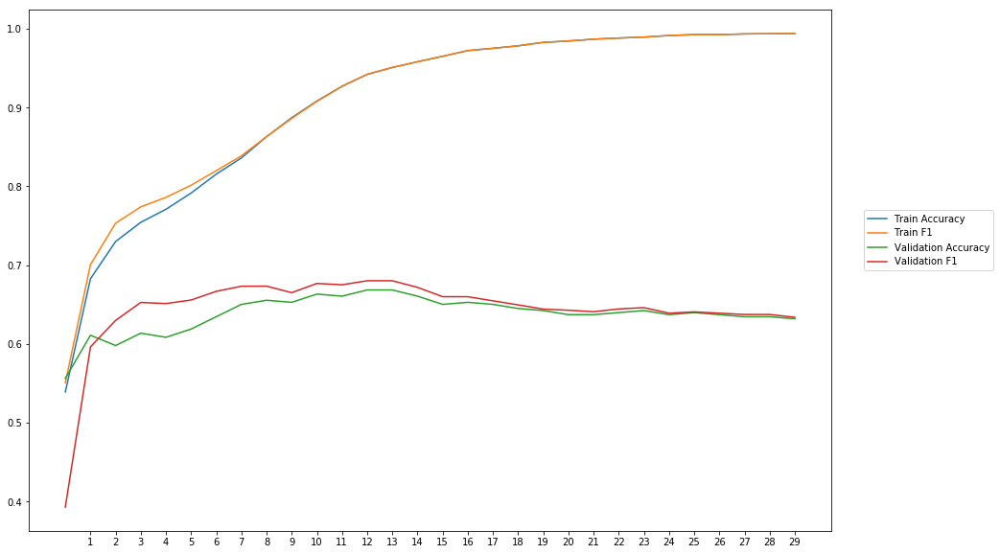

Average Accuracy: 63.77%
Average Precision: 63.03%
Average Recall: 66.40%
Average F1: 64.36%

-----Fold 5--------


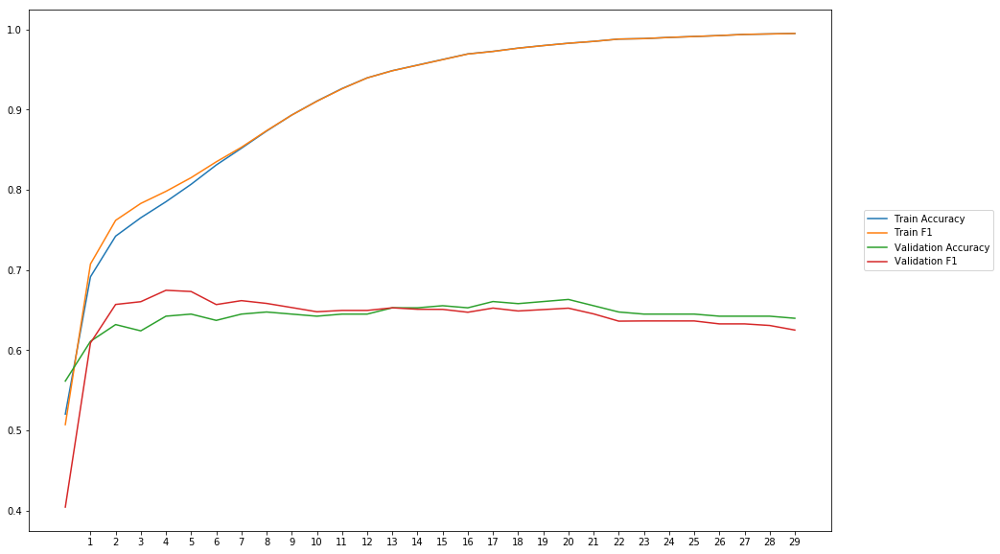

Average Accuracy: 64.27%
Average Precision: 64.29%
Average Recall: 64.12%
Average F1: 63.91%

-----Fold 6--------


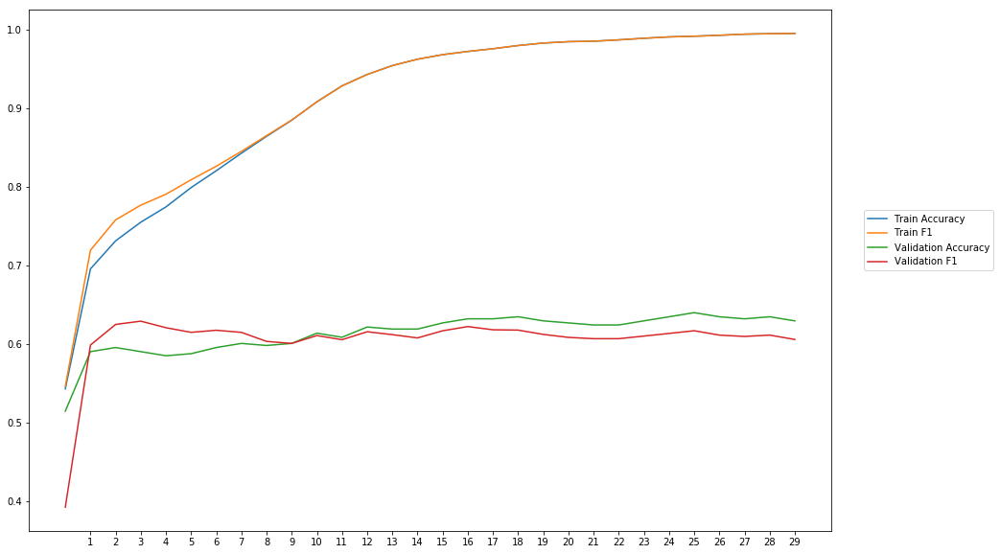

Average Accuracy: 61.33%
Average Precision: 61.70%
Average Recall: 59.76%
Average F1: 60.50%

-----Fold 7--------


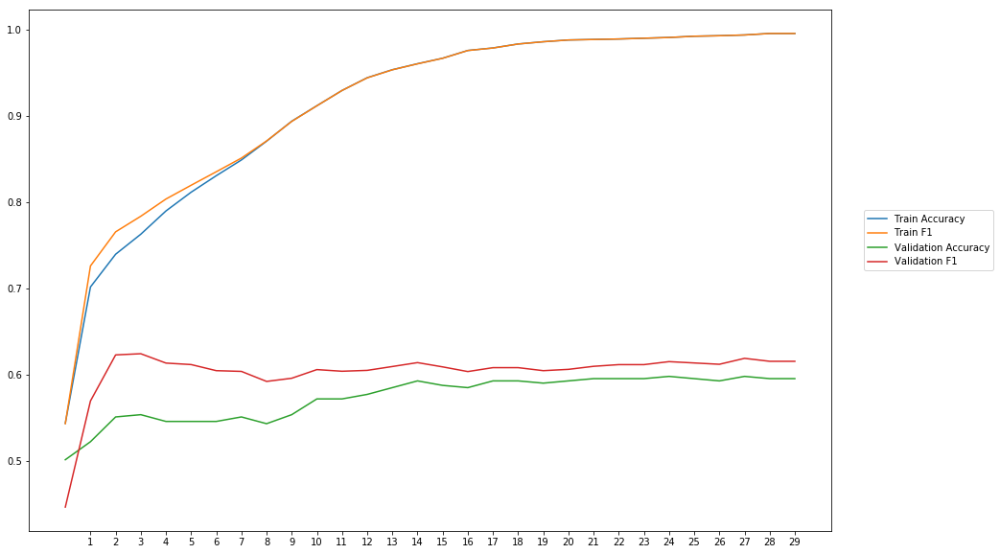

Average Accuracy: 57.37%
Average Precision: 56.38%
Average Recall: 65.10%
Average F1: 60.28%

-----Fold 8--------


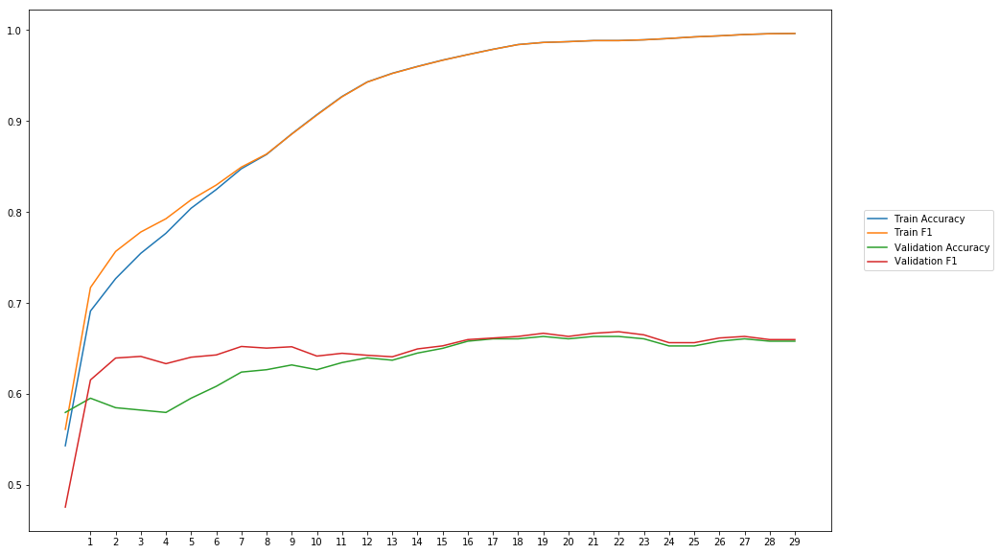

Average Accuracy: 63.57%
Average Precision: 62.86%
Average Recall: 67.00%
Average F1: 64.62%

-----Fold 9--------


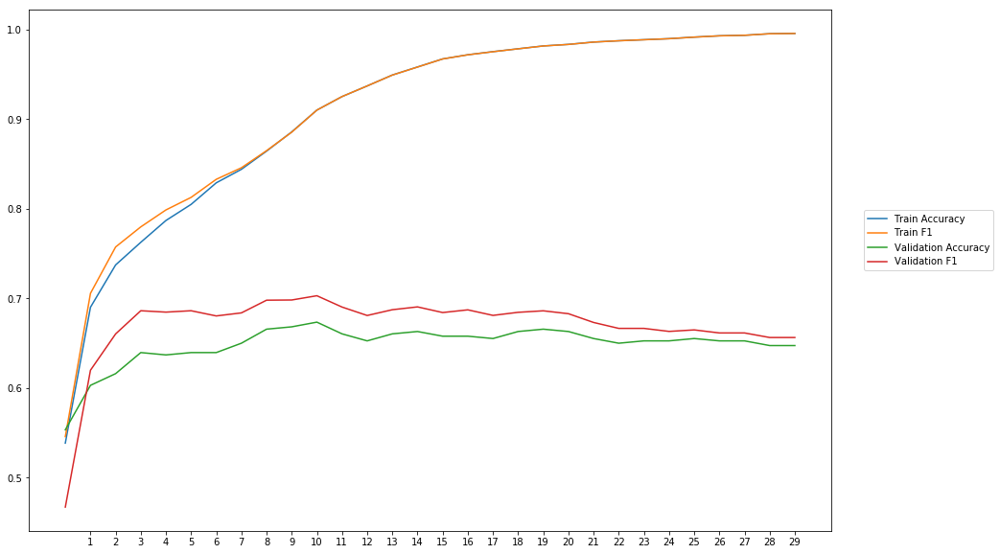

Average Accuracy: 64.85%
Average Precision: 62.85%
Average Recall: 72.13%
Average F1: 66.99%

-----Fold 10--------


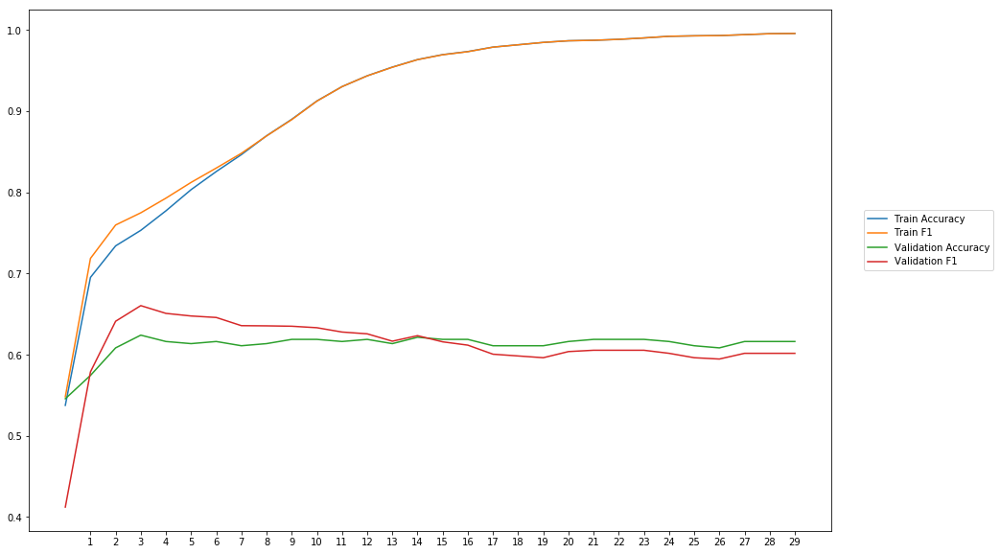

Average Accuracy: 61.19%
Average Precision: 61.04%
Average Recall: 61.57%
Average F1: 61.03%

-------Overallresults-------


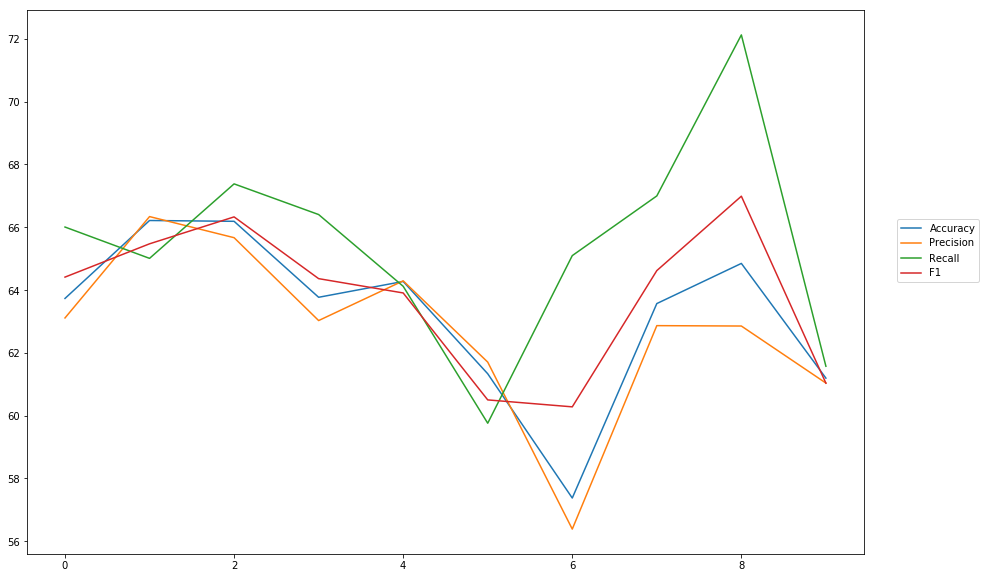

Accuracy: Mean = 63.25% (+/- 2.53%), Max = 66.22%, Min =  57.37%
Precision: Mean = 62.73% (+/- 2.62%), Max = 66.34%, Min =  56.38%
Recall: Mean = 65.45% (+/- 3.19%), Max = 72.13%, Min =  59.76%
F1: Mean = 63.79% (+/- 2.27%), Max = 66.99%, Min =  60.28%


In [13]:
cross_val(model_17, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'lexvec_cc_sub')

### Wikipedia + News Crawler

In [17]:
word_vectors_lexvec_wiki = vec_embeddings(path+'lexvec.enwiki+newscrawl.300d.W.pos.vectors')
EMBEDDING_DIM = 300
embedding_matrix_lexvec_wiki = create_eb_matrix(word_vectors_lexvec_wiki,EMBEDDING_DIM)

C:\Users\Anja Tetzner\Anaconda3\lib\site-packages\ipykernel_launcher.py:27: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).


In [18]:
wv_layer_18 = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_lexvec_wiki],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_18 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embedding Layer
embedded_sequences_18 = wv_layer_18(comment_input_18)

#First Dense Layer
x_18 = Dense(600, activation='relu')(embedded_sequences_18)

x_18 = Flatten()(x_18)

#Output (Dense) Layer
preds_18 = Dense(2, activation='softmax')(x_18)

# build the model
model_18 = Model(inputs=[comment_input_18], outputs=preds_18)


-----Fold 1--------


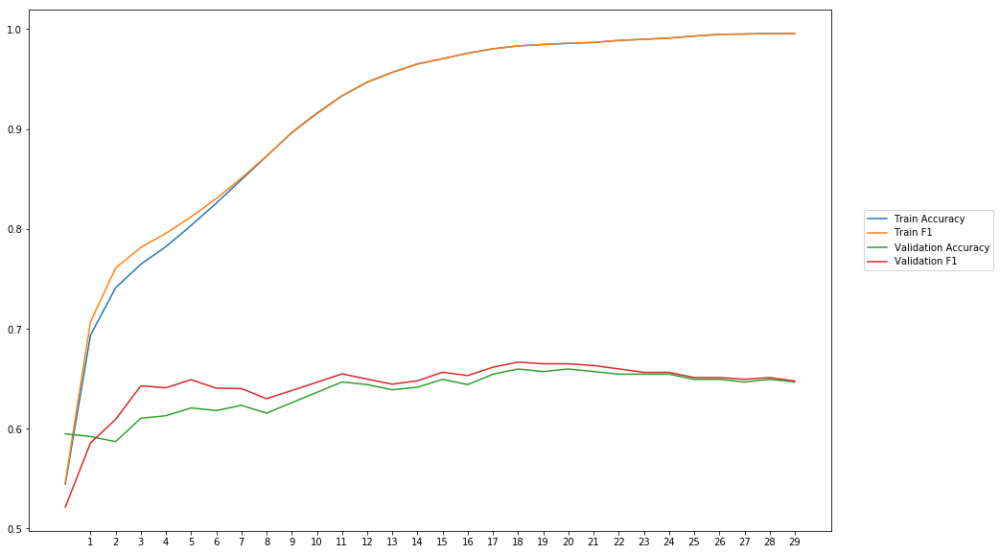

Average Accuracy: 63.65%
Average Precision: 63.03%
Average Recall: 65.89%
Average F1: 64.32%

-----Fold 2--------


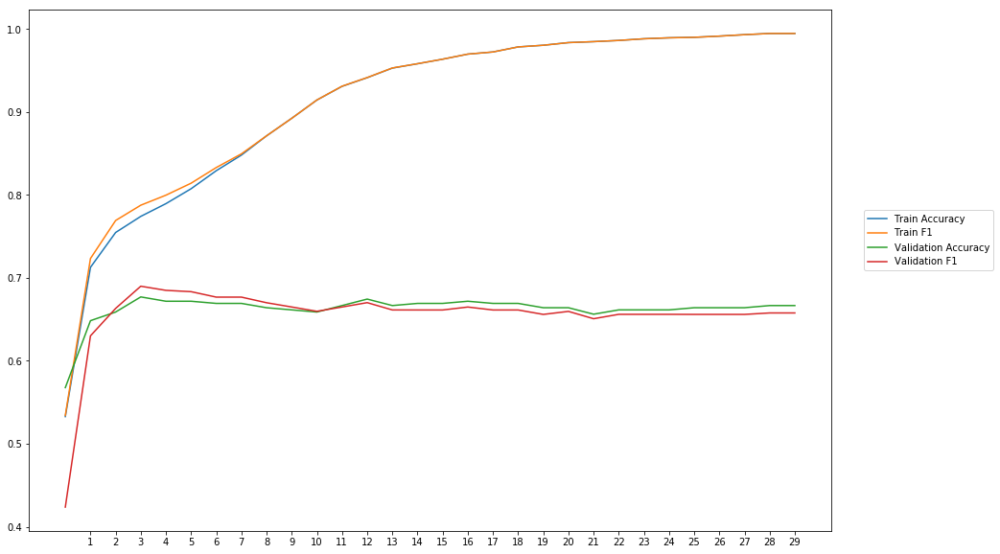

Average Accuracy: 66.23%
Average Precision: 66.35%
Average Recall: 65.04%
Average F1: 65.50%

-----Fold 3--------


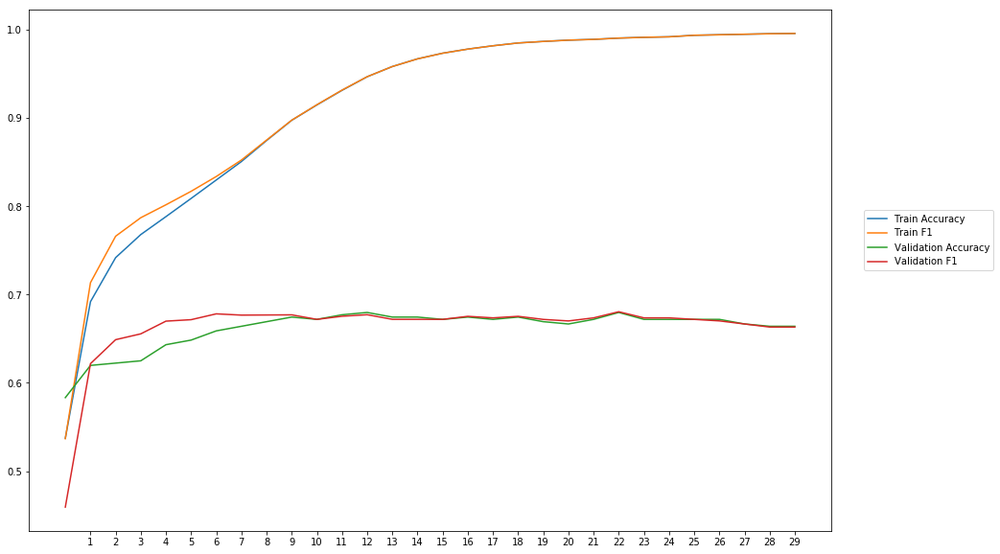

Average Accuracy: 66.16%
Average Precision: 65.67%
Average Recall: 67.28%
Average F1: 66.26%

-----Fold 4--------


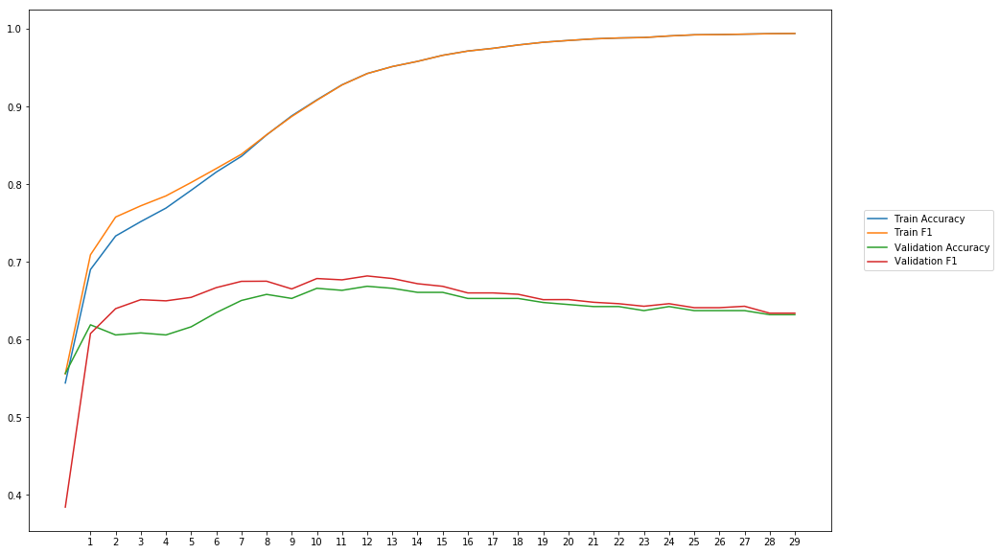

Average Accuracy: 63.93%
Average Precision: 63.15%
Average Recall: 66.81%
Average F1: 64.59%

-----Fold 5--------


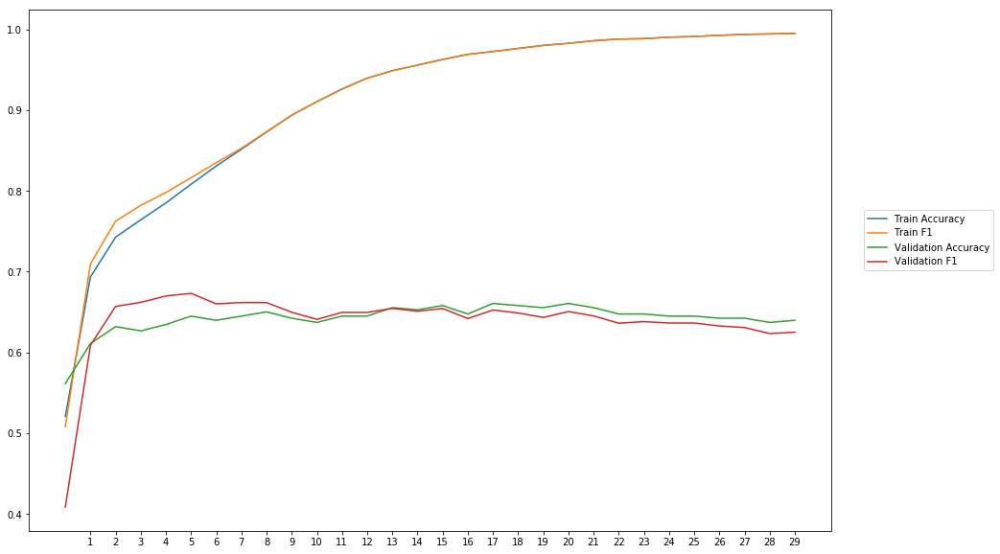

Average Accuracy: 64.21%
Average Precision: 64.24%
Average Recall: 64.03%
Average F1: 63.84%

-----Fold 6--------


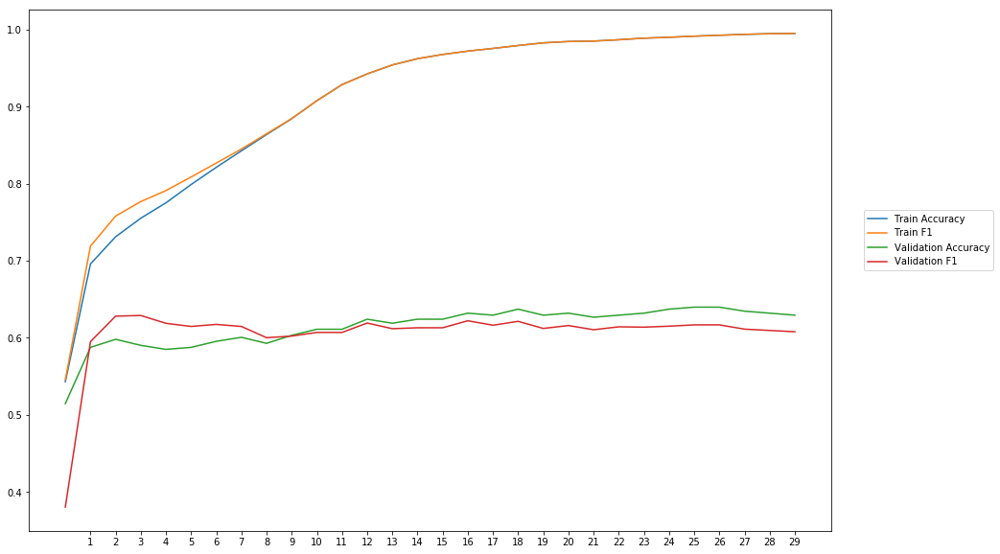

Average Accuracy: 61.42%
Average Precision: 61.78%
Average Recall: 59.84%
Average F1: 60.57%

-----Fold 7--------


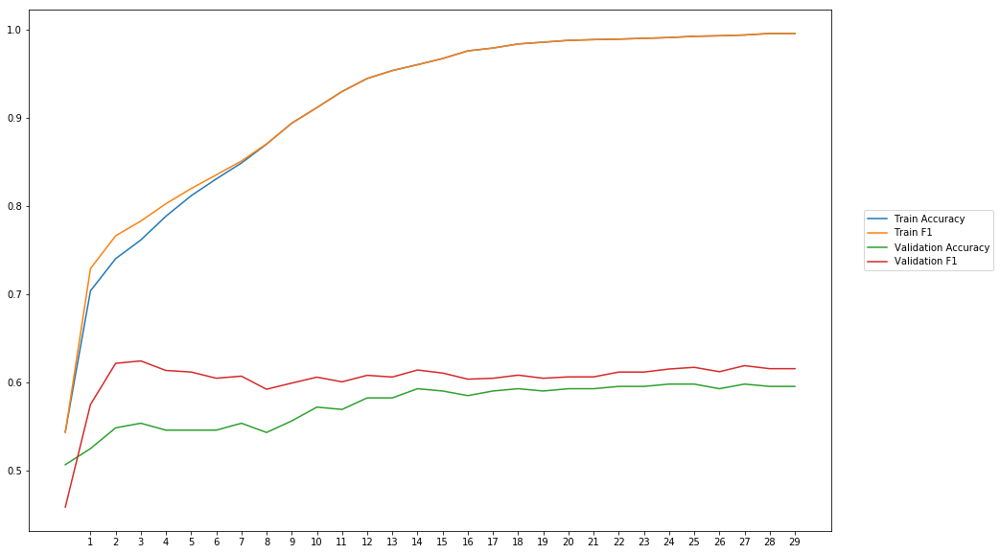

Average Accuracy: 57.41%
Average Precision: 56.42%
Average Recall: 65.17%
Average F1: 60.33%

-----Fold 8--------


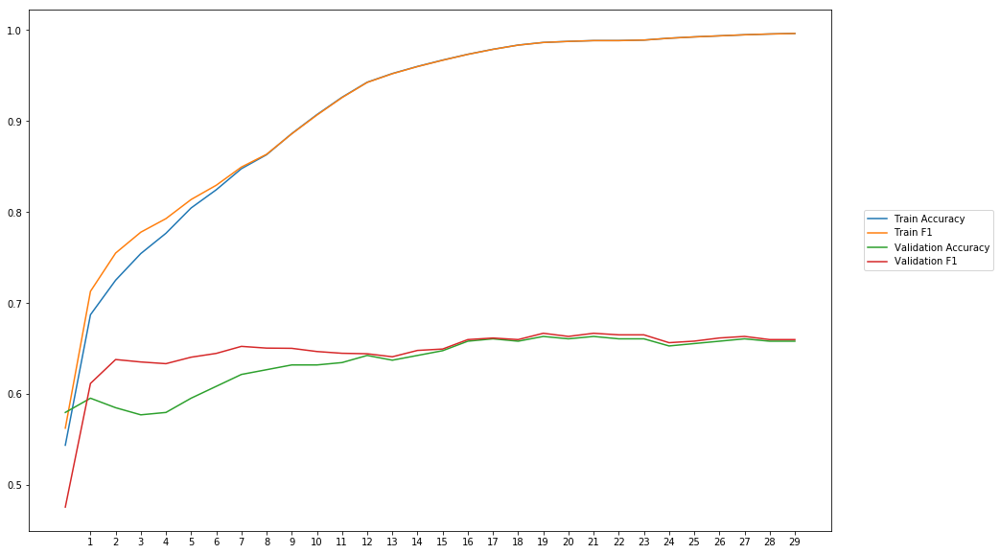

Average Accuracy: 63.54%
Average Precision: 62.86%
Average Recall: 66.89%
Average F1: 64.57%

-----Fold 9--------


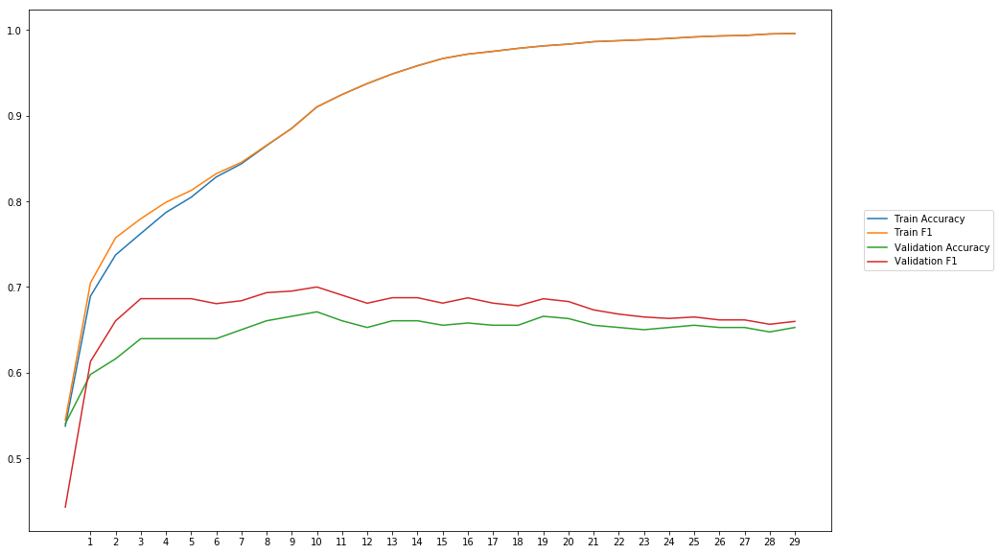

Average Accuracy: 64.73%
Average Precision: 62.75%
Average Recall: 71.90%
Average F1: 66.82%

-----Fold 10--------


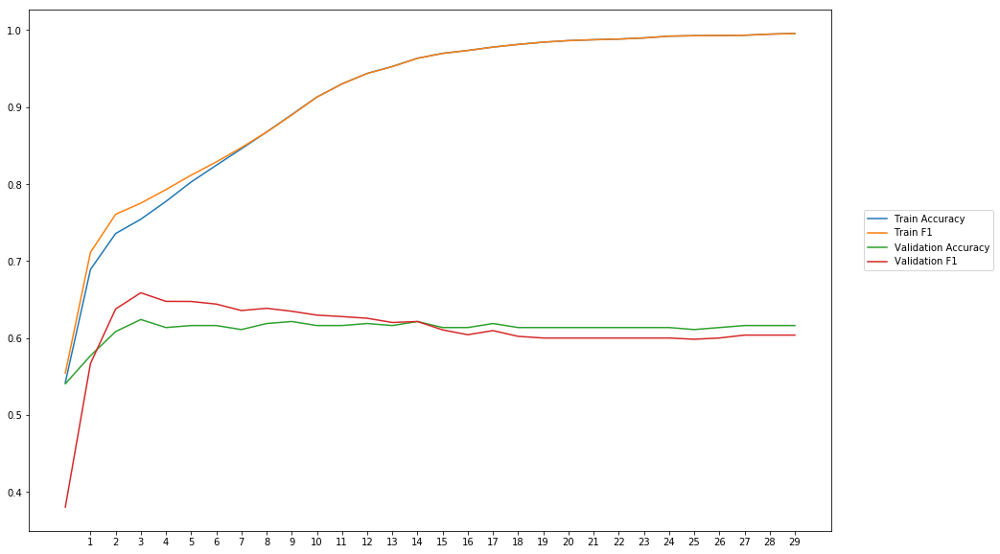

Average Accuracy: 61.17%
Average Precision: 61.05%
Average Recall: 61.24%
Average F1: 60.84%

-------Overallresults-------


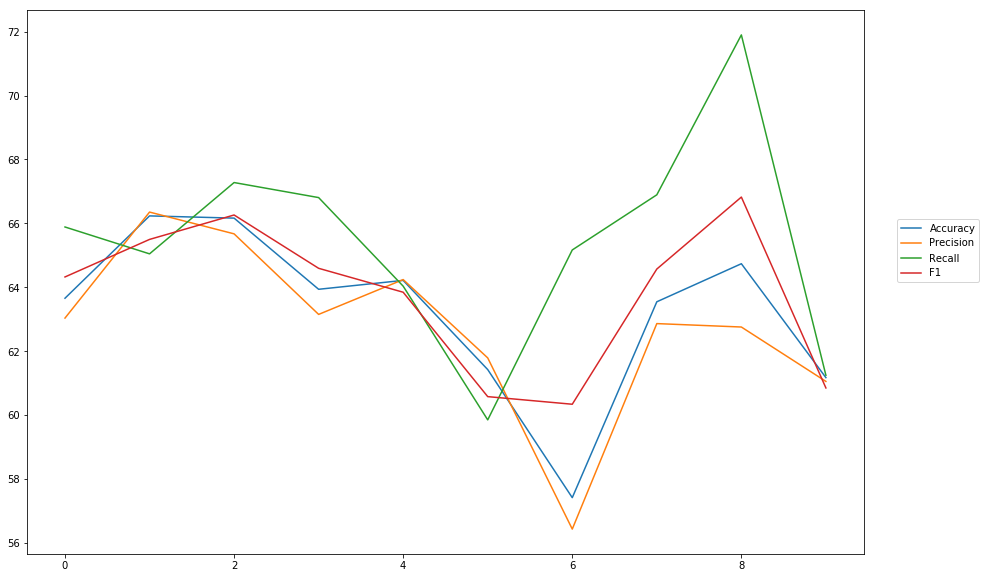

Accuracy: Mean = 63.25% (+/- 2.51%), Max = 66.23%, Min =  57.41%
Precision: Mean = 62.73% (+/- 2.60%), Max = 66.35%, Min =  56.42%
Recall: Mean = 65.41% (+/- 3.17%), Max = 71.90%, Min =  59.84%
F1: Mean = 63.76% (+/- 2.25%), Max = 66.82%, Min =  60.33%


In [16]:
cross_val(model_18, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'lexvec_wiki')

## Kombination GloVe and Google

In [24]:
word_vectors_google = bin_embeddings(path+'GoogleNews-vectors-negative300.bin')
word_vectors_glove = txt_embeddings(path+'glove.42B.300d.txt')
EMBEDDING_DIM = 300
embedding_matrix_google = create_eb_matrix(word_vectors_google,EMBEDDING_DIM)
embedding_matrix_glove = create_eb_matrix(word_vectors_glove, EMBEDDING_DIM)

C:\Users\twitter\Anaconda3\lib\site-packages\ipykernel_launcher.py:32: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).


In [30]:
wv_layer_19_google = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_google],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

wv_layer_19_glove = Embedding(len(word_index)+1,
                 EMBEDDING_DIM,
                 weights=[embedding_matrix_glove],
                 input_length=MAX_SEQUENCE_LENGTH,
                 trainable=True)

#Input Layer
comment_input_19 = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32')

#Embeddings
embedded_sequences_19_google = wv_layer_19_google(comment_input_19)
embedded_sequences_19_glove = wv_layer_19_glove(comment_input_19)
embedded_sequences_19 = concatenate([embedded_sequences_19_google,embedded_sequences_19_glove])

#First Dense Layer
x_19 = Dense(600, activation='relu')(embedded_sequences_19)

x_19 = Flatten()(x_19)

#Output (Dense) Layer
preds_19 = Dense(2, activation='softmax')(x_19)

# build the model
model_19 = Model(inputs=[comment_input_19], outputs=preds_19)


-----Fold 1--------


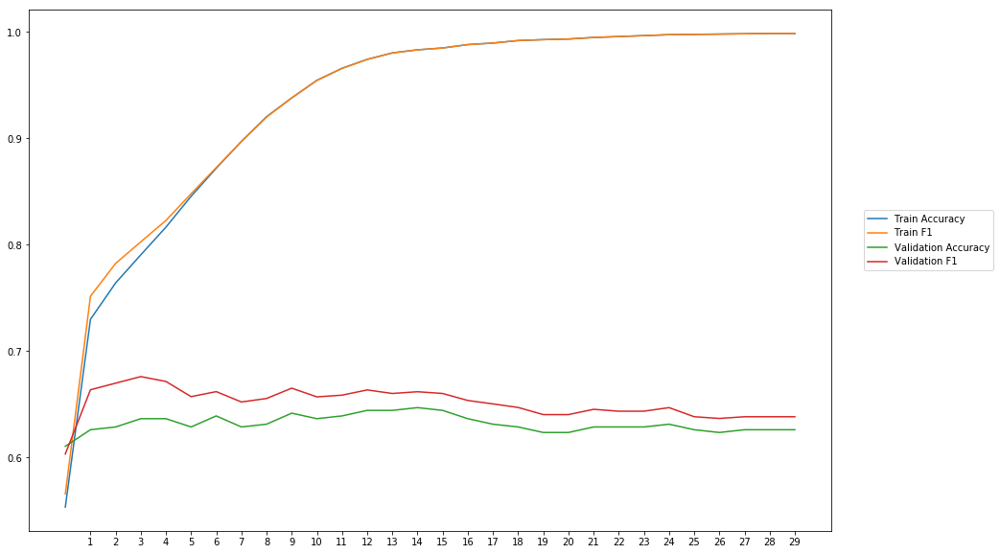

Average Accuracy: 63.16%
Average Precision: 61.69%
Average Recall: 69.05%
Average F1: 65.12%

-----Fold 2--------


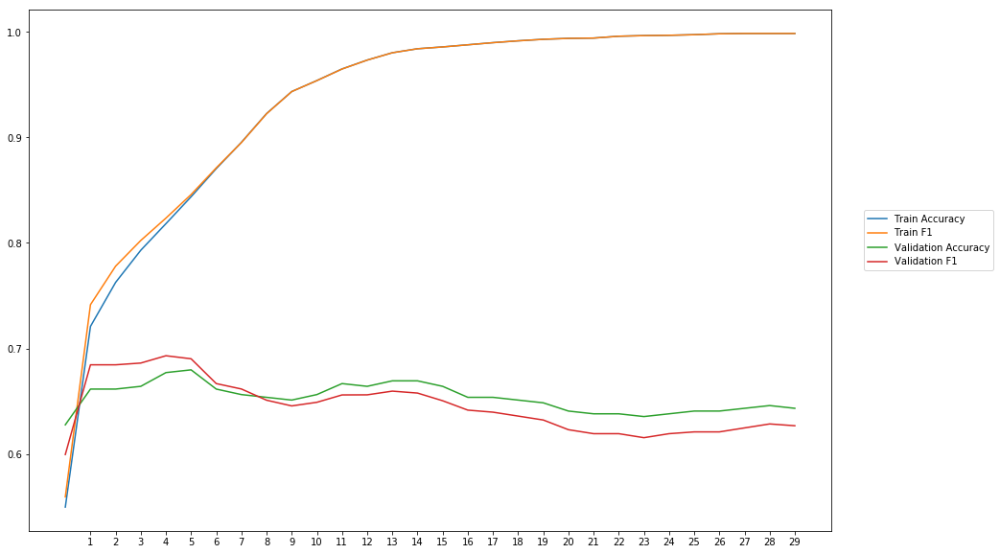

Average Accuracy: 65.31%
Average Precision: 65.61%
Average Recall: 63.68%
Average F1: 64.52%

-----Fold 3--------


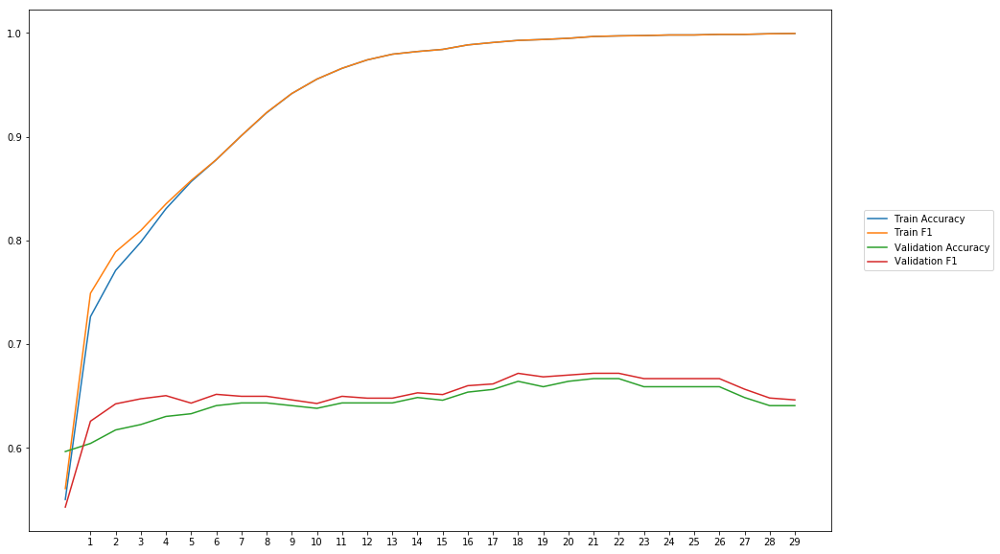

Average Accuracy: 64.43%
Average Precision: 63.56%
Average Recall: 66.86%
Average F1: 65.11%

-----Fold 4--------


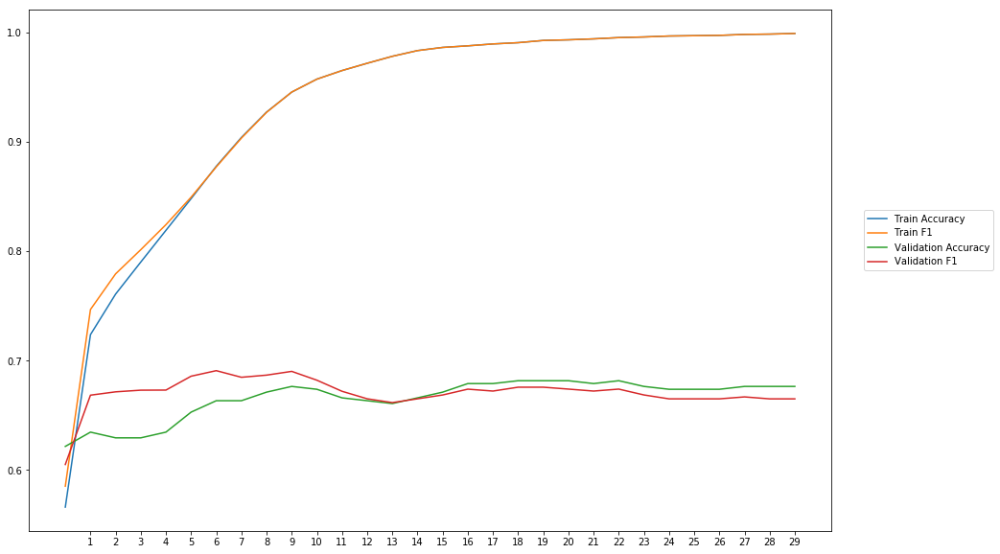

Average Accuracy: 66.54%
Average Precision: 66.12%
Average Recall: 68.38%
Average F1: 67.06%

-----Fold 5--------


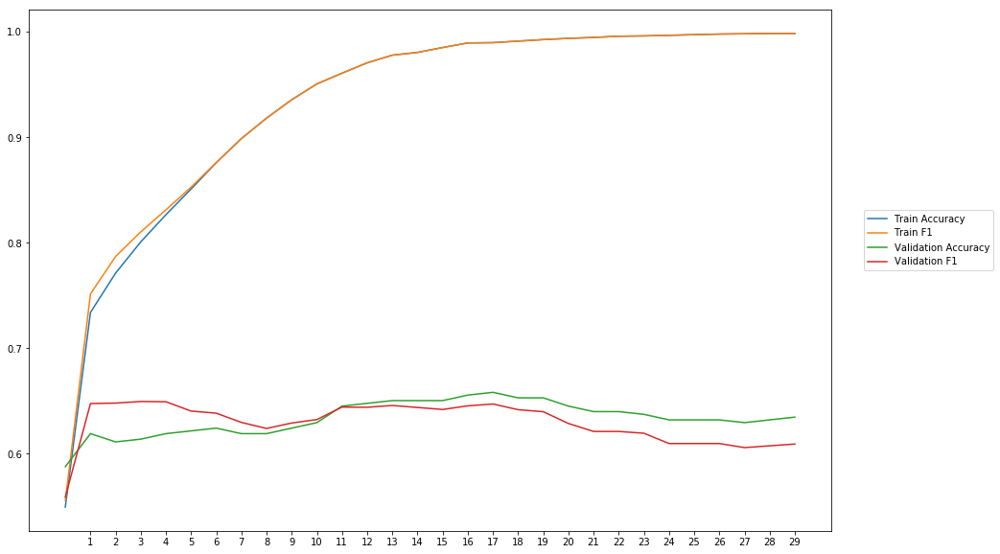

Average Accuracy: 63.33%
Average Precision: 63.62%
Average Recall: 62.55%
Average F1: 62.92%

-----Fold 6--------


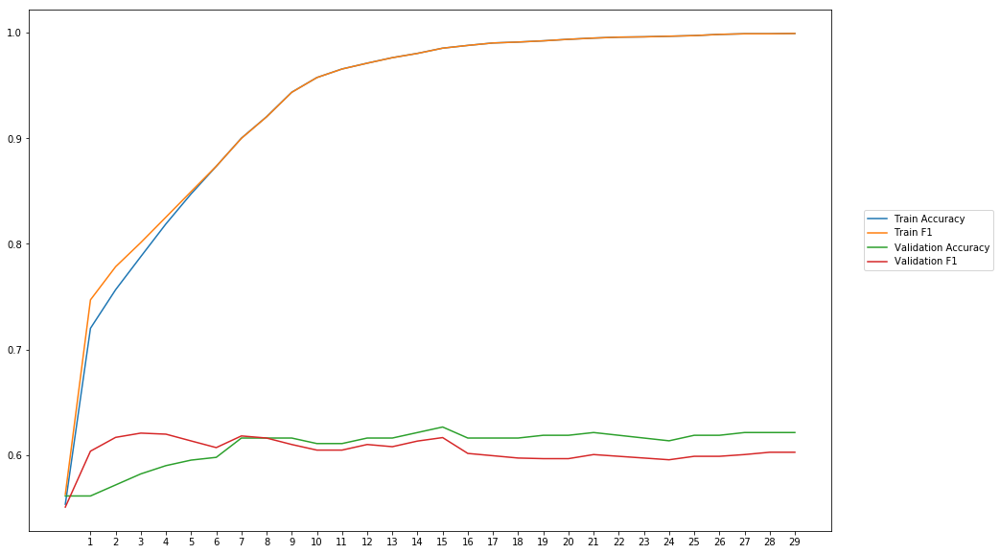

Average Accuracy: 60.90%
Average Precision: 61.22%
Average Recall: 59.90%
Average F1: 60.41%

-----Fold 7--------


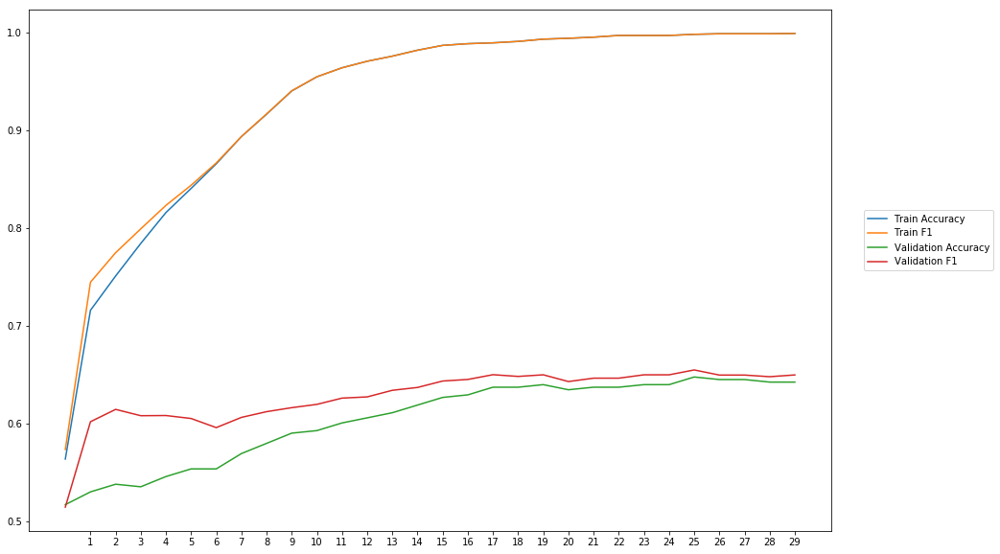

Average Accuracy: 60.40%
Average Precision: 59.41%
Average Recall: 66.95%
Average F1: 62.82%

-----Fold 8--------


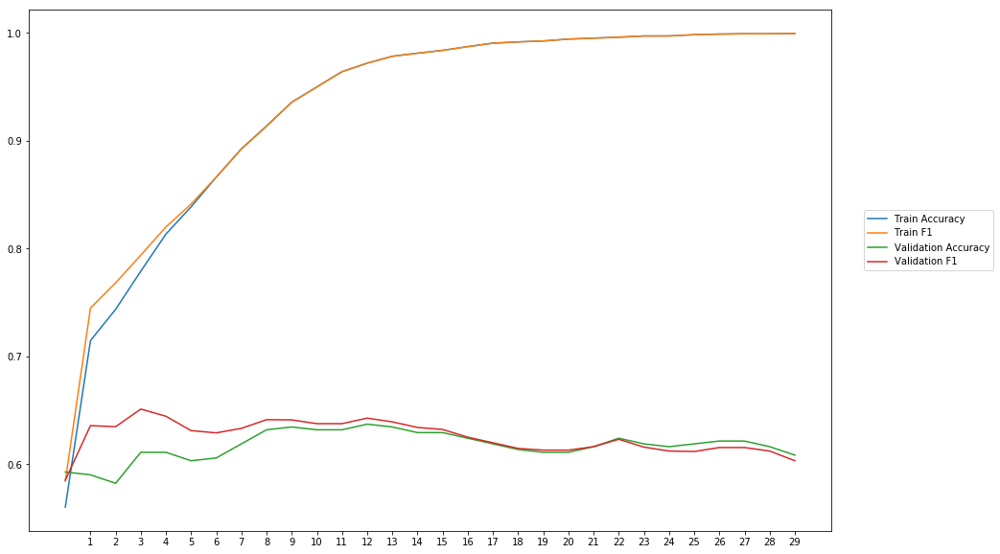

Average Accuracy: 61.71%
Average Precision: 61.16%
Average Recall: 64.17%
Average F1: 62.53%

-----Fold 9--------


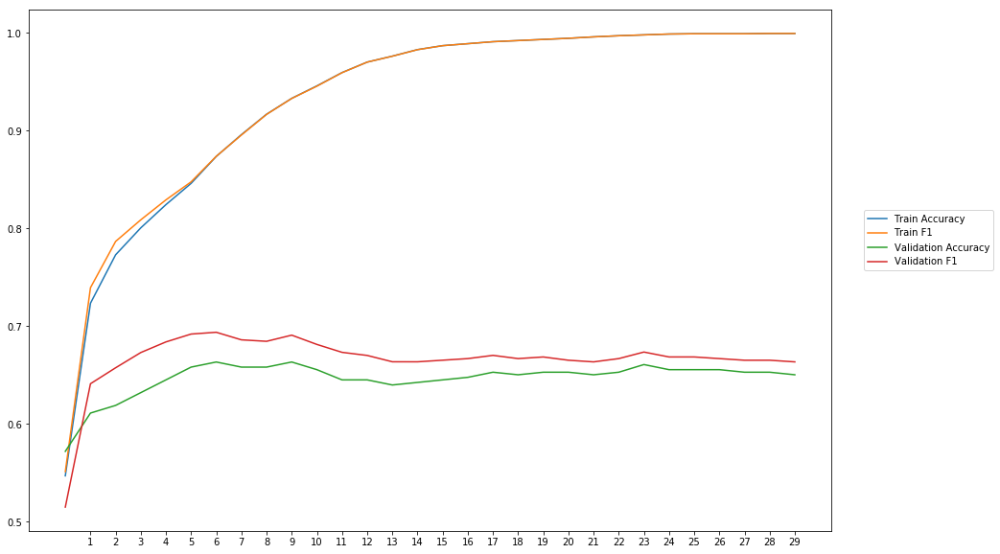

Average Accuracy: 64.64%
Average Precision: 62.91%
Average Recall: 70.89%
Average F1: 66.56%

-----Fold 10--------


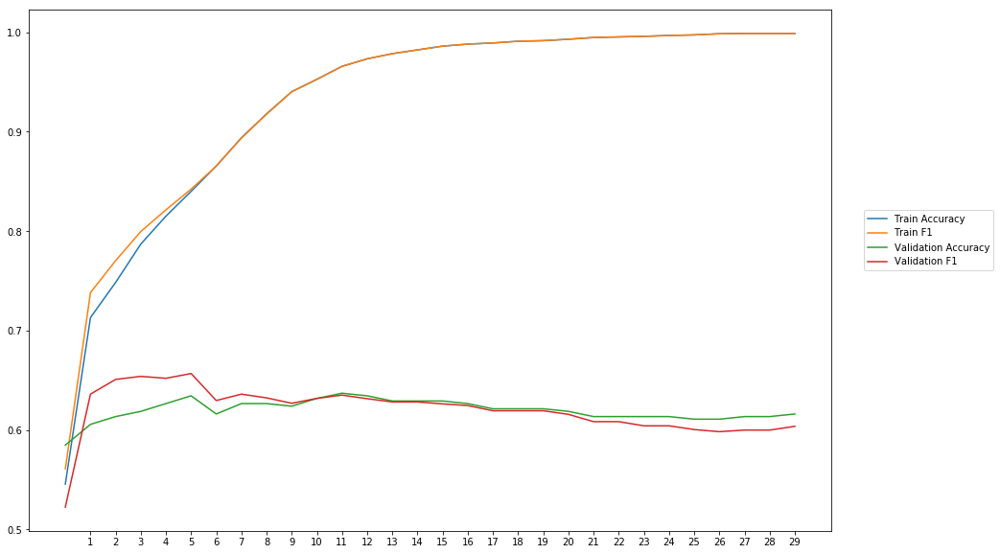

Average Accuracy: 61.99%
Average Precision: 61.81%
Average Recall: 62.50%
Average F1: 62.02%

-------Overallresults-------


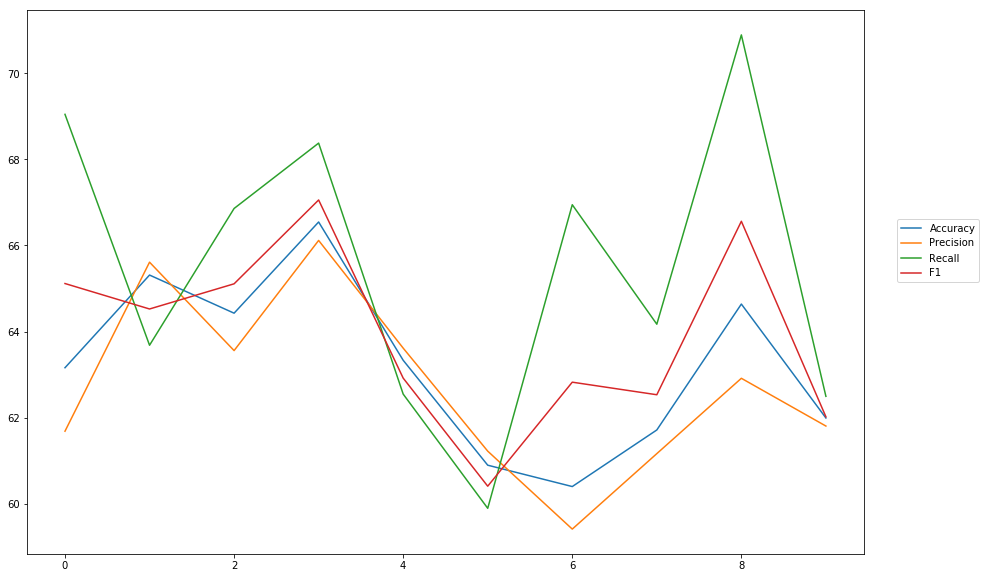

Accuracy: Mean = 63.24% (+/- 1.90%), Max = 66.54%, Min =  60.40%
Precision: Mean = 62.71% (+/- 1.97%), Max = 66.12%, Min =  59.41%
Recall: Mean = 65.49% (+/- 3.29%), Max = 70.89%, Min =  59.90%
F1: Mean = 63.91% (+/- 2.00%), Max = 67.06%, Min =  60.41%


In [31]:
cross_val(model_19, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, softmax, outputpath, 'kombine_google_glove')

## Test the best model with heldout testdata

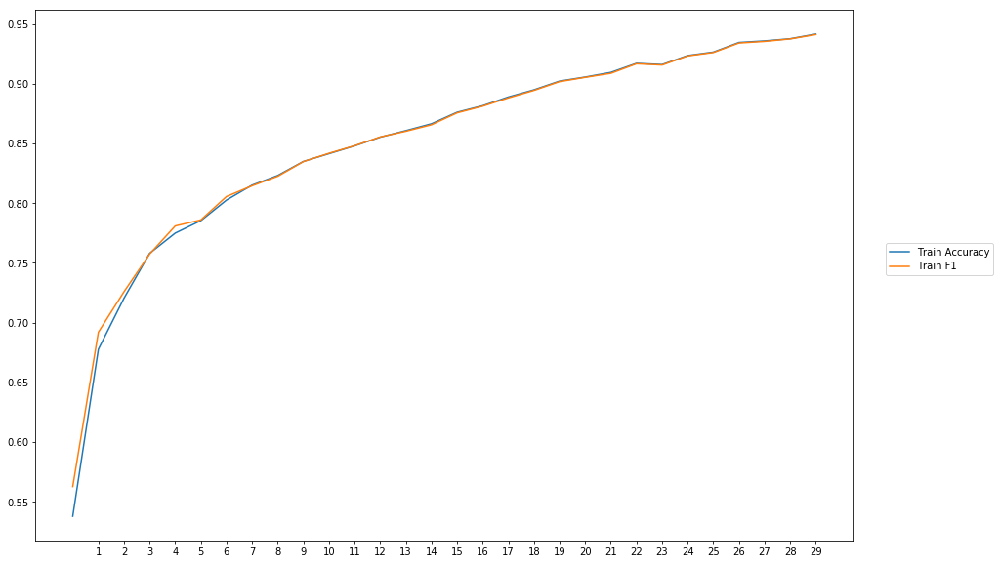


-----Test Scores----
Loss: 0.6627597991301089
Accuracy: 63.52040816326531
Precision: 53.351206420013085
Recall: 63.98713824309096
F1: 58.18712952699164


In [19]:
#Glove 42B, 300
train_evaluate_final_model(model_4, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, test_data, test_labels, softmax, outputpath, 'final_DifferentPretrainedEB_glove_42_300')

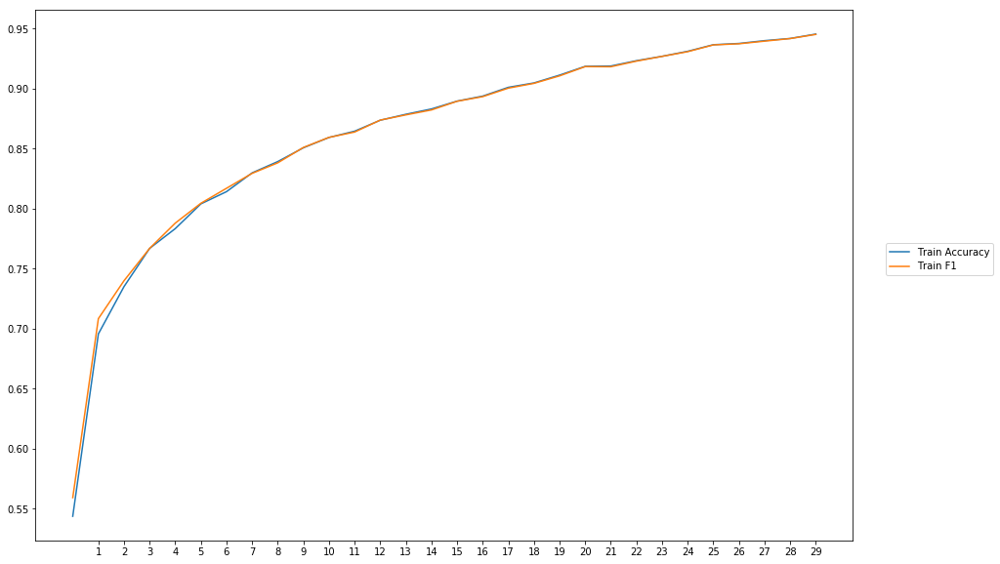


-----Test Scores----
Loss: 0.6541486856888752
Accuracy: 64.41326530612244
Precision: 54.27807485179731
Recall: 65.27331187611792
F1: 59.27006801768917


In [20]:
#Glove 6B, 300
train_evaluate_final_model(model_3, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, test_data, test_labels, softmax, outputpath, 'final_DifferentPretrainedEB_glove_6_300')

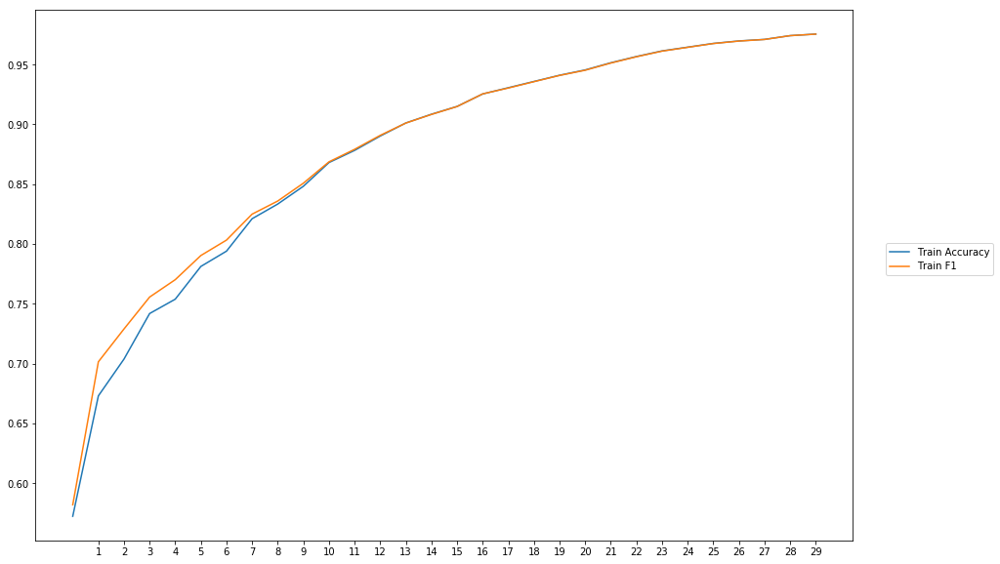


-----Test Scores----
Loss: 0.6183428654865343
Accuracy: 67.47448979591837
Precision: 57.48663100067203
Recall: 69.13183277519877
F1: 62.773717651702675


In [21]:
#fastText Wiki
train_evaluate_final_model(model_9, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, test_data, test_labels, softmax, outputpath, 'final_DifferentPretrainedEB_fasttext_wiki')

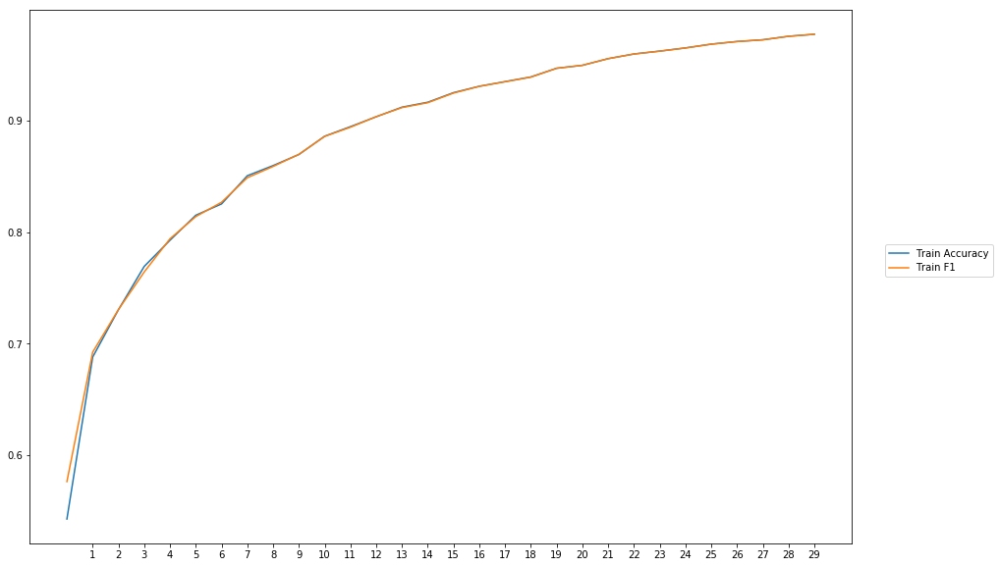


-----Test Scores----
Loss: 0.6162324918776142
Accuracy: 67.98469387755102
Precision: 57.653061209782386
Recall: 72.6688102660229
F1: 64.29586987027794


In [22]:
#Lexvec ComCr
train_evaluate_final_model(model_16, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, test_data, test_labels, softmax, outputpath, 'final_DifferentPretrainedEB_lexvec_ComCr')

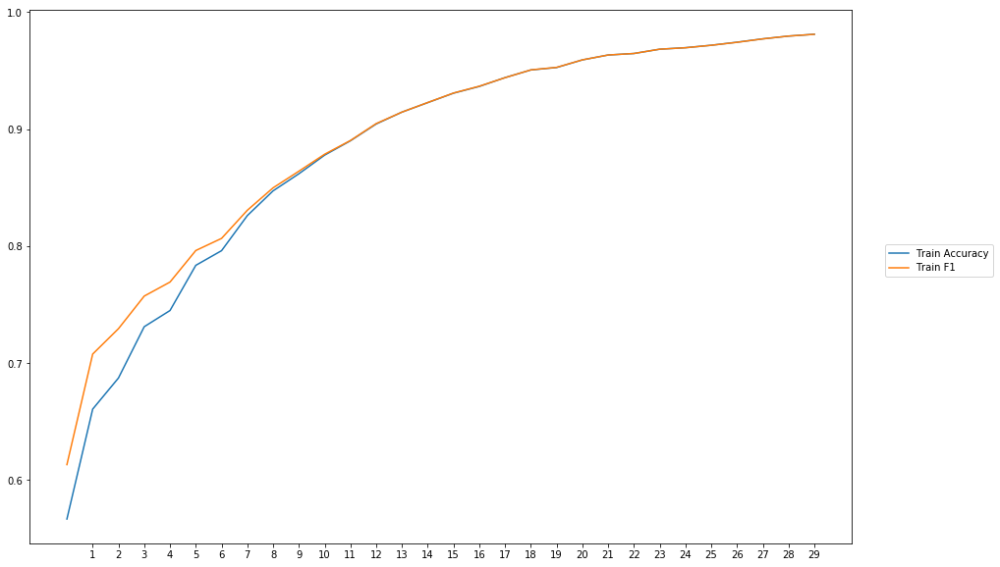


-----Test Scores----
Loss: 0.6354263856702921
Accuracy: 67.3469387755102
Precision: 58.017492694455555
Recall: 63.98713824309096
F1: 60.85626410651034


In [23]:
#Lexvec Common Crawl - subwords
train_evaluate_final_model(model_17, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, test_data, test_labels, softmax, outputpath, 'final_DifferentPretrainedEB_lexvec_ComCr_sub')

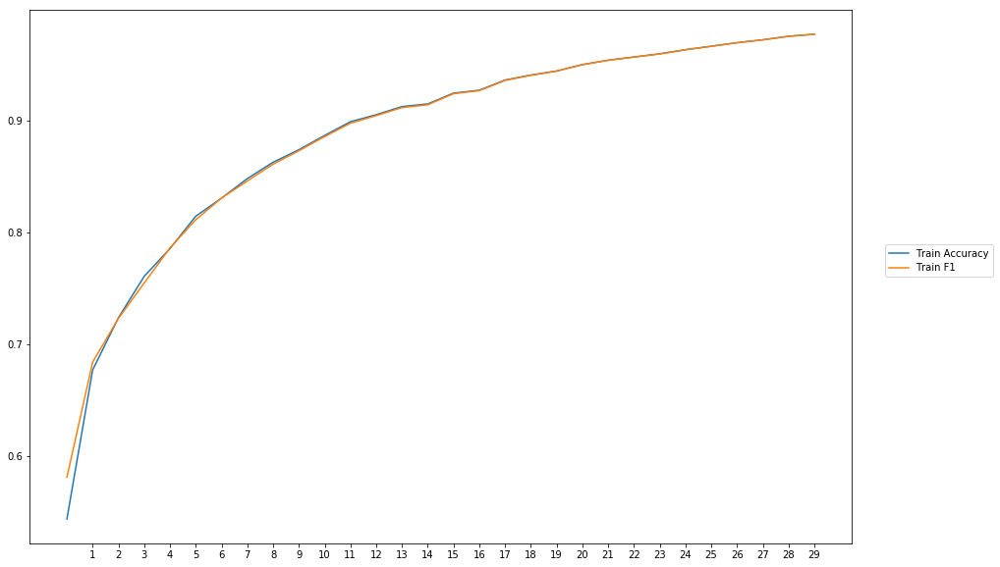


-----Test Scores----
Loss: 0.6133924345580899
Accuracy: 68.87755102040816
Precision: 58.52417301309818
Recall: 73.95498389904985
F1: 65.3409041401815


In [24]:
#Lexvec Wiki
train_evaluate_final_model(model_18, NUM_EPOCHS, BATCH_SIZE, optimizer, lossfunction, train_data, train_labels, test_data, test_labels, softmax, outputpath, 'final_DifferentPretrainedEB_lexvec_wiki')